In [ ]:
# list of the main packages and their versions of this notebook
# NOTE: Be sure to have these versions of cmdstanpy and arviz else the stan syntax wont work
# scikit-learn              1.8.0
# scipy                     1.17.1
# seaborn                   0.13.2
# arviz                     0.23.4
# cmdstanpy                 1.3.0
# illustris_python          1.1.1


import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import cmdstanpy
import arviz as az
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Windows-only: ensure rtools and TBB are on PATH
# os.environ['PATH'] += r';C:\rtools42\usr\bin;C:\rtools42\x86_64-w64-mingw32.static.posix\bin'
# cmdstan_path = cmdstanpy.cmdstan_path()
# os.environ['PATH'] += f';{cmdstan_path}/stan/lib/stan_math/lib/tbb'

sys.path.append(os.path.abspath(".."))
from analogues import AnalogueSample, SelectionConfig, FilterConfig

/users/abeerayy/myenv_new/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Stan Hierarchical Model r

Two Stan models are defined below: one fit on the full dataset (for inference and LG prediction)
and one with a train/test split (for held-out validation). In this notebook the features used will be separation — no mass proxy.

In [2]:
stan_r1 = """
data {
    int<lower=0> N;
    array[N] int<lower=1, upper=2> group;
    matrix[N, 1] X;           //  standardized: separation
    vector[N] y;              // log M200c
    vector[1] x_lg;
}

parameters {
    real mu_alpha;
    real<lower=0> sigma_alpha;
    vector[1] mu_beta;
    
    vector[2] alpha_raw;
    vector<lower=0>[1] sigma_beta;
    matrix[2, 1] beta_raw;
    
    real<lower=1e-3> sigma;
}

transformed parameters {
    vector[2] alpha;
    matrix[2,1] beta;
    vector[N] eta;

    alpha = mu_alpha + sigma_alpha * alpha_raw;

    for (g in 1:2) {
        for (k in 1:1) {
            beta[g, k] = mu_beta[k] + sigma_beta[k] * beta_raw[g, k];
        }
    }

    for (n in 1:N) {
        eta[n] = alpha[group[n]] + dot_product(beta[group[n]], X[n]);
        // eta[n] = fmin(fmax(eta[n], -20), 20);
    }
}

model {
    alpha_raw ~ normal(0, 1);
    to_vector(beta_raw) ~ normal(0, 1);
    
    mu_alpha ~ normal(12.6, 0.2);     // (3.17+-0.57) x10^12 ~LogM ~ 12.5 van der Marel et al. (2012)

    // Blue-blue peaks at 12-12.5, red-red extends to 13.8 (baryon efficiency plot from EDA)
    // Expecting ~0.3-0.5 dex difference between groups
    sigma_alpha ~ exponential(2);  // The blue-blue and red-red intercepts are expected to differ by at most 0.2-0.3 dex based on the baryon efficiency plot from EDA, with the prior centered to reflect this modest group-level variation.

    // Using weakly informed prior centered at zero to allow the data to determine both the direction and magnitude of the effect

    // Couldnt find any relation in literature so using a weak prior not really expecting a relation.
    mu_beta[1] ~ normal(0.0, 0.2);   // separation: weak prior

    // group variation in coefficients
    // Does not allow extreme differences but only small ones which makes sense from EDA
    sigma_beta ~ exponential(10);    // half-normal effectively since sigma_beta > 0
    // Residual scatter truncated to only be positive
    // From Moser et al (2013)
    sigma ~ normal(0.3, 0.1); // obs scatter is between 0.15 intrinsic physical scatter from the above resource. We choose slightly higher value
    
    for (n in 1:N) {
        y[n] ~ normal(eta[n], sigma);
    }
       
}

generated quantities {
    vector[N] y_rep;
    vector[N] log_lik; 
    vector[N] eta_rep;
    real y_lg_bb;
    real y_lg_rr; 

    // LG predictions 
    y_lg_bb = normal_rng(alpha[1] + dot_product(beta[1], x_lg), sigma);
    y_lg_rr = normal_rng(alpha[2] + dot_product(beta[2], x_lg), sigma);

    for (n in 1:N) {
        y_rep[n] = normal_rng(
            alpha[group[n]] + dot_product(beta[group[n]], X[n]),
            sigma
        );
        log_lik[n] = normal_lpdf(y[n] | 
            alpha[group[n]] + dot_product(beta[group[n]], X[n]),
            sigma
        );  
    }


    for (n in 1:N) {
        eta_rep[n] = alpha[group[n]] + dot_product(beta[group[n]], X[n]);
    }
}
"""

In [3]:
stan_r2 = """
data {
    int<lower=0> N_train;
    int<lower=0> N_test;
    array[N_train] int<lower=1, upper=2> group_train;
    array[N_test] int<lower=1, upper=2> group_test;
    matrix[N_train, 1] X_train;
    matrix[N_test, 1] X_test;
    vector[N_train] y_train;
    vector[1] x_lg;
}

parameters {
    real mu_alpha;
    real<lower=0> sigma_alpha;
    vector[1] mu_beta;
    vector<lower=0>[1] sigma_beta;
    
    vector[2] alpha_raw;
    matrix[2, 1] beta_raw;
    
    real<lower=1e-3> sigma;
}

transformed parameters {
    vector[2] alpha;
    matrix[2,1] beta;

    alpha = mu_alpha + sigma_alpha * alpha_raw;

    for (g in 1:2) {
        for (k in 1:1) {
            beta[g, k] = mu_beta[k] + sigma_beta[k] * beta_raw[g, k];
        }
    }
}

model {
    alpha_raw ~ normal(0, 1);
    to_vector(beta_raw) ~ normal(0, 1);
    
    mu_alpha ~ normal(12.6, 0.2);
    sigma_alpha ~ exponential(2);
    
    mu_beta[1] ~ normal(0.0, 0.2);

    sigma_beta ~ exponential(10);
    sigma ~ normal(0.3, 0.1);
    
    for (n in 1:N_train)
        y_train[n] ~ normal(
            alpha[group_train[n]] + dot_product(beta[group_train[n]], X_train[n]),
            sigma
        );
}

generated quantities {
    vector[N_train] y_rep_train;
    vector[N_train] log_lik;
    vector[N_test] y_rep_test;
    real y_lg_bb;
    real y_lg_rr;

    for (n in 1:N_train) {
        y_rep_train[n] = normal_rng(
            alpha[group_train[n]] + dot_product(beta[group_train[n]], X_train[n]),
            sigma
        );
        log_lik[n] = normal_lpdf(y_train[n] |
            alpha[group_train[n]] + dot_product(beta[group_train[n]], X_train[n]),
            sigma
        );
    }
    
    for (n in 1:N_test) {
        y_rep_test[n] = normal_rng(
            alpha[group_test[n]] + dot_product(beta[group_test[n]], X_test[n]),
            sigma
        );
    }

    y_lg_bb = normal_rng(alpha[1] + dot_product(beta[1], x_lg), sigma);
    y_lg_rr = normal_rng(alpha[2] + dot_product(beta[2], x_lg), sigma);
}
"""

## Stan Hierarchical Model v_r

Two Stan models are defined below: one fit on the full dataset (for inference and LG prediction)
and one with a train/test split (for held-out validation). In this notebook the features used will be radial velocity and separation — no mass proxy.

In [4]:
stan_vr1 = """
data {
    int<lower=0> N;
    array[N] int<lower=1, upper=2> group;
    matrix[N, 2] X;           //  standardized: v_r, separation
    vector[N] y;              // log M200c
    vector[2] x_lg;
}

parameters {
    real mu_alpha;
    real<lower=0> sigma_alpha;
    vector[2] mu_beta;
    
    vector[2] alpha_raw;
    vector<lower=0>[2] sigma_beta;
    matrix[2, 2] beta_raw;
    
    real<lower=1e-3> sigma;
}

transformed parameters {
    vector[2] alpha;
    matrix[2,2] beta;
    vector[N] eta;

    alpha = mu_alpha + sigma_alpha * alpha_raw;

    for (g in 1:2) {
        for (k in 1:2) {
            beta[g, k] = mu_beta[k] + sigma_beta[k] * beta_raw[g, k];
        }
    }

    for (n in 1:N) {
        eta[n] = alpha[group[n]] + dot_product(beta[group[n]], X[n]);
        // eta[n] = fmin(fmax(eta[n], -20), 20);
    }
}

model {
    alpha_raw ~ normal(0, 1);
    to_vector(beta_raw) ~ normal(0, 1);
    
    mu_alpha ~ normal(12.6, 0.2);     // (3.17+-0.57) x10^12 ~LogM ~ 12.5 van der Marel et al. (2012)

    // Blue-blue peaks at 12-12.5, red-red extends to 13.8 (baryon efficiency plot from EDA)
    // Expecting ~0.3-0.5 dex difference between groups
    sigma_alpha ~ exponential(2);  // The blue-blue and red-red intercepts are expected to differ by at most 0.2-0.3 dex based on the baryon efficiency plot from EDA, with the prior centered to reflect this modest group-level variation.

    // Using weakly informed prior centered at zero to allow the data to determine both the direction and magnitude of the effect

    mu_beta[1] ~ normal(0.0, 0.2);   // v_r: weak prior

    // Couldnt find any relation in literature so using a weak prior not really expecting a relation.
    mu_beta[2] ~ normal(0.0, 0.2);   // separation: weak prior

    // group variation in coefficients
    // Does not allow extreme differences but only small ones which makes sense from EDA
    sigma_beta ~ exponential(10);    // half-normal effectively since sigma_beta > 0
    // Residual scatter truncated to only be positive
    // From Moser et al (2013)
    sigma ~ normal(0.3, 0.1); // obs scatter is between 0.15 intrinsic physical scatter from the above resource. We choose slightly higher value
    
    for (n in 1:N) {
        y[n] ~ normal(eta[n], sigma);
    }
       
}

generated quantities {
    vector[N] y_rep;
    vector[N] log_lik; 
    vector[N] eta_rep;
    real y_lg_bb;
    real y_lg_rr; 

    // LG predictions 
    y_lg_bb = normal_rng(alpha[1] + dot_product(beta[1], x_lg), sigma);
    y_lg_rr = normal_rng(alpha[2] + dot_product(beta[2], x_lg), sigma);

    for (n in 1:N) {
        y_rep[n] = normal_rng(
            alpha[group[n]] + dot_product(beta[group[n]], X[n]),
            sigma
        );
        log_lik[n] = normal_lpdf(y[n] | 
            alpha[group[n]] + dot_product(beta[group[n]], X[n]),
            sigma
        );  
    }


    for (n in 1:N) {
        eta_rep[n] = alpha[group[n]] + dot_product(beta[group[n]], X[n]);
    }
}
"""

In [5]:
stan_vr2 = """
data {
    int<lower=0> N_train;
    int<lower=0> N_test;
    array[N_train] int<lower=1, upper=2> group_train;
    array[N_test] int<lower=1, upper=2> group_test;
    matrix[N_train, 2] X_train;
    matrix[N_test, 2] X_test;
    vector[N_train] y_train;
    vector[2] x_lg;
}

parameters {
    real mu_alpha;
    real<lower=0> sigma_alpha;
    vector[2] mu_beta;
    vector<lower=0>[2] sigma_beta;
    
    vector[2] alpha_raw;
    matrix[2, 2] beta_raw;
    
    real<lower=1e-3> sigma;
}

transformed parameters {
    vector[2] alpha;
    matrix[2,2] beta;

    alpha = mu_alpha + sigma_alpha * alpha_raw;

    for (g in 1:2) {
        for (k in 1:2) {
            beta[g, k] = mu_beta[k] + sigma_beta[k] * beta_raw[g, k];
        }
    }
}

model {
    alpha_raw ~ normal(0, 1);
    to_vector(beta_raw) ~ normal(0, 1);
    
    mu_alpha ~ normal(12.6, 0.2);
    sigma_alpha ~ exponential(2);
    
    mu_beta[1] ~ normal(0.0, 0.2);
    mu_beta[2] ~ normal(0.0, 0.2);

    sigma_beta ~ exponential(10);
    sigma ~ normal(0.3, 0.1);
    
    for (n in 1:N_train)
        y_train[n] ~ normal(
            alpha[group_train[n]] + dot_product(beta[group_train[n]], X_train[n]),
            sigma
        );
}

generated quantities {
    vector[N_train] y_rep_train;
    vector[N_train] log_lik;
    vector[N_test] y_rep_test;
    real y_lg_bb;
    real y_lg_rr;

    for (n in 1:N_train) {
        y_rep_train[n] = normal_rng(
            alpha[group_train[n]] + dot_product(beta[group_train[n]], X_train[n]),
            sigma
        );
        log_lik[n] = normal_lpdf(y_train[n] |
            alpha[group_train[n]] + dot_product(beta[group_train[n]], X_train[n]),
            sigma
        );
    }
    
    for (n in 1:N_test) {
        y_rep_test[n] = normal_rng(
            alpha[group_test[n]] + dot_product(beta[group_test[n]], X_test[n]),
            sigma
        );
    }

    y_lg_bb = normal_rng(alpha[1] + dot_product(beta[1], x_lg), sigma);
    y_lg_rr = normal_rng(alpha[2] + dot_product(beta[2], x_lg), sigma);
}
"""

## Stan Hierarchical Model v_t

Two Stan models are defined below: one fit on the full dataset (for inference and LG prediction)
and one with a train/test split (for held-out validation). In this notebook the features used will be v_t, radial velocity and separation — no mass proxy.

In [6]:
stan_vt1 = """
data {
    int<lower=0> N;
    array[N] int<lower=1, upper=2> group;
    matrix[N, 3] X;
    vector[N] y;              // log M200c
    vector[3] x_lg;
    vector[N] vt_obs;         // observed (standardised) v_t values
    vector<lower=0>[N] vt_sigma; // per-pair measurement uncertainty (standardised)
}

parameters {
    real mu_alpha;
    real<lower=0> sigma_alpha;
    vector[3] mu_beta;
    
    vector[2] alpha_raw;
    vector<lower=0>[3] sigma_beta;
    matrix[2, 3] beta_raw;
    
    real<lower=1e-3> sigma;
    vector[N] vt_true;
}

transformed parameters {
    vector[2] alpha;
    matrix[2,3] beta;
    vector[N] eta;

    alpha = mu_alpha + sigma_alpha * alpha_raw;

    for (g in 1:2) {
        for (k in 1:3) {
            beta[g, k] = mu_beta[k] + sigma_beta[k] * beta_raw[g, k];
        }
    }

    for (n in 1:N) {
        // X[n] now holds [v_r, vt_true[n], sep] but vt_true is
        // the latent variable; we substitute it into the linear predictor.
        // The design matrix column 2 (v_t) is replaced by the latent vt_true.
        eta[n] = alpha[group[n]]
                 + beta[group[n], 1] * X[n, 1]          // v_r (standardised)
                 + beta[group[n], 2] * vt_true[n]        // latent v_t (standardised)
                 + beta[group[n], 3] * X[n, 3];          // separation (standardised)
    }
}

model {
    alpha_raw ~ normal(0, 1);
    to_vector(beta_raw) ~ normal(0, 1);
    
    mu_alpha ~ normal(12.6, 0.2);
    sigma_alpha ~ exponential(2);

    mu_beta[1] ~ normal(0.0, 0.2);   // v_r
    // NEW: weakly informative prior for v_t coefficient
    mu_beta[2] ~ normal(0.0, 0.2);   // v_t
    mu_beta[3] ~ normal(0.0, 0.2);   // separation

    sigma_beta ~ exponential(10);
    sigma ~ normal(0.3, 0.1);
    
    // vt_true is the latent "real" v_t; we place a broad prior on it
    vt_true ~ normal(0, 1);  // standardised, so prior is N(0,1)
    // likelihood of the noisy observation given the latent true value
    vt_obs ~ normal(vt_true, vt_sigma);
    
    for (n in 1:N) {
        y[n] ~ normal(eta[n], sigma);
    }
       
}

generated quantities {
    vector[N] y_rep;
    vector[N] log_lik; 
    vector[N] eta_rep;
    real y_lg_bb;
    real y_lg_rr; 

    // LG predictions (x_lg[2] is the LG v_t point estimate, standardised)
    y_lg_bb = normal_rng(alpha[1] + dot_product(beta[1], x_lg), sigma);
    y_lg_rr = normal_rng(alpha[2] + dot_product(beta[2], x_lg), sigma);

    for (n in 1:N) {
        y_rep[n] = normal_rng(
            alpha[group[n]]
            + beta[group[n], 1] * X[n, 1]
            + beta[group[n], 2] * vt_true[n]
            + beta[group[n], 3] * X[n, 3],
            sigma
        );
        log_lik[n] = normal_lpdf(y[n] | 
            alpha[group[n]]
            + beta[group[n], 1] * X[n, 1]
            + beta[group[n], 2] * vt_true[n]
            + beta[group[n], 3] * X[n, 3],
            sigma
        );  
        eta_rep[n] = alpha[group[n]]
                     + beta[group[n], 1] * X[n, 1]
                     + beta[group[n], 2] * vt_true[n]
                     + beta[group[n], 3] * X[n, 3];
    }
}
"""


In [7]:
stan_vt2 = """
data {
    int<lower=0> N_train;
    int<lower=0> N_test;
    array[N_train] int<lower=1, upper=2> group_train;
    array[N_test]  int<lower=1, upper=2> group_test;
    matrix[N_train, 3] X_train;
    matrix[N_test,  3] X_test;
    vector[N_train] y_train;
    vector[3] x_lg;
    vector[N_train] vt_obs_train;
    vector<lower=0>[N_train] vt_sigma_train;
    vector[N_test] vt_obs_test;
    vector<lower=0>[N_test] vt_sigma_test;
}

parameters {
    real mu_alpha;
    real<lower=0> sigma_alpha;
    vector[3] mu_beta;
    vector<lower=0>[3] sigma_beta;
    
    vector[2] alpha_raw;
    matrix[2, 3] beta_raw;
    
    real<lower=1e-3> sigma;
    vector[N_train] vt_true_train;
}

transformed parameters {
    vector[2] alpha;
    matrix[2,3] beta;

    alpha = mu_alpha + sigma_alpha * alpha_raw;

    for (g in 1:2) {
        for (k in 1:3) {
            beta[g, k] = mu_beta[k] + sigma_beta[k] * beta_raw[g, k];
        }
    }
}

model {
    alpha_raw ~ normal(0, 1);
    to_vector(beta_raw) ~ normal(0, 1);
    
    mu_alpha ~ normal(12.6, 0.2);
    sigma_alpha ~ exponential(2);
    
    mu_beta[1] ~ normal(0.0, 0.2);   // v_r
    mu_beta[2] ~ normal(0.0, 0.2);   // v_t
    mu_beta[3] ~ normal(0.0, 0.2);   // separation

    sigma_beta ~ exponential(10);
    sigma ~ normal(0.3, 0.1);
    
    vt_true_train ~ normal(0, 1);
    vt_obs_train ~ normal(vt_true_train, vt_sigma_train);
    
    for (n in 1:N_train)
        y_train[n] ~ normal(
            alpha[group_train[n]]
            + beta[group_train[n], 1] * X_train[n, 1]
            + beta[group_train[n], 2] * vt_true_train[n]
            + beta[group_train[n], 3] * X_train[n, 3],
            sigma
        );
}

generated quantities {
    vector[N_train] y_rep_train;
    vector[N_train] log_lik;
    vector[N_test]  y_rep_test;
    real y_lg_bb;
    real y_lg_rr;

    for (n in 1:N_train) {
        y_rep_train[n] = normal_rng(
            alpha[group_train[n]]
            + beta[group_train[n], 1] * X_train[n, 1]
            + beta[group_train[n], 2] * vt_true_train[n]
            + beta[group_train[n], 3] * X_train[n, 3],
            sigma
        );
        log_lik[n] = normal_lpdf(y_train[n] |
            alpha[group_train[n]]
            + beta[group_train[n], 1] * X_train[n, 1]
            + beta[group_train[n], 2] * vt_true_train[n]
            + beta[group_train[n], 3] * X_train[n, 3],
            sigma
        );
    }
    
    for (n in 1:N_test) {
        y_rep_test[n] = normal_rng(
            alpha[group_test[n]]
            + beta[group_test[n], 1] * X_test[n, 1]
            + beta[group_test[n], 2] * vt_obs_test[n]   // noisy obs, not latent
            + beta[group_test[n], 3] * X_test[n, 3],
            sigma
        );
    }

    y_lg_bb = normal_rng(alpha[1] + dot_product(beta[1], x_lg), sigma);
    y_lg_rr = normal_rng(alpha[2] + dot_product(beta[2], x_lg), sigma);
}
"""


## Stan Hierarchical Model stellar mass

Two Stan models are defined below: one fit on the full dataset (for inference and LG prediction)
and one with a train/test split (for held-out validation). In this notebook the features used will be stellar mass, v_t, radial velocity and separation.

In [8]:
stan_stellarmass1 = """

data {

    int<lower=0> N;

    array[N] int<lower=1, upper=2> group;

    matrix[N, 5] X;          // standardized: v_r, sep, v_t and total stellar masses

    vector[N] y;              // log M200c

    vector[5] x_lg;

    vector[N] vt_obs;         // observed (standardised) v_t values

    vector<lower=0>[N] vt_sigma; // per-pair measurement uncertainty (standardised)

}



parameters {

    real mu_alpha;

    real<lower=0> sigma_alpha;

    vector[5] mu_beta;

    

    vector[2] alpha_raw;

    vector<lower=0>[5] sigma_beta;

    matrix[2, 5] beta_raw;

    

    real<lower=1e-3> sigma;

    vector[N] vt_true;

}



transformed parameters {

    vector[2] alpha;

    matrix[2,5] beta;

    vector[N] eta;



    alpha = mu_alpha + sigma_alpha * alpha_raw;



    for (g in 1:2) {

        for (k in 1:5) {

            beta[g, k] = mu_beta[k] + sigma_beta[k] * beta_raw[g, k];

        }

    }



    for (n in 1:N) {

        eta[n] = alpha[group[n]]

                 + beta[group[n], 1] * X[n, 1]

                 + beta[group[n], 2] * X[n, 2]

                 + beta[group[n], 3] * vt_true[n] // latent vt

                 + beta[group[n], 4] * X[n, 4]    // M_i
                 
                 + beta[group[n], 5] * X[n, 5];   // M_j

        // eta[n] = fmin(fmax(eta[n], -20), 20);

    }

}



model {

    alpha_raw ~ normal(0, 1);

    to_vector(beta_raw) ~ normal(0, 1);

    

    mu_alpha ~ normal(12.6, 0.2);     // (3.17+-0.57) x10^12 ~LogM ~ 12.5 van der Marel et al. (2012)



    // Blue-blue peaks at 12-12.5, red-red extends to 13.8 (baryon efficiency plot from EDA)

    // Expecting ~0.3-0.5 dex difference between groups

    sigma_alpha ~ exponential(2);  // The blue-blue and red-red intercepts are expected to differ by at most 0.2-0.3 dex based on the baryon efficiency plot from EDA, with the prior centered to reflect this modest group-level variation.



    // Using weakly informed prior centered at zero to allow the data to determine both the direction and magnitude of the effect.

    mu_beta[1] ~ normal(0.0, 0.2);   // v_r coefficient no strong prior K statistics show some relevance but didn't find any literature conirming this



    mu_beta[2] ~ normal(0.0, 0.2);   // seperation coefficient: No strong theoretical expectation that pair separation directly determines halo mass



    mu_beta[3] ~ normal(0.0, 0.2);   // v_t coefficient: weak prior



    // A moderately positive prior centered around 0.3 is adopted, allowing for uncertainty while avoiding unrealistically steep scaling.

    mu_beta[4] ~ normal(0.3, 0.2);   // M_i stellar mass is expected to correlate positively with halo mass

    mu_beta[5] ~ normal(0.3, 0.2);   // M_j stellar mass is expected to correlate positively with halo mass



    // group variation in coefficients

    // Does not allow extreme differences but only small ones which makes sense from EDA

    sigma_beta ~ exponential(10);    // half-normal effectively since sigma_beta > 0

    // Residual scatter truncated to only be positive

    // From Moser et al (2013)

    sigma ~ normal(0.3, 0.1); // obs scatter is between 0.15 intrinsic physical scatter from the above resource. We choose slightly higher value

    

    vt_true ~ normal(0, 1);

    vt_obs ~ normal(vt_true, vt_sigma);

    

    for (n in 1:N) {

        y[n] ~ normal(eta[n], sigma);

    }

       

}


generated quantities {
    vector[N] y_rep;
    vector[N] log_lik; 
    vector[N] eta_rep;
    real y_lg_bb;
    real y_lg_rr; 

    // LG predictions 
    y_lg_bb = normal_rng(alpha[1]
        + beta[1, 1] * x_lg[1]
        + beta[1, 2] * x_lg[2]
        + beta[1, 3] * x_lg[3]
        + beta[1, 4] * x_lg[4]
        + beta[1, 5] * x_lg[5], sigma);

    y_lg_rr = normal_rng(alpha[2]
        + beta[2, 1] * x_lg[1]
        + beta[2, 2] * x_lg[2]
        + beta[2, 3] * x_lg[3]
        + beta[2, 4] * x_lg[4]
        + beta[2, 5] * x_lg[5], sigma);

    for (n in 1:N) {
        y_rep[n] = normal_rng(
            alpha[group[n]]
            + beta[group[n], 1] * X[n, 1]
            + beta[group[n], 2] * X[n, 2]
            + beta[group[n], 3] * vt_true[n]   // latent vt
            + beta[group[n], 4] * X[n, 4]      // M_i
            + beta[group[n], 5] * X[n, 5],     // M_j
            sigma
        );
        log_lik[n] = normal_lpdf(y[n] | 
            alpha[group[n]]
            + beta[group[n], 1] * X[n, 1]
            + beta[group[n], 2] * X[n, 2]
            + beta[group[n], 3] * vt_true[n]
            + beta[group[n], 4] * X[n, 4]
            + beta[group[n], 5] * X[n, 5],
            sigma
        );
        eta_rep[n] = alpha[group[n]]
                     + beta[group[n], 1] * X[n, 1]
                     + beta[group[n], 2] * X[n, 2]
                     + beta[group[n], 3] * vt_true[n]
                     + beta[group[n], 4] * X[n, 4]
                     + beta[group[n], 5] * X[n, 5];
    }
}

"""

In [9]:
stan_stellarmass2 = """
data {
    int<lower=0> N_train;
    int<lower=0> N_test;
    array[N_train] int<lower=1, upper=2> group_train;
    array[N_test] int<lower=1, upper=2> group_test;
    matrix[N_train, 5] X_train;
    matrix[N_test, 5] X_test;
    vector[N_train] y_train;
    vector[5] x_lg;
    vector[N_train] vt_obs_train;
    vector<lower=0>[N_train] vt_sigma_train;
    vector[N_test] vt_obs_test;
    vector<lower=0>[N_test] vt_sigma_test;
}

parameters {
    real mu_alpha;
    real<lower=0> sigma_alpha;
    vector[5] mu_beta;
    vector<lower=0>[5] sigma_beta;
    
    vector[2] alpha_raw;
    matrix[2, 5] beta_raw;
    
    real<lower=1e-3> sigma;
    vector[N_train] vt_true_train;
}

transformed parameters {
    vector[2] alpha;
    matrix[2,5] beta;

    alpha = mu_alpha + sigma_alpha * alpha_raw;

    for (g in 1:2) {
        for (k in 1:5) {
            beta[g, k] = mu_beta[k] + sigma_beta[k] * beta_raw[g, k];
        }
    }
}

model {
    alpha_raw ~ normal(0, 1);
    to_vector(beta_raw) ~ normal(0, 1);
    
    mu_alpha ~ normal(12.6, 0.2);
    sigma_alpha ~ exponential(2);

    mu_beta[1] ~ normal(0.0, 0.2);
    mu_beta[2] ~ normal(0.0, 0.2);
    mu_beta[3] ~ normal(0.0, 0.2);
    mu_beta[4] ~ normal(0.3, 0.2);
    mu_beta[5] ~ normal(0.3, 0.2);

    sigma_beta ~ exponential(10);
    sigma ~ normal(0.3, 0.1);
    
    vt_true_train ~ normal(0, 1);
    vt_obs_train ~ normal(vt_true_train, vt_sigma_train);
    
    for (n in 1:N_train)
        y_train[n] ~ normal(
            alpha[group_train[n]]
            + beta[group_train[n], 1] * X_train[n, 1]
            + beta[group_train[n], 2] * X_train[n, 2]
            + beta[group_train[n], 3] * vt_true_train[n]   // latent vt
            + beta[group_train[n], 4] * X_train[n, 4]      // M_i
            + beta[group_train[n], 5] * X_train[n, 5],     // M_j
            sigma
        );
}

generated quantities {
    vector[N_train] y_rep_train;
    vector[N_train] log_lik;
    vector[N_test] y_rep_test;
    real y_lg_bb;
    real y_lg_rr;

    for (n in 1:N_train) {
        y_rep_train[n] = normal_rng(
            alpha[group_train[n]]
            + beta[group_train[n], 1] * X_train[n, 1]
            + beta[group_train[n], 2] * X_train[n, 2]
            + beta[group_train[n], 3] * vt_true_train[n]
            + beta[group_train[n], 4] * X_train[n, 4]
            + beta[group_train[n], 5] * X_train[n, 5],
            sigma
        );
        log_lik[n] = normal_lpdf(y_train[n] |
            alpha[group_train[n]]
            + beta[group_train[n], 1] * X_train[n, 1]
            + beta[group_train[n], 2] * X_train[n, 2]
            + beta[group_train[n], 3] * vt_true_train[n]
            + beta[group_train[n], 4] * X_train[n, 4]
            + beta[group_train[n], 5] * X_train[n, 5],
            sigma
        );
    }
    
    for (n in 1:N_test) {
        y_rep_test[n] = normal_rng(
            alpha[group_test[n]]
            + beta[group_test[n], 1] * X_test[n, 1]
            + beta[group_test[n], 2] * X_test[n, 2]
            + beta[group_test[n], 3] * vt_obs_test[n]  // noisy obs, not latent
            + beta[group_test[n], 4] * X_test[n, 4]
            + beta[group_test[n], 5] * X_test[n, 5],
            sigma
        );
    }

    y_lg_bb = normal_rng(
        alpha[1]
        + beta[1, 1] * x_lg[1]
        + beta[1, 2] * x_lg[2]
        + beta[1, 3] * x_lg[3]
        + beta[1, 4] * x_lg[4]
        + beta[1, 5] * x_lg[5],
        sigma
    );
    y_lg_rr = normal_rng(
        alpha[2]
        + beta[2, 1] * x_lg[1]
        + beta[2, 2] * x_lg[2]
        + beta[2, 3] * x_lg[3]
        + beta[2, 4] * x_lg[4]
        + beta[2, 5] * x_lg[5],
        sigma
    );
}
"""

## Stan Hierarchical Model Kband

Two Stan models are defined below: one fit on the full dataset (for inference and LG prediction)
and one with a train/test split (for held-out validation). In this notebook the features used will be K band, v_t, radial velocity and separation.

In [10]:
stan_kband1 = """
data {
    int<lower=0> N;
    array[N] int<lower=1, upper=2> group;
    matrix[N, 5] X;          // standardized: v_r, sep, mass_ratios and  K Band luminosity for both subhalos
    vector[N] y;              // log M200c
    vector[5] x_lg;
    vector[N] vt_obs;
    vector<lower=0>[N] vt_sigma;
}

parameters {
    real mu_alpha;
    real<lower=0> sigma_alpha;
    vector[5] mu_beta;
    
    vector[2] alpha_raw;
    vector<lower=0>[5] sigma_beta;
    matrix[2, 5] beta_raw;
    
    real<lower=1e-3> sigma;
    vector[N] vt_true;
}

transformed parameters {
    vector[2] alpha;
    matrix[2,5] beta;
    vector[N] eta;

    alpha = mu_alpha + sigma_alpha * alpha_raw;

    for (g in 1:2) {
        for (k in 1:5) {
            beta[g, k] = mu_beta[k] + sigma_beta[k] * beta_raw[g, k];
        }
    }

    for (n in 1:N) {
        eta[n] = alpha[group[n]]
                 + beta[group[n], 1] * X[n, 1]
                 + beta[group[n], 2] * X[n, 2]
                 + beta[group[n], 3] * vt_true[n]
                 + beta[group[n], 4] * X[n, 4]
                 + beta[group[n], 5] * X[n, 5];
        // eta[n] = fmin(fmax(eta[n], -20), 20);
    }
}

model {
    alpha_raw ~ normal(0, 1);
    to_vector(beta_raw) ~ normal(0, 1);
    
    mu_alpha ~ normal(12.6, 0.2);     // (3.17+-0.57) x10^12 ~LogM ~ 12.5 van der Marel et al. (2012)

    // Blue-blue peaks at 12-12.5, red-red extends to 13.8 (baryon efficiency plot from EDA)
    // Expecting ~0.3-0.5 dex difference between groups
    sigma_alpha ~ exponential(2);  // The blue-blue and red-red intercepts are expected to differ by at most 0.2-0.3 dex based on the baryon efficiency plot from EDA, with the prior centered to reflect this modest group-level variation.

    // Using weakly informed prior centered at zero to allow the data to determine both the direction and magnitude of the effect.
    mu_beta[1] ~ normal(0.0, 0.2);   // v_r coefficient no strong prior K statistics show some relevance but didn't find any literature conirming this

    mu_beta[2] ~ normal(0.0, 0.2);   // seperation coefficient: No strong theoretical expectation that pair separation directly determines halo mass

    mu_beta[3] ~ normal(0.0, 0.2);   // analogous to mass ratio k band ratio weak prior

    // A moderately positive prior centered around 0.3 is adopted, allowing for uncertainty while avoiding unrealistically steep scaling.
    mu_beta[4] ~ normal(0.3, 0.2);   // K_i band luminosity: Total K band Luminosity is expected to correlate positively with halo mass. Same direction expected as stellar mass
    mu_beta[5] ~ normal(0.3, 0.2);   // K_j band luminosity: Total K band Luminosity is expected to correlate positively with halo mass. Same direction expected as stellar mass

    // group variation in coefficients
    // Does not allow extreme differences but only small ones which makes sense from EDA
    sigma_beta ~ exponential(10);    // half-normal effectively since sigma_beta > 0
    // Residual scatter truncated to only be positive
    // From Moser et al (2013)
    sigma ~ normal(0.3, 0.1); // obs scatter is between 0.15 intrinsic physical scatter from the above resource. We choose slightly higher value
    
    vt_true ~ normal(0, 1);
    vt_obs ~ normal(vt_true, vt_sigma);
    
    for (n in 1:N) {
        y[n] ~ normal(eta[n], sigma);
    }
       
}

generated quantities {
    vector[N] y_rep;
    vector[N] log_lik; 
    vector[N] eta_rep;
    real y_lg_bb;
    real y_lg_rr; 

    // LG predictions 
    y_lg_bb = normal_rng(
        alpha[1]
        + beta[1, 1] * x_lg[1]
        + beta[1, 2] * x_lg[2]
        + beta[1, 3] * x_lg[3]
        + beta[1, 4] * x_lg[4]
        + beta[1, 5] * x_lg[5],
        sigma
    );
    y_lg_rr = normal_rng(
        alpha[2]
        + beta[2, 1] * x_lg[1]
        + beta[2, 2] * x_lg[2]
        + beta[2, 3] * x_lg[3]
        + beta[2, 4] * x_lg[4]
        + beta[2, 5] * x_lg[5],
        sigma
    );

    for (n in 1:N) {
        y_rep[n] = normal_rng(
            alpha[group[n]]
            + beta[group[n], 1] * X[n, 1]
            + beta[group[n], 2] * X[n, 2]
            + beta[group[n], 3] * vt_true[n]  // latent vt
            + beta[group[n], 4] * X[n, 4]     // K_i
            + beta[group[n], 5] * X[n, 5],    // K_j
            sigma
        );
        log_lik[n] = normal_lpdf(y[n] | 
            alpha[group[n]]
            + beta[group[n], 1] * X[n, 1]
            + beta[group[n], 2] * X[n, 2]
            + beta[group[n], 3] * vt_true[n]
            + beta[group[n], 4] * X[n, 4]
            + beta[group[n], 5] * X[n, 5],
            sigma
        );  
    }


    for (n in 1:N) {
        eta_rep[n] = alpha[group[n]]
                     + beta[group[n], 1] * X[n, 1]
                     + beta[group[n], 2] * X[n, 2]
                     + beta[group[n], 3] * vt_true[n]
                     + beta[group[n], 4] * X[n, 4]
                     + beta[group[n], 5] * X[n, 5];
    }
}
"""

In [11]:
stan_kband2 = """
data {
    int<lower=0> N_train;
    int<lower=0> N_test;
    array[N_train] int<lower=1, upper=2> group_train;
    array[N_test] int<lower=1, upper=2> group_test;
    matrix[N_train, 5] X_train;
    matrix[N_test, 5] X_test;
    vector[N_train] y_train;
    vector[5] x_lg;
    vector[N_train] vt_obs_train;
    vector<lower=0>[N_train] vt_sigma_train;
    vector[N_test] vt_obs_test;
    vector<lower=0>[N_test] vt_sigma_test;
}

parameters {
    real mu_alpha;
    real<lower=0> sigma_alpha;
    vector[5] mu_beta;
    vector<lower=0>[5] sigma_beta;
    
    vector[2] alpha_raw;
    matrix[2, 5] beta_raw;
    
    real<lower=1e-3> sigma;
    vector[N_train] vt_true_train;
}

transformed parameters {
    vector[2] alpha;
    matrix[2,5] beta;

    alpha = mu_alpha + sigma_alpha * alpha_raw;

    for (g in 1:2) {
        for (k in 1:5) {
            beta[g, k] = mu_beta[k] + sigma_beta[k] * beta_raw[g, k];
        }
    }
}

model {
    alpha_raw ~ normal(0, 1);
    to_vector(beta_raw) ~ normal(0, 1);
    
    mu_alpha ~ normal(12.6, 0.2);
    sigma_alpha ~ exponential(2);
    
    mu_beta[1] ~ normal(0.0, 0.2);
    mu_beta[2] ~ normal(0.0, 0.2);
    mu_beta[3] ~ normal(0.0, 0.2);
    mu_beta[4] ~ normal(0.3, 0.2);
    mu_beta[5] ~ normal(0.3, 0.2);

    sigma_beta ~ exponential(10);
    sigma ~ normal(0.3, 0.1);
    
    vt_true_train ~ normal(0, 1);
    vt_obs_train ~ normal(vt_true_train, vt_sigma_train);
    
    for (n in 1:N_train)
        y_train[n] ~ normal(
            alpha[group_train[n]]
            + beta[group_train[n], 1] * X_train[n, 1]
            + beta[group_train[n], 2] * X_train[n, 2]
            + beta[group_train[n], 3] * vt_true_train[n]  // latent v
            + beta[group_train[n], 4] * X_train[n, 4]     // K_i
            + beta[group_train[n], 5] * X_train[n, 5],    // K_j
            sigma
        );
}

generated quantities {
    vector[N_train] y_rep_train;
    vector[N_train] log_lik;
    vector[N_test] y_rep_test;
    real y_lg_bb;
    real y_lg_rr;

    for (n in 1:N_train) {
        y_rep_train[n] = normal_rng(
            alpha[group_train[n]]
            + beta[group_train[n], 1] * X_train[n, 1]
            + beta[group_train[n], 2] * X_train[n, 2]
            + beta[group_train[n], 3] * vt_true_train[n]
            + beta[group_train[n], 4] * X_train[n, 4]
            + beta[group_train[n], 5] * X_train[n, 5],
            sigma
        );
        log_lik[n] = normal_lpdf(y_train[n] |
            alpha[group_train[n]]
            + beta[group_train[n], 1] * X_train[n, 1]
            + beta[group_train[n], 2] * X_train[n, 2]
            + beta[group_train[n], 3] * vt_true_train[n]
            + beta[group_train[n], 4] * X_train[n, 4]
            + beta[group_train[n], 5] * X_train[n, 5],
            sigma
        );
    }
    
    for (n in 1:N_test) {
        y_rep_test[n] = normal_rng(
            alpha[group_test[n]]
            + beta[group_test[n], 1] * X_test[n, 1]
            + beta[group_test[n], 2] * X_test[n, 2]
            + beta[group_test[n], 3] * vt_obs_test[n]  // noisy obs, not latent
            + beta[group_test[n], 4] * X_test[n, 4]
            + beta[group_test[n], 5] * X_test[n, 5],
            sigma
        );
    }

    y_lg_bb = normal_rng(
        alpha[1]
        + beta[1, 1] * x_lg[1]
        + beta[1, 2] * x_lg[2]
        + beta[1, 3] * x_lg[3]
        + beta[1, 4] * x_lg[4]
        + beta[1, 5] * x_lg[5],
        sigma
    );
    y_lg_rr = normal_rng(
        alpha[2]
        + beta[2, 1] * x_lg[1]
        + beta[2, 2] * x_lg[2]
        + beta[2, 3] * x_lg[3]
        + beta[2, 4] * x_lg[4]
        + beta[2, 5] * x_lg[5],
        sigma
    );
}
"""

## 1. Build Analogue Sample

The `AnalogueSample` class replaces the old manual pipeline of separate calls to
`load_header_constants`, `select_central_plus_largest_satellite_by_stellar_mass`,
`find_pairs_periodic`, and the individual isolation/velocity filter functions.
All configuration is now passed declaratively via `SelectionConfig` and `FilterConfig`.

In [12]:
base_path = os.path.expanduser("/projappl/project_2017422/uni/dsp/tng300")  

selection_config = SelectionConfig(
    m_stellar_min=2e10,    # M_sun
    m_stellar_max=5e11,    # M_sun
    r_min=500.0,           # kpc
    r_max=1000.0,          # kpc
    blue_threshold_gr=0.68
)

filter_config = FilterConfig(
    vt_min=0,              # km/s
    vt_max=300,            # km/s
    vr_min=-400,           # km/s
    vr_max=0,              # km/s
    v_tot_min=0,           # km/s
    v_tot_max=500,         # km/s
    third_massive_factor=1.5,
    density_radius=2000,   # kpc 
    intruder_factor=0.5,
)

analogue_sample = AnalogueSample(
    base_path=base_path,
    selection_config=selection_config,
    filter_config=filter_config,
    snap=99,
    verbose=True,
)


[DIAGNOSTIC] Simulation Header Constants
╒════════════╤═══════════╤═══════════════╕
│ Parameter  │ Value     │ Units         │
├────────────┼───────────┼───────────────┤
│ Hubble (h) │ 0.6774    │ dimensionless │
├────────────┼───────────┼───────────────┤
│ Box Side   │ 302627.69 │ kpc           │
╘════════════╧═══════════╧═══════════════╛



[DIAGNOSTIC] Sample Selection
╒═════════════════════════════════════════╤══════════╤═════════════════╕
│ Selection Step                          │    Count │ Yield           │
╞═════════════════════════════════════════╪══════════╪═════════════════╡
│ Total Subhalos in Catalog               │ 14485709 │ 100.0%          │
├─────────────────────────────────────────┼──────────┼─────────────────┤
│ Passed Quality Flags (SubhaloFlag==1)   │  1902558 │ 13.1%           │
├─────────────────────────────────────────┼──────────┼─────────────────┤
│ Inside Stellar Mass Window              │    60562 │ 3.2% of good    │
├─────────────────────────────────────────┼──────────┼─────────────────┤
│ Eligible Centrals (Selected Groups)     │    38778 │ 64.0% of window │
├─────────────────────────────────────────┼──────────┼─────────────────┤
│ Eligible Satellites in those Groups     │    12912 │ 21.3% of window │
├─────────────────────────────────────────┼──────────┼─────────────────┤
│ Final Sample (Cent


[DIAGNOSTIC] Pair Finding Results
╒═══════════════════╤═════════╤═════════╕
│ Category          │   Count │ Share   │
╞═══════════════════╪═════════╪═════════╡
│ Total Pairs Found │    2655 │ 100.0%  │
├───────────────────┼─────────┼─────────┤
│ Same-host (FoF)   │    2084 │ 78.5%   │
├───────────────────┼─────────┼─────────┤
│ Different-host    │     571 │ 21.5%   │
├───────────────────┼─────────┼─────────┤
│ Tidally Dominant  │     911 │ 34.3%   │
├───────────────────┼─────────┼─────────┤
│ Force Ratio < 0.5 │     454 │ 17.1%   │
├───────────────────┼─────────┼─────────┤
│ Blue-Blue         │     288 │ 10.8%   │
├───────────────────┼─────────┼─────────┤
│ Red-Red           │    1265 │ 47.6%   │
├───────────────────┼─────────┼─────────┤
│ Mixed Blue-Red    │    1102 │ 41.5%   │
╘═══════════════════╧═════════╧═════════╛
----------------------  -----------
Mean Separation         746.42 kpc
Mean Relative Velocity  269.33 km/s
Mean Mass Ratio (μ)     0.331
----------------------  ------


[PIPELINE] Sample Reduction Cutflow
╒═══════════════════════════════════════════════════════════════════════╤═══════════════════╤══════════════╤══════════════════╕
│ Filter Step                                                           │   Pairs Remaining │ Step Yield   │ Total Survival   │
╞═══════════════════════════════════════════════════════════════════════╪═══════════════════╪══════════════╪══════════════════╡
│ initial                                                               │             2,655 │ 100.0%       │ 100.0%           │
├───────────────────────────────────────────────────────────────────────┼───────────────────┼──────────────┼──────────────────┤
│ No third subhalo more massive than factor x=1.5 in same FoF group     │             2,601 │ 98.0%        │ 98.0%            │
├───────────────────────────────────────────────────────────────────────┼───────────────────┼──────────────┼──────────────────┤
│ No subhalos more massive than factor x=0.5 within r=2000 kpc from

## 2. Extract Pairs and Build Feature Matrix

All pair properties are now stored in `PairSet`. Photometry is accessed via
`sample.g_band` / `sample.r_band` (pre-extracted in `Sample`), so the manual
`sub['SubhaloStellarPhotometrics'][sample.keep_idx]` indexing is no longer needed.
Mixed (blue-red) pairs are dropped; only pure blue-blue and red-red pairs are retained.

In [13]:
pairs = analogue_sample.pairs


sample = analogue_sample._sample  

i = pairs.i
j = pairs.j

# Keep only pure pairs (blue-blue or red-red)
keep_pure = pairs.is_blue_blue | pairs.is_red_red

i_f = i[keep_pure]
j_f = j[keep_pure]

# g-r color per member (already stored in Sample)
g_r_1 = sample.g_band[i_f] - sample.r_band[i_f]
g_r_2 = sample.g_band[j_f] - sample.r_band[j_f]

bb_f = (g_r_1 < selection_config.blue_threshold_gr) & (g_r_2 < selection_config.blue_threshold_gr)
rr_f = (g_r_1 >= selection_config.blue_threshold_gr) & (g_r_2 >= selection_config.blue_threshold_gr)

# Stellar masses (M_sun)
h = analogue_sample._selection_config.hubble_param
Mi_star = sample.m_stellar[i_f]
Mj_star = sample.m_stellar[j_f]

# K Band
Ki = sample.k_band[i_f]
Kj = sample.k_band[j_f]

# Have to do Bell's correction
log_Mtot_kband = np.log10(
    10**((-0.206 + 0.138 * g_r_1) + (-0.4 * (Ki - 3.28))) +
    10**((-0.206 + 0.138 * g_r_2) + (-0.4 * (Kj - 3.28)))
)

# Derived features
g_r_mean      = (g_r_1 + g_r_2) / 2
mass_ratio    = np.abs(np.log10(Mi_star / Mj_star))
log_Mtot_star = np.log10(Mi_star + Mj_star)
vr_f          = pairs.vr[keep_pure]
vt_f          = pairs.vt[keep_pure]
sep_f         = pairs.separation[keep_pure]
log_Mi_star = np.log10(Mi_star)
log_Mj_star = np.log10(Mj_star)
log_Mi_kband = (-0.206 + 0.138 * g_r_1) + (-0.4 * (Ki - 3.28))
log_Mj_kband = (-0.206 + 0.138 * g_r_2) + (-0.4 * (Kj - 3.28))

features_r = np.column_stack([sep_f])
features_vr = np.column_stack([vr_f, sep_f])
features_vt = np.column_stack([vr_f, vt_f, sep_f])
features_stellar = np.column_stack([vr_f, sep_f, vt_f, log_Mi_star, log_Mj_star])
features_Kband = np.column_stack([vr_f, sep_f, vt_f, log_Mi_kband, log_Mj_kband])

# Target: mean log M200c of the pair (M_sun)
log_m200c = 0.5 * (
    np.log10(sample.m200c[i_f]) +
    np.log10(sample.m200c[j_f])
)

# Group labels: 1 = blue-blue, 2 = red-red
group = np.where(bb_f, 1, 2).astype(int)

print(f'Pure pairs: {keep_pure.sum()}')
print(f'  Blue-blue: {bb_f.sum()}')
print(f'  Red-red:   {rr_f.sum()}')
print(f'g_r_1 range: {g_r_1.min():.2f} to {g_r_1.max():.2f}')
print(f'g_r_2 range: {g_r_2.min():.2f} to {g_r_2.max():.2f}')
print(f'v_t range:   {vt_f.min():.1f} to {vt_f.max():.1f} km/s')
print(f'log M200c range:     {log_m200c.min():.2f} to {log_m200c.max():.2f}')


Pure pairs: 1025
  Blue-blue: 198
  Red-red:   827
g_r_1 range: 0.20 to 0.80
g_r_2 range: 0.15 to 0.84
v_t range:   3.0 to 298.7 km/s
log M200c range:     11.69 to 13.87


## 3. Standardise Features and Encode LG Observables

In [14]:
scaler_r       = StandardScaler(); X_scaled_r       = scaler_r.fit_transform(features_r)
scaler_vr      = StandardScaler(); X_scaled_vr      = scaler_vr.fit_transform(features_vr)
scaler_vt      = StandardScaler(); X_scaled_vt      = scaler_vt.fit_transform(features_vt)
scaler_stellar = StandardScaler(); X_scaled_stellar = scaler_stellar.fit_transform(features_stellar)
scaler_kband   = StandardScaler(); X_scaled_Kband   = scaler_kband.fit_transform(features_Kband)


for name, X in [("r", X_scaled_r), ("vr", X_scaled_vr), ("vt", X_scaled_vt),
                ("stellar", X_scaled_stellar), ("kband", X_scaled_Kband)]:
    print(f'\n--- {name} ---')
    print('Column means (should be ~0):', X.mean(axis=0).round(4))
    print('Column stds  (should be ~1):', X.std(axis=0).round(4))
    print('Max |z| per column:', np.max(np.abs(X), axis=0).round(2))

# Real Local Group observables with Bell's correction
log_Mstar_mw  = (-0.206 + 0.138 * 0.53) + (-0.4 * (-23.3 - 3.28))
log_Mstar_m31 = (-0.206 + 0.138 * 0.63) + (-0.4 * (-24.0 - 3.28))

vt_sigma_pct = 0.614         # 35/57% fractional uncertainty on v_t

lg_obs_raw_r = np.array([
    765.0,  # separation [kpc]
])

lg_obs_raw_vr = np.array([
    -109.3,   # v_r [km/s]
    765.0,    # separation [kpc]
])

lg_obs_raw_vt = np.array([
    -109.3,   # v_r [km/s]
    57.0,    # v_t [km/s] 
    765.0,    # separation [kpc]
])
lg_obs_raw_stellar = np.array([
    -109.3,                  # v_r [km/s]
    765.0,                   # separation [kpc]
    57.0,                    # v_t [km/s]
    np.log10(6e10),          # log M*_MW  [M_sun]
    np.log10(1e11),          # log M*_M31 [M_sun]
])

lg_obs_raw_kband = np.array([
    -109.3,                  # v_r [km/s]
    765.0,                   # separation [kpc]
    57.0,                    # v_t [km/s]
    log_Mstar_mw,            # log M*_MW from Bell correction 
    log_Mstar_m31,           # log M*_M31 from Bell correction
])
lg_obs_scaled_r       = scaler_r.transform(lg_obs_raw_r.reshape(1,-1)).flatten()
lg_obs_scaled_vr      = scaler_vr.transform(lg_obs_raw_vr.reshape(1,-1)).flatten()
lg_obs_scaled_vt      = scaler_vt.transform(lg_obs_raw_vt.reshape(1,-1)).flatten()
lg_obs_scaled_stellar = scaler_stellar.transform(lg_obs_raw_stellar.reshape(1,-1)).flatten()
lg_obs_scaled_kband   = scaler_kband.transform(lg_obs_raw_kband.reshape(1,-1)).flatten()



vt_raw_sigma = vt_sigma_pct * np.abs(vt_f)   # absolute uncertainty in km/s

vt_sigma_vt      = np.clip(vt_raw_sigma / scaler_vt.scale_[1],      1e-3, None)
vt_sigma_stellar = np.clip(vt_raw_sigma / scaler_stellar.scale_[2],  1e-3, None)
vt_sigma_kband   = np.clip(vt_raw_sigma / scaler_kband.scale_[2],    1e-3, None)

print(f'\nLG obs max r |z|: {np.max(np.abs(lg_obs_scaled_r)):.3f}  (should be < 3)')
assert np.all(np.isfinite(X_scaled_r)), 'Non-finite values in X_scaled'
assert np.all(np.isfinite(log_m200c)), 'Non-finite values in log_m200c'

print(f'\nLG obs max v_r |z|: {np.max(np.abs(lg_obs_scaled_vr)):.3f}  (should be < 3)')
assert np.all(np.isfinite(X_scaled_vr)), 'Non-finite values in X_scaled'
assert np.all(np.isfinite(log_m200c)), 'Non-finite values in log_m200c'

print(f'\nLG obs max v_t |z|: {np.max(np.abs(lg_obs_scaled_vt)):.3f}  (should be < 3)')
assert np.all(np.isfinite(X_scaled_vt)), 'Non-finite values in X_scaled'
assert np.all(np.isfinite(log_m200c)), 'Non-finite values in log_m200c'

print(f'\nLG obs max stellar |z|: {np.max(np.abs(lg_obs_scaled_stellar)):.3f}  (should be < 3)')
assert np.all(np.isfinite(X_scaled_stellar)), 'Non-finite values in X_scaled'
assert np.all(np.isfinite(log_m200c)), 'Non-finite values in log_m200c'

print(f'\nLG obs max kband |z|: {np.max(np.abs(lg_obs_scaled_kband)):.3f}  (should be < 3)')
assert np.all(np.isfinite(X_scaled_Kband)), 'Non-finite values in X_scaled'
assert np.all(np.isfinite(log_m200c)), 'Non-finite values in log_m200c'



--- r ---
Column means (should be ~0): [-0.]
Column stds  (should be ~1): [1.]
Max |z| per column: [1.71]

--- vr ---
Column means (should be ~0): [-0. -0.]
Column stds  (should be ~1): [1. 1.]
Max |z| per column: [2.57 1.71]

--- vt ---
Column means (should be ~0): [-0. -0. -0.]
Column stds  (should be ~1): [1. 1. 1.]
Max |z| per column: [2.57 2.38 1.71]

--- stellar ---
Column means (should be ~0): [ 0. -0. -0.  0.  0.]
Column stds  (should be ~1): [1. 1. 1. 1. 1.]
Max |z| per column: [2.57 1.71 2.38 2.43 3.76]

--- kband ---
Column means (should be ~0): [ 0. -0. -0.  0. -0.]
Column stds  (should be ~1): [1. 1. 1. 1. 1.]
Max |z| per column: [2.57 1.71 2.38 2.53 4.  ]

LG obs max r |z|: 0.125  (should be < 3)

LG obs max v_r |z|: 0.581  (should be < 3)

LG obs max v_t |z|: 1.057  (should be < 3)

LG obs max stellar |z|: 1.697  (should be < 3)

LG obs max kband |z|: 1.439  (should be < 3)


## 4. Compile Stan Models

In [15]:
import hashlib

def write_if_changed(filename, code):
    new_hash = hashlib.md5(code.encode()).hexdigest()
    try:
        with open(filename + '.md5', 'r') as f:
            old_hash = f.read()
        if old_hash == new_hash:
            return False
    except FileNotFoundError:
        pass
    with open(filename, 'w') as f:
        f.write(code)
    with open(filename + '.md5', 'w') as f:
        f.write(new_hash)
    return True

def compile_if_changed(stan_filename, stan_code):
    changed = write_if_changed(stan_filename, stan_code)
    if changed:
        print(f"Recompiling {stan_filename}...")
    return cmdstanpy.CmdStanModel(stan_file=stan_filename)

modelr1  = compile_if_changed('r1.stan',           stan_r1)
modelr2  = compile_if_changed('r2.stan',           stan_r2)
modelvr1 = compile_if_changed('vr1.stan',          stan_vr1)
modelvr2 = compile_if_changed('vr2.stan',          stan_vr2)
modelvt1 = compile_if_changed('vt1.stan',          stan_vt1)
modelvt2 = compile_if_changed('vt2.stan',          stan_vt2)
modelsm1 = compile_if_changed('stellarmass1.stan', stan_stellarmass1)
modelsm2 = compile_if_changed('stellarmass2.stan', stan_stellarmass2)
modelkb1 = compile_if_changed('kband1.stan',       stan_kband1)
modelkb2 = compile_if_changed('kband2.stan',       stan_kband2)

## Prior Predictive Checks

Important that likelihood was commented out in the stan model to ensure that priors chosen are reasonable.

In [16]:
# # Stan data dictionary
# stan_data = {
#     "N": int(X_scaled.shape[0]),
#     "group": group.tolist(),
#     "X": X_scaled.tolist(),
#     "y": log_m200c.tolist()
# }

# # Sample from prior only (likelihood commented out)
# fit_prior = model.sample(
#     data=stan_data,
#     chains=4,
#     iter_sampling=500,
#     iter_warmup=500,
#     show_progress=True
# )

# print(fit_prior.summary())


In [17]:
# import arviz as az
# import matplotlib.pyplot as plt

# idata_prior = az.from_cmdstanpy(fit_prior)

# # Extract prior predictive samples
# y_prior = fit_prior.stan_variable("y_rep")

# fig, ax = plt.subplots(figsize=(9, 5))

# # Prior predictive distribution
# ax.hist(y_prior.flatten(), bins=50, density=True,
#         color='blue', alpha=0.4, label='Prior predictive')

# # Actual data distribution
# ax.hist(log_m200c, bins=30, density=True,
#         color='red', alpha=0.4, label='Actual data')

# # Reference lines
# ax.axvline(12.5, color='black', linestyle='--', 
#            linewidth=2, label='Real LG ~12.5')
# ax.axvline(log_m200c.mean(), color='red', linestyle='-',
#            linewidth=1, label=f'Data mean={log_m200c.mean():.2f}')

# ax.set_xlabel('log M200c [Msun]')
# ax.set_ylabel('Density')
# ax.set_title('Prior Predictive Check')
# ax.legend()
# ax.set_xlim(10, 15)
# plt.tight_layout()
# plt.show()

# print(f"Prior predictive mean: {y_prior.mean():.2f}")
# print(f"Prior predictive std: {y_prior.std():.2f}")
# print(f"Prior predictive 2.5%: {np.percentile(y_prior, 2.5):.2f}")
# print(f"Prior predictive 97.5%: {np.percentile(y_prior, 97.5):.2f}")
# print(f"\nActual data mean: {log_m200c.mean():.2f}")
# print(f"Actual data std: {log_m200c.std():.2f}")
# print("Data range:", log_m200c.min(), log_m200c.max())
# print("Prior range:", y_prior.min(), y_prior.max())

## 5a. Full-Data Posterior Fit 
Seperation

In [18]:
stan_data_r1 = {
    'N':        int(X_scaled_r.shape[0]),
    'group':    group.tolist(),
    'X':        X_scaled_r.tolist(),          # shape (N, 1): seperation
    'y':        log_m200c.tolist(),
    'x_lg':     lg_obs_scaled_r.tolist(),    
}

fitr1 = modelr1.sample(
    data=stan_data_r1,
    chains=4,
    parallel_chains=4,
    iter_sampling=1000,
    iter_warmup=2000,
    adapt_delta=0.999,
    max_treedepth=15,
    show_progress=True,
)

eta_samples = fitr1.stan_variable('eta')
print('Any inf/nan in posterior eta:', np.any(~np.isfinite(eta_samples)))


17:15:10 - cmdstanpy - INFO - CmdStan start processing



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:00<00:04, 705.66it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:00<00:04, 611.19it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:01<00:46, 62.77it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:01<00:55, 52.69it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:12<03:23, 13.73it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:14<03:49, 12.23it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:16<02:35, 17.32it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:18<02:44, 16.40it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:20<00:04, 611.19it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:20<00:04, 705.66it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:20<02:03, 21.01it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:21<02:10, 19.89it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:24<01:47, 23.24it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:24<01:54, 21.74it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:24<06:44,  6.93it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:26<01:31, 26.09it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:26<01:28, 27.14it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:29<08:01,  5.81it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:30<01:27, 26.17it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:30<01:27, 26.34it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:33<01:17, 28.43it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:34<01:24, 26.02it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:38<01:22, 25.41it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:38<06:21,  7.07it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:38<01:20, 26.02it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:40<06:34,  6.84it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:41<01:07, 29.70it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:41<04:10, 10.40it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:41<01:12, 27.70it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:43<04:16, 10.12it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:43<01:00, 31.22it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:43<01:03, 29.83it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:46<00:56, 32.03it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:46<03:24, 12.23it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:46<03:09, 13.22it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:48<01:04, 27.76it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:49<02:30, 15.90it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:49<00:53, 31.98it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:49<02:24, 16.61it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:51<01:56, 19.75it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:51<01:01, 27.79it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:53<01:56, 19.77it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:53<00:52, 30.48it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:55<00:56, 28.24it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:55<01:42, 21.43it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:56<01:42, 21.40it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:57<00:52, 28.60it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:58<01:28, 23.80it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:58<00:53, 28.21it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:01<00:50, 27.82it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:01<01:15, 26.61it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:02<00:49, 28.32it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:04<01:54, 18.34it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:04<00:47, 27.64it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:05<01:11, 26.64it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:06<00:46, 27.97it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:07<01:33, 21.29it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:08<00:44, 27.23it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:08<01:05, 27.43it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:09<00:43, 27.70it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:09<01:17, 24.38it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:12<01:00, 27.92it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:12<00:40, 27.29it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:12<01:07, 26.61it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:13<00:40, 27.33it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:15<00:58, 28.85it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:15<00:58, 27.44it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:18<00:43, 23.20it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:18<00:43, 23.20it/s, (Sampling)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:19<00:55, 28.59it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:19<00:55, 26.87it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:19<00:44, 22.27it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:20<00:44, 22.27it/s, (Sampling)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:22<00:53, 28.13it/s, (Warmup)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:22<00:40, 22.41it/s, (Sampling)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:23<00:52, 26.61it/s, (Warmup)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:26<00:44, 20.19it/s, (Sampling)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:26<00:50, 27.68it/s, (Warmup)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:27<00:36, 21.84it/s, (Sampling)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:28<00:51, 25.26it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:30<00:47, 27.10it/s, (Warmup)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:32<00:42, 18.81it/s, (Sampling)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:32<00:48, 24.58it/s, (Warmup)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:32<00:33, 21.06it/s, (Sampling)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:34<00:45, 26.19it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:36<00:46, 23.78it/s, (Warmup)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:38<00:29, 20.55it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:38<00:42, 26.12it/s, (Warmup)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:38<00:39, 17.71it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:42<00:24, 20.70it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:43<00:42, 23.79it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:43<00:42, 23.79it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:45<00:35, 16.79it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:46<00:57, 17.30it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:46<00:57, 17.30it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:48<00:19, 20.16it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:48<00:39, 22.70it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:51<00:29, 16.73it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:53<00:14, 20.05it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:53<00:36, 21.93it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:54<00:58, 15.34it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:57<00:24, 16.60it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:57<00:09, 20.34it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:57<00:32, 21.74it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:02<00:27, 21.48it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:02<00:04, 20.30it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:03<00:56, 14.07it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:03<00:17, 16.74it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:07<00:23, 21.70it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:07<00:00, 20.08it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:09<00:12, 16.44it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:11<00:18, 21.73it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:12<00:54, 12.92it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:15<00:06, 16.29it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:16<00:13, 21.60it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:20<00:00, 20.08it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:20<00:09, 22.02it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:21<00:48, 12.38it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:21<00:00, 16.47it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:25<00:04, 22.22it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:29<00:00, 22.00it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:30<00:41, 12.03it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:38<00:33, 11.88it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:40<00:00, 16.47it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:40<00:00, 22.00it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:46<00:25, 11.97it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:55<00:16, 11.78it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:04<00:08, 11.64it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:12<00:00, 11.78it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:12<00:00, 16.47it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:12<00:00, 15.55it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:12<00:00, 20.08it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:12<00:00, 15.55it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:12<00:00, 11.78it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:12<00:00, 15.55it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:12<00:00, 22.00it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:12<00:00, 15.55it/s, (Sampling completed)]


17:18:23 - cmdstanpy - INFO - CmdStan done processing.


17:18:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r1.stan', line 64, column 8 to column 37)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r1.stan', line 64, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r1.stan', line 64, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r1.stan', line 64, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r1.stan', line 64, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r1.stan', line 64, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r1.stan', line 64, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r1.stan', line 64, column 

Any inf/nan in posterior eta: False


## 5b. Full-Data Posterior Fit 
vr

In [19]:
stan_data_vr1 = {
    'N':        int(X_scaled_vr.shape[0]),
    'group':    group.tolist(),
    'X':        X_scaled_vr.tolist(),          # shape (N, 2): v_r, separation
    'y':        log_m200c.tolist(),
    'x_lg':     lg_obs_scaled_vr.tolist(),     # length 2
}

fitvr1 = modelvr1.sample(
    data=stan_data_vr1,
    chains=4,
    parallel_chains=4,
    iter_sampling=1000,
    iter_warmup=2000,
    adapt_delta=0.999,
    max_treedepth=15,
    show_progress=True,
)

eta_samples = fitvr1.stan_variable('eta')
print('Any inf/nan in posterior eta:', np.any(~np.isfinite(eta_samples)))

17:18:25 - cmdstanpy - INFO - CmdStan start processing



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:03<01:31, 31.86it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:05<02:25, 19.89it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:05<02:42, 17.82it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:09<02:13, 20.93it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:10<04:50,  9.98it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:12<02:51, 16.31it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:15<02:26, 18.39it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:15<03:29, 13.34it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:18<04:36, 10.12it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:18<01:58, 21.87it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:18<02:52, 15.68it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:22<02:16, 19.01it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:22<03:19, 13.55it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:23<01:57, 21.23it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:23<03:33, 12.65it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:27<02:14, 18.61it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:27<01:50, 21.64it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:28<02:47, 15.50it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:28<02:50, 15.27it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:31<01:34, 24.30it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:32<01:58, 20.23it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:34<02:44, 15.15it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:35<01:30, 24.21it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:35<02:48, 14.80it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:36<01:46, 21.51it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:38<02:15, 17.74it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:39<02:22, 16.81it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:40<01:41, 21.71it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:42<01:52, 20.36it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:43<01:58, 19.33it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:46<01:40, 21.80it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:47<01:48, 19.29it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:47<01:43, 21.26it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:49<02:31, 13.84it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:51<01:38, 20.36it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:51<01:42, 20.52it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:55<01:29, 22.33it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:55<02:17, 14.58it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:56<01:33, 20.21it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:57<02:15, 15.49it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:58<01:17, 24.40it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:58<01:50, 17.12it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:01<01:30, 19.84it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:02<01:59, 16.80it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:02<01:12, 24.89it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:03<01:39, 18.14it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:05<01:05, 25.78it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:06<01:25, 19.89it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:07<01:48, 17.52it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:08<01:30, 18.71it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:10<01:04, 24.65it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:11<01:34, 19.01it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:11<01:21, 19.54it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:13<01:25, 18.62it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:14<01:02, 23.94it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:15<01:22, 20.49it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:17<01:18, 19.05it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:18<00:58, 23.82it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:20<01:23, 17.91it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:20<01:17, 20.51it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:23<01:15, 18.43it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:23<00:56, 23.03it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:24<01:11, 21.08it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:25<01:17, 18.02it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:28<00:55, 21.63it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:29<01:11, 18.16it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:29<01:07, 20.64it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:31<01:13, 17.70it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:34<00:54, 20.32it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:35<01:04, 20.10it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:35<01:08, 17.40it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:37<01:08, 17.55it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:40<01:00, 19.99it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:40<00:52, 19.03it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:40<00:52, 19.03it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:41<01:03, 17.35it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:43<01:03, 17.40it/s, (Warmup)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:44<00:45, 19.95it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:45<00:55, 19.79it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:47<00:53, 18.57it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:47<00:53, 18.57it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:48<01:03, 15.86it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:48<01:03, 15.86it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:49<00:38, 20.59it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:50<00:42, 20.99it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:53<00:58, 17.02it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:53<00:58, 17.02it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:54<00:33, 20.75it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:54<00:35, 22.74it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:55<00:58, 15.44it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:57<00:28, 24.54it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:59<00:29, 20.42it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:59<00:54, 16.50it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:01<00:23, 25.73it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:02<00:52, 15.37it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:04<00:24, 20.65it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:04<00:18, 27.06it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:06<00:50, 15.98it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:07<00:14, 27.59it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:08<00:19, 20.91it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:08<00:45, 15.29it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:11<00:10, 28.27it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:13<00:14, 20.91it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:13<00:45, 15.41it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:14<00:06, 28.64it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:14<00:38, 15.57it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:17<00:09, 21.19it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:18<00:03, 28.65it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:20<00:39, 15.17it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:21<00:00, 29.11it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:21<00:32, 15.31it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:22<00:04, 20.97it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:27<00:33, 14.87it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:27<00:00, 21.14it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:28<00:26, 15.10it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:34<00:27, 14.81it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:34<00:00, 29.11it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:35<00:19, 15.15it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:40<00:20, 14.95it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:41<00:13, 15.15it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:44<00:00, 21.14it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:47<00:13, 14.88it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:48<00:06, 15.14it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:54<00:06, 14.82it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:54<00:00, 15.36it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:00<00:00, 15.18it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:00<00:00, 21.14it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:00<00:00, 16.61it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:00<00:00, 29.11it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:00<00:00, 16.61it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:00<00:00, 15.18it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:00<00:00, 16.61it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:00<00:00, 15.36it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:00<00:00, 16.61it/s, (Sampling completed)]


17:21:26 - cmdstanpy - INFO - CmdStan done processing.


17:21:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr1.stan', line 66, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr1.stan', line 66, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr1.stan', line 66, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr1.stan', line 66, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'vr1.stan', line 66, column 8 to column 37)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr1.stan', line 66, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr1.stan', line 66, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr1.stan', line 66

Any inf/nan in posterior eta: False


## 5c. Full-Data Posterior Fit 
vt

In [20]:
stan_data_vt1 = {
    'N':        int(X_scaled_vt.shape[0]),
    'group':    group.tolist(),
    'X':        X_scaled_vt.tolist(),          # shape (N, 3): seperation, vr, vt
    'y':        log_m200c.tolist(),
    'x_lg':     lg_obs_scaled_vt.tolist(), 
    'vt_obs':     X_scaled_vt[:, 1].tolist(),       
    'vt_sigma':   vt_sigma_vt.tolist(),              
}

fitvt1 = modelvt1.sample(
    data=stan_data_vt1,
    chains=4,
    parallel_chains=4,
    iter_sampling=1000,
    iter_warmup=2000,
    adapt_delta=0.999,
    max_treedepth=15,
    show_progress=True,
)

eta_samples = fitvt1.stan_variable('eta')
print('Any inf/nan in posterior eta:', np.any(~np.isfinite(eta_samples)))

17:21:29 - cmdstanpy - INFO - CmdStan start processing



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:21<10:24,  4.64it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:23<11:20,  4.26it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:35<08:02,  5.80it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:35<17:23,  2.78it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:37<08:26,  5.53it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:42<20:27,  2.36it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:47<06:28,  6.95it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:48<06:51,  6.56it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:52<11:23,  4.10it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:53<04:40,  9.26it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:55<05:06,  8.48it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:57<12:12,  3.82it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:59<07:24,  6.07it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:03<04:22,  9.53it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:05<04:42,  8.84it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:07<05:40,  7.64it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:10<03:45, 10.65it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:10<03:39, 10.94it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:16<04:48,  8.66it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:17<10:35,  4.25it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:18<03:22, 11.34it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:18<03:29, 11.00it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:22<03:56, 10.14it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:24<07:24,  5.85it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:26<03:04, 11.91it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:27<03:15, 11.23it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:30<03:33, 10.78it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:35<03:02, 11.53it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:35<03:02, 11.48it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:38<03:16, 11.22it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:40<02:31, 13.23it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:41<07:24,  5.85it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:42<07:15,  5.74it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:44<02:53, 11.54it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:47<02:17, 13.79it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:51<05:44,  6.98it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:51<03:16, 11.22it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:52<02:43, 11.59it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:54<02:13, 13.48it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:59<04:44,  8.08it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:01<02:34, 11.63it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:01<04:36,  7.59it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:03<02:10, 13.00it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:07<04:03,  9.02it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:09<02:25, 11.71it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:10<03:59,  8.34it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [02:11<02:06, 12.68it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:16<03:37,  9.65it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [02:18<02:16, 11.71it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:18<03:25,  9.26it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [02:19<02:00, 12.44it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:25<03:18, 10.06it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [02:26<02:08, 11.71it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:27<03:00,  9.95it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:28<01:54, 12.28it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:31<02:44, 11.54it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:35<01:59, 11.71it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:35<02:42, 10.48it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:36<01:46, 12.17it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:39<02:34, 11.67it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:43<01:51, 11.70it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [02:43<02:26, 10.89it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:45<01:39, 12.09it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:48<02:24, 11.76it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [02:52<02:13, 11.20it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:52<01:42, 11.69it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:53<01:31, 12.05it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [02:56<02:15, 11.82it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:00<02:02, 11.43it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [03:00<01:19, 12.52it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [03:00<01:19, 12.52it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [03:00<01:34, 11.70it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:04<02:06, 11.86it/s, (Warmup)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [03:05<01:02, 14.43it/s, (Sampling)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:08<01:52, 11.58it/s, (Warmup)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [03:09<00:49, 16.15it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [03:11<01:34, 11.70it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:13<01:57, 11.87it/s, (Warmup)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [03:14<00:39, 17.62it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [03:15<01:43,  9.68it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [03:15<01:43,  9.68it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [03:15<01:43,  9.64it/s, (Sampling)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [03:17<01:42, 11.70it/s, (Warmup)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:18<00:31, 18.82it/s, (Sampling)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:21<01:49, 11.89it/s, (Warmup)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:23<00:25, 19.79it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [03:25<01:33, 11.79it/s, (Warmup)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:27<00:19, 20.53it/s, (Sampling)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [03:29<01:40, 11.91it/s, (Warmup)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:31<00:14, 21.07it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [03:32<01:55,  7.77it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:36<00:09, 21.50it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [03:38<01:32, 11.92it/s, (Warmup)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:40<00:04, 21.76it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [03:41<01:33, 11.79it/s, (Warmup)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:45<00:00, 21.97it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [03:46<02:03,  8.09it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [03:47<02:03,  8.09it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [03:47<02:03,  8.08it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [03:48<01:28, 11.24it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [03:48<01:28, 11.24it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [03:49<01:54,  6.99it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [03:56<01:18, 11.40it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:01<02:03,  8.08it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:01<00:00, 21.97it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [04:03<02:05,  7.14it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [04:05<01:09, 11.51it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [04:06<01:45,  6.61it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [04:13<01:00, 11.59it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [04:20<01:59,  6.69it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [04:22<00:51, 11.64it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [04:22<01:33,  6.38it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [04:30<00:42, 11.68it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [04:36<01:48,  6.45it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [04:39<00:34, 11.71it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [04:39<01:20,  6.24it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [04:47<00:25, 11.73it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [04:53<01:35,  6.30it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [04:56<00:17, 11.75it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [04:56<01:04,  6.16it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [05:04<00:08, 11.76it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [05:10<01:20,  6.20it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [05:13<00:49,  6.10it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:13<00:00, 11.76it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [05:26<01:04,  6.16it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [05:29<00:32,  6.09it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:31<00:00, 11.76it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [05:43<00:48,  6.14it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [05:46<00:16,  6.08it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [05:59<00:32,  6.13it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:02<00:00,  6.08it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [06:15<00:16,  6.17it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:31<00:00,  6.21it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:31<00:00,  6.21it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:31<00:00,  7.66it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:31<00:00, 21.97it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:31<00:00,  7.66it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:31<00:00, 11.76it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:31<00:00,  7.66it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:31<00:00,  6.08it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:31<00:00,  7.66it/s, (Sampling completed)]


17:28:00 - cmdstanpy - INFO - CmdStan done processing.


17:28:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vt1.stan', line 70, column 8 to column 37)
Consider re-running with show_console=True if the above output is unclear!


Any inf/nan in posterior eta: False


## 5d. Full-Data Posterior Fit 
Stellar mass

In [21]:
stan_data_stellar1 = {
    'N':        int(X_scaled_stellar.shape[0]),
    'group':    group.tolist(),
    'X':        X_scaled_stellar.tolist(),          # shape (N, 4): seperation, vr, vt, stellar mass
    'y':        log_m200c.tolist(),
    'x_lg':     lg_obs_scaled_stellar.tolist(),
    'vt_obs':     X_scaled_stellar[:, 2].tolist(),   
    'vt_sigma':   vt_sigma_stellar.tolist(),        
}

fitsm1 = modelsm1.sample(
    data=stan_data_stellar1,
    chains=4,
    parallel_chains=4,
    iter_sampling=1000,
    iter_warmup=2000,
    adapt_delta=0.999,
    max_treedepth=15,
    show_progress=True,
)

eta_samples = fitsm1.stan_variable('eta')
print('Any inf/nan in posterior eta:', np.any(~np.isfinite(eta_samples)))

17:28:04 - cmdstanpy - INFO - CmdStan start processing



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:47<22:48,  2.12it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:50<24:23,  1.98it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [01:00<29:27,  1.64it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:13<15:01,  3.10it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [01:17<37:25,  1.29it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:24<19:07,  2.44it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:27<20:04,  2.32it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:38<13:10,  3.42it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:41<13:26,  3.35it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:51<09:52,  4.39it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:52<09:44,  4.45it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:55<16:21,  2.75it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [02:01<27:02,  1.73it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [02:08<11:39,  3.72it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:15<09:24,  4.43it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:23<09:30,  4.38it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:25<11:10,  3.73it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:26<07:31,  5.31it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:34<07:31,  5.32it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:39<06:25,  5.97it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:45<09:50,  4.06it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:46<06:22,  6.01it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:50<05:30,  6.66it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [02:52<24:35,  1.83it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:57<05:26,  6.73it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:59<08:02,  4.77it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [03:05<05:12,  6.73it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [03:11<17:32,  2.47it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:17<04:39,  7.15it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [03:18<05:48,  6.03it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [03:21<07:50,  4.68it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [03:29<13:29,  3.09it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:36<05:39,  5.89it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:39<05:10,  6.11it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [03:40<10:03,  3.98it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [03:56<08:56,  3.92it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [04:01<05:27,  5.49it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [04:03<06:20,  4.99it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [04:11<10:25,  3.68it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [04:13<07:38,  4.36it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [04:24<05:31,  5.12it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [04:26<06:18,  4.75it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [04:30<06:39,  4.76it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [04:33<09:22,  3.91it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [04:46<05:26,  4.91it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [04:48<06:02,  4.68it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [04:50<06:11,  4.84it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [05:05<09:35,  3.65it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [05:08<05:14,  4.76it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [05:10<05:45,  4.64it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [05:12<05:59,  4.72it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [05:18<07:41,  4.33it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [05:30<06:11,  5.11it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [05:31<05:01,  4.65it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [05:32<05:26,  4.59it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [05:34<05:45,  4.64it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [05:54<04:44,  4.57it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [05:55<05:07,  4.56it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [05:57<05:28,  4.57it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [05:58<06:39,  4.50it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [06:16<04:25,  4.52it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [06:17<04:45,  4.55it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [06:19<05:08,  4.54it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [06:20<06:17,  4.51it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [06:39<04:23,  4.55it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [06:39<04:04,  4.50it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [06:42<04:47,  4.53it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [06:42<05:54,  4.51it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [07:01<04:02,  4.54it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [07:04<04:25,  4.52it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [07:05<05:32,  4.51it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [07:11<04:12,  3.97it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [07:11<04:12,  3.97it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [07:11<04:11,  3.97it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [07:26<04:04,  4.51it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [07:26<05:09,  4.53it/s, (Warmup)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [07:34<03:38,  4.13it/s, (Sampling)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [07:49<04:47,  4.52it/s, (Warmup)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [07:56<03:09,  4.22it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [07:56<04:06,  4.06it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [07:57<04:06,  4.06it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [07:57<04:05,  4.06it/s, (Sampling)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [08:11<04:26,  4.51it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [08:19<03:34,  4.19it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [08:19<02:43,  4.27it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [08:31<07:05,  2.35it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [08:32<07:05,  2.35it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [08:32<07:05,  2.35it/s, (Sampling)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [08:33<04:04,  4.50it/s, (Warmup)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [08:42<03:07,  4.27it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [08:42<02:19,  4.31it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [08:54<03:36,  4.62it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [08:54<03:36,  4.62it/s, (Sampling)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [08:54<03:35,  4.63it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [09:04<02:41,  4.33it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [09:05<01:55,  4.34it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [09:06<02:43,  5.50it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [09:19<02:09,  6.18it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [09:27<02:17,  4.36it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [09:27<01:31,  4.36it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [09:30<01:42,  6.85it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [09:42<01:22,  7.26it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [09:49<01:53,  4.39it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [09:50<01:08,  4.37it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [09:55<01:06,  7.48it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [10:00<09:01,  1.66it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [10:07<00:52,  7.66it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [10:12<01:30,  4.40it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [10:13<00:45,  4.38it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [10:20<00:38,  7.74it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [10:31<00:25,  7.96it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [10:34<01:07,  4.41it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [10:36<00:22,  4.38it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [10:44<00:12,  8.00it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [10:55<00:00,  8.14it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [10:57<00:45,  4.42it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [10:58<00:00,  4.39it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [11:19<00:22,  4.47it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [11:28<09:20,  1.43it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [11:41<00:00,  4.50it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [12:53<08:44,  1.33it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [14:17<07:47,  1.28it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [15:41<06:38,  1.25it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [17:05<05:24,  1.23it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [18:31<04:07,  1.21it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [19:55<02:46,  1.20it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [21:19<01:23,  1.20it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [22:43<00:00,  1.20it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [22:44<00:00,  4.39it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [22:44<00:00,  2.20it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [22:44<00:00,  8.14it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [22:44<00:00,  2.20it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [22:44<00:00,  1.20it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [22:44<00:00,  2.20it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [22:44<00:00,  4.50it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [22:44<00:00,  2.20it/s, (Sampling completed)]


17:50:48 - cmdstanpy - INFO - CmdStan done processing.


17:50:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass1.stan', line 161, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass1.stan', line 161, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass1.stan', line 161, column 8 to column 37)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass1.stan', line 161, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass1.stan', line 161, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass1.stan', line 161, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass1.stan', line 161, column 8 to column 37)
	Exception: normal_lpdf: L

17:50:51 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


Any inf/nan in posterior eta: False


## 5e. Full-Data Posterior Fit 
Kband

In [22]:
stan_data_kb1 = {
    'N':        int(X_scaled_Kband.shape[0]),
    'group':    group.tolist(),
    'X':        X_scaled_Kband.tolist(),          # shape (N, 4): seperation, vr, vt, stellar mass
    'y':        log_m200c.tolist(),
    'x_lg':     lg_obs_scaled_kband.tolist(),   
    'vt_obs':     X_scaled_Kband[:, 2].tolist(),   
    'vt_sigma':   vt_sigma_kband.tolist(),            
}

fitkb1 = modelkb1.sample(
    data=stan_data_kb1,
    chains=4,
    parallel_chains=4,
    iter_sampling=1000,
    iter_warmup=2000,
    adapt_delta=0.999,
    max_treedepth=15,
    show_progress=True,
)

eta_samples = fitkb1.stan_variable('eta')
print('Any inf/nan in posterior eta:', np.any(~np.isfinite(eta_samples)))

17:50:54 - cmdstanpy - INFO - CmdStan start processing



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:38<18:24,  2.63it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:44<21:36,  2.24it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:47<22:54,  2.11it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:56<12:29,  3.73it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:08<14:54,  3.13it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [01:13<35:34,  1.36it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:18<10:52,  4.14it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:31<08:33,  5.06it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:34<13:04,  3.44it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:45<09:34,  4.52it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:46<07:37,  5.47it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:57<26:16,  1.78it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:59<06:35,  6.07it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:11<05:43,  6.69it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:11<09:46,  4.26it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:24<07:58,  5.01it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:28<05:40,  6.46it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:36<06:40,  5.74it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [02:46<23:45,  1.89it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:53<06:15,  5.86it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:53<06:28,  5.40it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:05<05:32,  6.02it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [03:08<17:36,  2.46it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [03:10<05:57,  5.88it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:17<04:45,  6.65it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:22<05:13,  6.37it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:30<04:23,  6.83it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:34<04:33,  6.94it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [03:46<16:36,  2.51it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:48<04:26,  6.38it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:49<04:23,  6.84it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [04:00<12:19,  3.24it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [04:05<04:14,  6.28it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [04:05<04:18,  6.58it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [04:14<09:46,  3.92it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [04:24<04:18,  6.18it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:28<04:31,  5.52it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [04:30<08:16,  4.43it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:47<04:33,  5.49it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:51<04:34,  5.10it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [04:56<08:13,  4.26it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [05:10<04:34,  5.09it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [05:11<06:59,  4.77it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [05:14<04:28,  4.83it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [05:28<06:13,  5.09it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [05:33<04:28,  4.85it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [05:37<04:17,  4.67it/s, (Warmup)]


chain 3:   7%|███████████▏                                                                                                                                                            | 200/3000 [05:39<1:29:23,  1.92s/it, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [05:50<06:04,  4.94it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [05:56<04:15,  4.69it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [05:59<50:56,  1.13s/it, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [06:01<04:01,  4.56it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [06:05<05:19,  5.32it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [06:12<31:57,  1.36it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [06:18<03:59,  4.59it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [06:24<04:59,  5.34it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [06:28<03:57,  4.22it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [06:29<03:57,  4.22it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [06:29<03:56,  4.22it/s, (Sampling)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [06:32<22:43,  1.83it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [06:47<16:20,  2.45it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [06:47<05:02,  4.97it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [06:47<03:59,  4.18it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [06:48<03:59,  4.18it/s, (Sampling)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [06:48<03:58,  4.18it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [06:52<03:32,  4.24it/s, (Sampling)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [06:58<11:59,  3.20it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [07:10<09:10,  4.00it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [07:10<04:55,  4.73it/s, (Warmup)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [07:11<03:32,  4.23it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [07:15<03:08,  4.25it/s, (Sampling)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [07:34<04:43,  4.59it/s, (Warmup)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [07:34<03:07,  4.26it/s, (Sampling)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [07:35<08:43,  4.01it/s, (Warmup)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [07:39<02:44,  4.27it/s, (Sampling)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [07:51<07:24,  4.50it/s, (Warmup)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [07:57<02:43,  4.28it/s, (Sampling)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [07:57<04:27,  4.49it/s, (Warmup)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [08:02<02:20,  4.27it/s, (Sampling)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [08:09<06:38,  4.76it/s, (Warmup)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [08:20<02:19,  4.29it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [08:21<04:09,  4.41it/s, (Warmup)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [08:25<01:56,  4.27it/s, (Sampling)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [08:26<05:54,  5.08it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [08:37<04:52,  5.81it/s, (Warmup)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [08:43<01:56,  4.30it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [08:49<01:33,  4.28it/s, (Sampling)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [08:49<04:08,  6.44it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [09:00<03:35,  6.97it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [09:03<04:46,  3.49it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [09:04<04:46,  3.49it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [09:04<04:46,  3.49it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [09:07<01:33,  4.30it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [09:12<01:10,  4.28it/s, (Sampling)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [09:16<03:27,  6.73it/s, (Warmup)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [09:30<01:09,  4.30it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [09:35<00:46,  4.28it/s, (Sampling)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [09:38<03:39,  5.91it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [09:51<05:21,  2.80it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [09:53<00:46,  4.30it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [09:59<00:23,  4.28it/s, (Sampling)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [10:01<03:45,  5.32it/s, (Warmup)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [10:16<00:23,  4.30it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [10:22<00:00,  4.27it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [10:25<03:41,  4.96it/s, (Warmup)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [10:38<05:18,  2.51it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [10:40<00:00,  4.30it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [10:44<03:20,  4.99it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [10:45<03:20,  4.99it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [10:45<03:20,  4.98it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [11:07<03:10,  4.74it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [11:24<04:53,  2.38it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [11:30<02:53,  4.61it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [11:53<02:33,  4.55it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [12:10<04:18,  2.32it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [12:15<02:12,  4.51it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [12:38<01:51,  4.48it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [12:55<03:39,  2.28it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [13:00<01:29,  4.46it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [13:23<01:07,  4.45it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [13:41<02:58,  2.25it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [13:46<00:45,  4.44it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [14:08<00:22,  4.44it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [14:27<02:14,  2.23it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [14:31<00:00,  4.44it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [15:11<01:29,  2.24it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [15:55<00:44,  2.24it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [16:40<00:00,  2.25it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [16:40<00:00,  4.27it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [16:40<00:00,  3.00it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [16:40<00:00,  4.30it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [16:40<00:00,  3.00it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [16:40<00:00,  4.44it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [16:40<00:00,  3.00it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [16:40<00:00,  2.25it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [16:40<00:00,  3.00it/s, (Sampling completed)]


18:07:35 - cmdstanpy - INFO - CmdStan done processing.


18:07:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband1.stan', line 81, column 8 to column 37)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband1.stan', line 81, column 8 to column 37)
Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'kband1.stan', line 81, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'kband1.stan', line 81, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband1.stan', line 81, column 8 to column 37)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'kband1.stan', line 81, column 8 to column 37)
Consider re-running with show_console=True if the above output is unclear!


Any inf/nan in posterior eta: False


## 6. Convergence Diagnostics

seperation as a feature diagnostics


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



Max R-hat: 1.0042  (should be < 1.01)
Min ESS:   1007  (should be > 400)


All R-hats < 1.01 — good convergence ✓


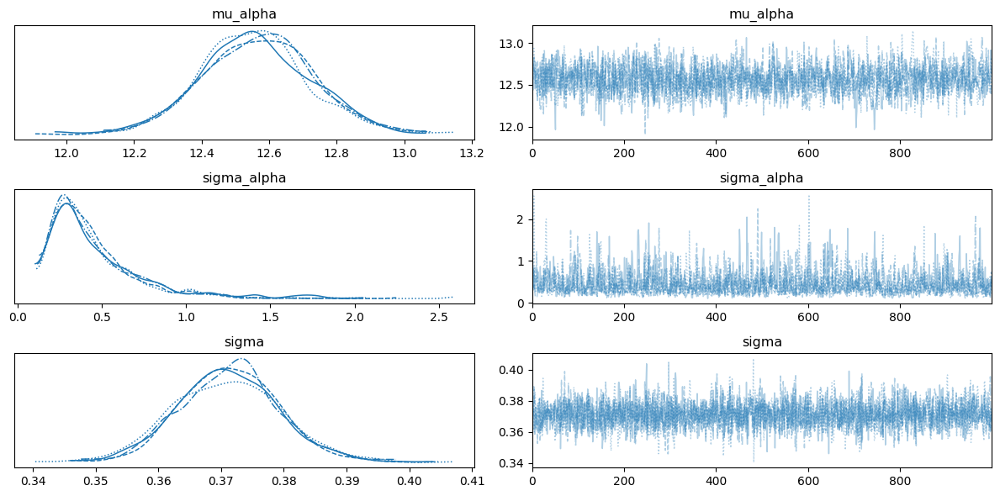

seperation,vr as feature diagnostics


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



Max R-hat: 1.0042  (should be < 1.01)
Min ESS:   1238  (should be > 400)
All R-hats < 1.01 — good convergence ✓


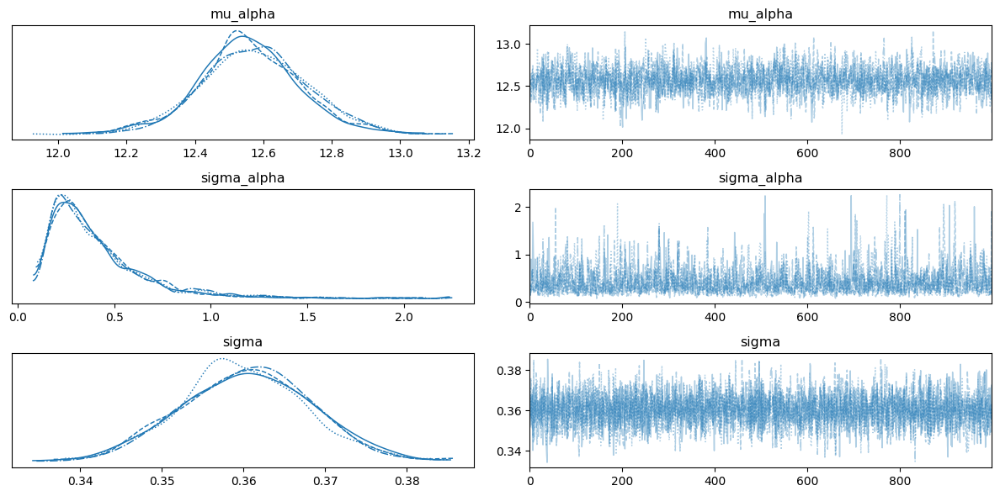

seperation,vr,vt as feature diagnostics


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



Max R-hat: 1.0076  (should be < 1.01)
Min ESS:   765  (should be > 400)
All R-hats < 1.01 — good convergence ✓


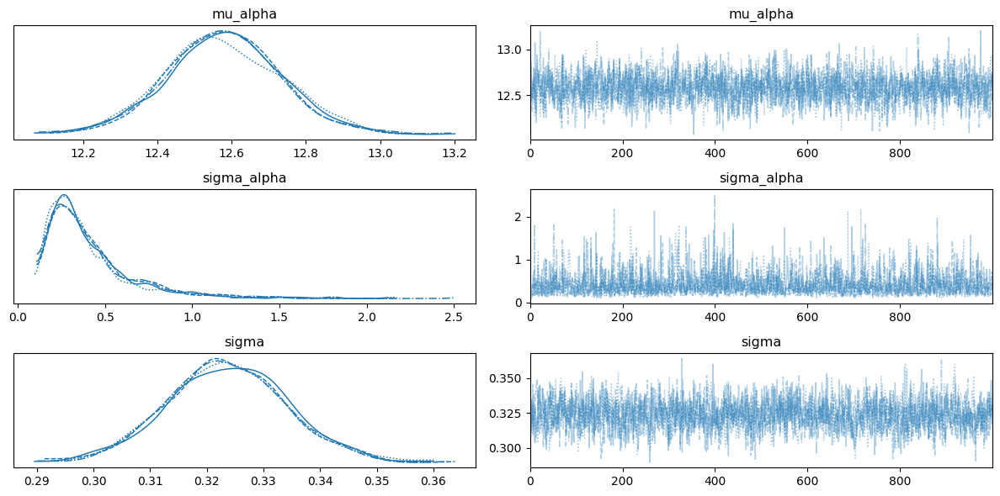

seperation,vr,vt, stellar mass as a feature diagnostics


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
1 of 4000 (0.03%) transitions ended with a divergence.
These divergent transitions indicate that HMC is not fully able to explore the posterior distribution.
Try increasing adapt delta closer to 1.
If this doesn't remove all divergences, try to reparameterize the model.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete.



Max R-hat: 1.0059  (should be < 1.01)
Min ESS:   1196  (should be > 400)
All R-hats < 1.01 — good convergence ✓


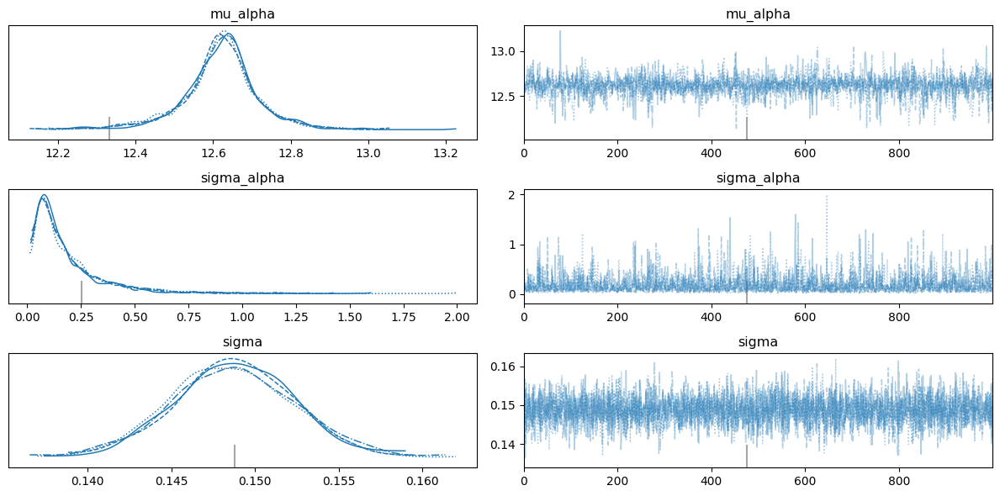

seperation,vr,vt, Kband as feature diagnostics


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



Max R-hat: 1.0088  (should be < 1.01)
Min ESS:   1239  (should be > 400)
All R-hats < 1.01 — good convergence ✓


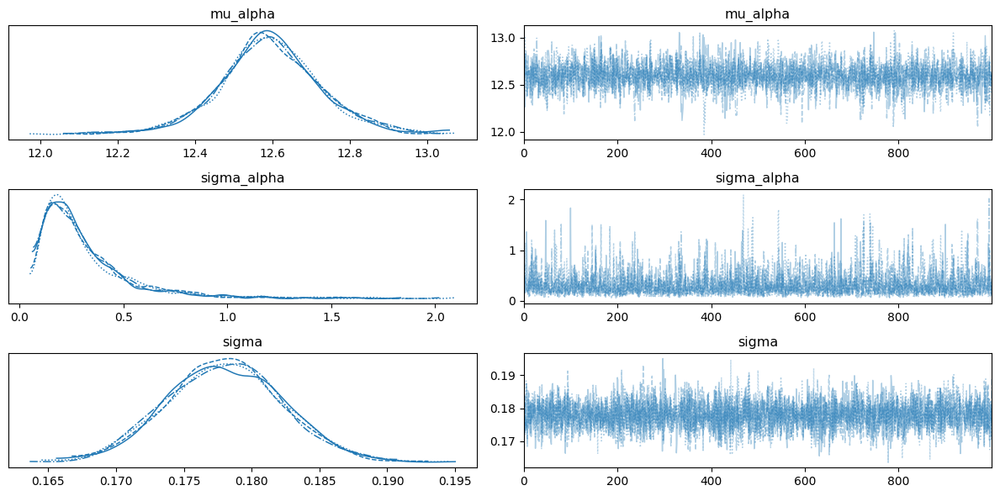

In [23]:
print("seperation as a feature diagnostics")
print(fitr1.diagnose())

summary = fitr1.summary()
print(f"Max R-hat: {summary['R_hat'].max():.4f}  (should be < 1.01)")
print(f"Min ESS:   {summary['ESS_bulk'].min():.0f}  (should be > 400)")

bad = summary[summary['R_hat'] > 1.01]
if len(bad):
    print('WARNING — Parameters with R-hat > 1.01:')
    print(bad[['R_hat', 'ESS_bulk']])
else:
    print('All R-hats < 1.01 — good convergence ✓')

idata1 = az.from_cmdstanpy(
    fitr1,
    posterior_predictive='y_rep',
    log_likelihood='log_lik',
    observed_data={'y': log_m200c},
)
az.plot_trace(idata1, var_names=['mu_alpha', 'sigma_alpha', 'sigma'])
plt.tight_layout()
plt.show()

print("seperation,vr as feature diagnostics")
print(fitvr1.diagnose())

summary = fitvr1.summary()
print(f"Max R-hat: {summary['R_hat'].max():.4f}  (should be < 1.01)")
print(f"Min ESS:   {summary['ESS_bulk'].min():.0f}  (should be > 400)")

bad = summary[summary['R_hat'] > 1.01]
if len(bad):
    print('WARNING — Parameters with R-hat > 1.01:')
    print(bad[['R_hat', 'ESS_bulk']])
else:
    print('All R-hats < 1.01 — good convergence ✓')

idata2 = az.from_cmdstanpy(
    fitvr1,
    posterior_predictive='y_rep',
    log_likelihood='log_lik',
    observed_data={'y': log_m200c},
)
az.plot_trace(idata2, var_names=['mu_alpha', 'sigma_alpha', 'sigma'])
plt.tight_layout()
plt.show()

print("seperation,vr,vt as feature diagnostics")
print(fitvt1.diagnose())

summary = fitvt1.summary()
print(f"Max R-hat: {summary['R_hat'].max():.4f}  (should be < 1.01)")
print(f"Min ESS:   {summary['ESS_bulk'].min():.0f}  (should be > 400)")

bad = summary[summary['R_hat'] > 1.01]
if len(bad):
    print('WARNING — Parameters with R-hat > 1.01:')
    print(bad[['R_hat', 'ESS_bulk']])
else:
    print('All R-hats < 1.01 — good convergence ✓')

idata3 = az.from_cmdstanpy(
    fitvt1,
    posterior_predictive='y_rep',
    log_likelihood='log_lik',
    observed_data={'y': log_m200c},
)
az.plot_trace(idata3, var_names=['mu_alpha', 'sigma_alpha', 'sigma'])
plt.tight_layout()
plt.show()


print("seperation,vr,vt, stellar mass as a feature diagnostics")
print(fitsm1.diagnose())

summary = fitsm1.summary()
print(f"Max R-hat: {summary['R_hat'].max():.4f}  (should be < 1.01)")
print(f"Min ESS:   {summary['ESS_bulk'].min():.0f}  (should be > 400)")

bad = summary[summary['R_hat'] > 1.01]
if len(bad):
    print('WARNING — Parameters with R-hat > 1.01:')
    print(bad[['R_hat', 'ESS_bulk']])
else:
    print('All R-hats < 1.01 — good convergence ✓')

idata4 = az.from_cmdstanpy(
    fitsm1,
    posterior_predictive='y_rep',
    log_likelihood='log_lik',
    observed_data={'y': log_m200c},
)
az.plot_trace(idata4, var_names=['mu_alpha', 'sigma_alpha', 'sigma'])
plt.tight_layout()
plt.show()


print("seperation,vr,vt, Kband as feature diagnostics")
print(fitkb1.diagnose())

summary = fitkb1.summary()
print(f"Max R-hat: {summary['R_hat'].max():.4f}  (should be < 1.01)")
print(f"Min ESS:   {summary['ESS_bulk'].min():.0f}  (should be > 400)")

bad = summary[summary['R_hat'] > 1.01]
if len(bad):
    print('WARNING — Parameters with R-hat > 1.01:')
    print(bad[['R_hat', 'ESS_bulk']])
else:
    print('All R-hats < 1.01 — good convergence ✓')

idata5 = az.from_cmdstanpy(
    fitkb1,
    posterior_predictive='y_rep',
    log_likelihood='log_lik',
    observed_data={'y': log_m200c},
)
az.plot_trace(idata5, var_names=['mu_alpha', 'sigma_alpha', 'sigma'])
plt.tight_layout()
plt.show()

In [24]:
print("Model 1 diagnostics")
print(fitr1.diagnose())

summary_1 = fitr1.summary()
print(summary_1.sort_values('R_hat', ascending=False).head(10)[['R_hat', 'ESS_bulk']])

print("Model 2 diagnostics")
print(fitvr1.diagnose())

summary_1 = fitvr1.summary()
print(summary_1.sort_values('R_hat', ascending=False).head(10)[['R_hat', 'ESS_bulk']])

print("Model 3 diagnostics")
print(fitvt1.diagnose())

summary_1 = fitvt1.summary()
print(summary_1.sort_values('R_hat', ascending=False).head(10)[['R_hat', 'ESS_bulk']])

print("Model 4 diagnostics")
print(fitsm1.diagnose())

summary_1 = fitsm1.summary()
print(summary_1.sort_values('R_hat', ascending=False).head(10)[['R_hat', 'ESS_bulk']])

print("Model 5 diagnostics")
print(fitkb1.diagnose())

summary_1 = fitkb1.summary()
print(summary_1.sort_values('R_hat', ascending=False).head(10)[['R_hat', 'ESS_bulk']])

Model 1 diagnostics


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



                R_hat  ESS_bulk
log_lik[714]  1.00415   3829.75
log_lik[47]   1.00392   3839.21
log_lik[519]  1.00349   3845.13
log_lik[74]   1.00342   3838.25
log_lik[80]   1.00336   3821.11
log_lik[15]   1.00335   3837.06
log_lik[937]  1.00334   3828.35
log_lik[136]  1.00330   3808.24
log_lik[792]  1.00324   3804.03
log_lik[585]  1.00324   3822.14
Model 2 diagnostics


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



                R_hat  ESS_bulk
mu_alpha      1.00424   1831.71
y_rep[669]    1.00341   4091.63
alpha_raw[2]  1.00271   1578.42
y_rep[934]    1.00249   3922.78
log_lik[77]   1.00248   4208.13
y_rep[474]    1.00239   3886.97
log_lik[15]   1.00236   4231.55
log_lik[802]  1.00232   4122.08
log_lik[884]  1.00227   4306.91
log_lik[518]  1.00222   4220.13
Model 3 diagnostics


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



                 R_hat  ESS_bulk
vt_true[871]   1.00760   7455.10
vt_true[797]   1.00636   5562.35
eta[871]       1.00607   7020.94
eta_rep[871]   1.00607   7020.94
eta[13]        1.00531   6023.02
eta_rep[13]    1.00531   6023.02
vt_true[1010]  1.00521   6231.63
vt_true[186]   1.00507   7002.60
vt_true[706]   1.00500   6553.98
vt_true[17]    1.00489   6606.14
Model 4 diagnostics


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
1 of 4000 (0.03%) transitions ended with a divergence.
These divergent transitions indicate that HMC is not fully able to explore the posterior distribution.
Try increasing adapt delta closer to 1.
If this doesn't remove all divergences, try to reparameterize the model.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete.



                 R_hat  ESS_bulk
vt_true[895]   1.00595   5051.34
vt_true[270]   1.00591   5245.31
vt_true[370]   1.00546   5292.47
mu_beta[3]     1.00532   1455.60
vt_true[377]   1.00528   6803.21
eta[550]       1.00517   4627.86
eta_rep[550]   1.00517   4627.86
sigma_beta[3]  1.00512   1196.11
eta_rep[895]   1.00511   5434.42
eta[895]       1.00511   5434.42
Model 5 diagnostics


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



                 R_hat  ESS_bulk
vt_true[608]   1.00875   9058.31
vt_true[1012]  1.00794  10139.10
vt_true[633]   1.00651  11507.30
vt_true[188]   1.00640   9427.41
vt_true[617]   1.00626   9336.18
vt_true[808]   1.00595   8355.89
vt_true[421]   1.00595   9463.60
vt_true[447]   1.00591   8485.40
vt_true[38]    1.00590  10016.70
vt_true[266]   1.00565  11160.10


## 7. Posterior Predictive Check

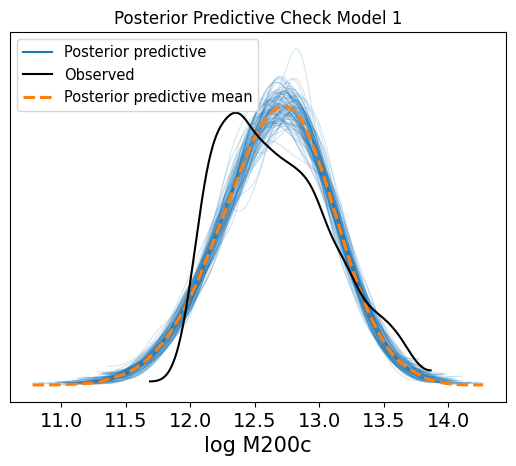

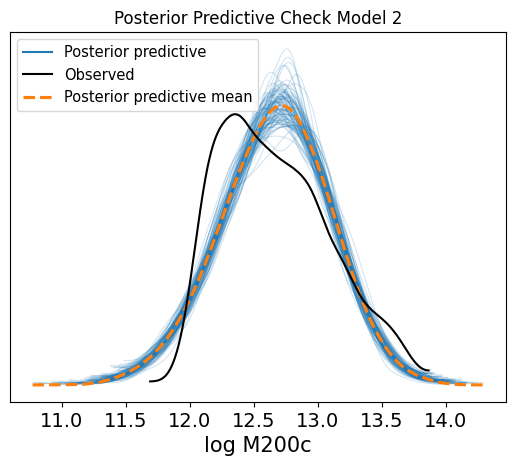

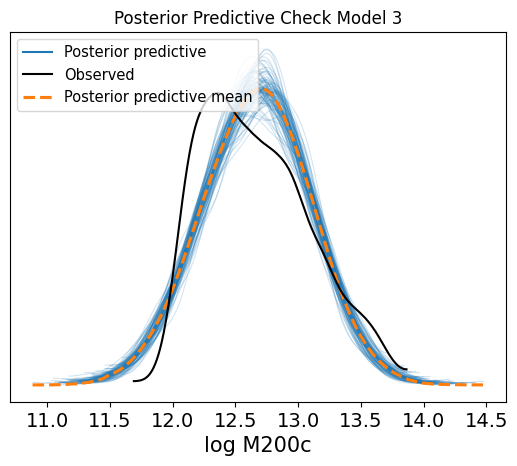

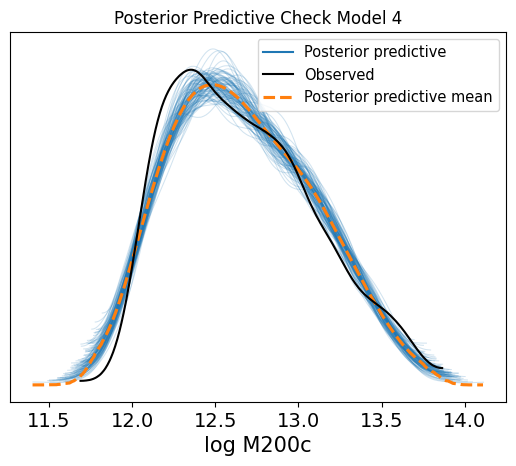

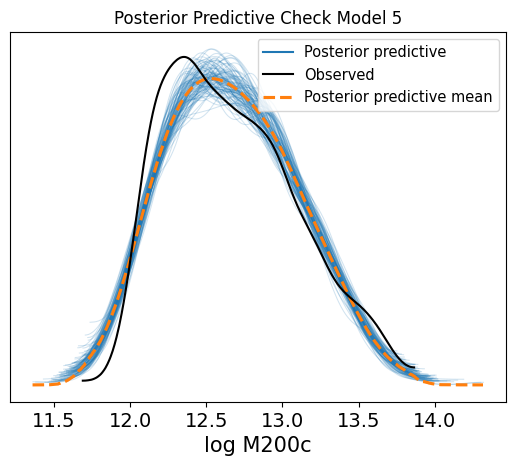

In [25]:
az.plot_ppc(idata1, data_pairs={'y': 'y_rep'}, num_pp_samples=100)
plt.title('Posterior Predictive Check Model 1')
plt.xlabel('log M200c')
plt.show()

az.plot_ppc(idata2, data_pairs={'y': 'y_rep'}, num_pp_samples=100)
plt.title('Posterior Predictive Check Model 2')
plt.xlabel('log M200c')
plt.show()

az.plot_ppc(idata3, data_pairs={'y': 'y_rep'}, num_pp_samples=100)
plt.title('Posterior Predictive Check Model 3')
plt.xlabel('log M200c')
plt.show()

az.plot_ppc(idata4, data_pairs={'y': 'y_rep'}, num_pp_samples=100)
plt.title('Posterior Predictive Check Model 4')
plt.xlabel('log M200c')
plt.show()

az.plot_ppc(idata5, data_pairs={'y': 'y_rep'}, num_pp_samples=100)
plt.title('Posterior Predictive Check Model 5')
plt.xlabel('log M200c')
plt.show()

## 8. In-Sample Fit Quality

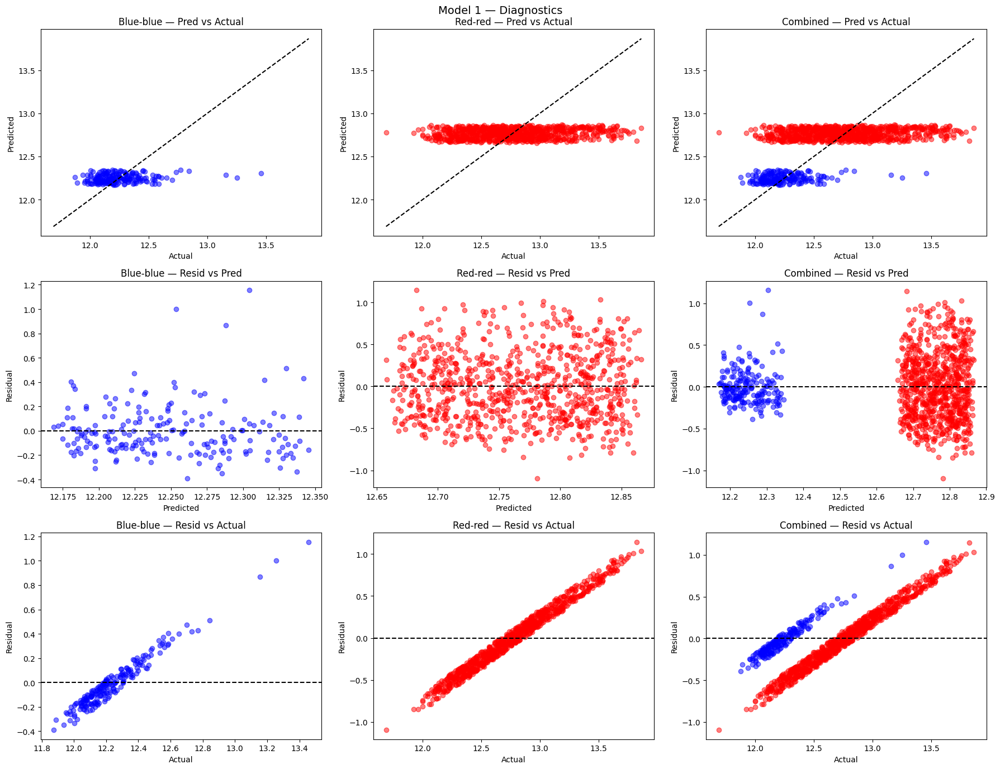

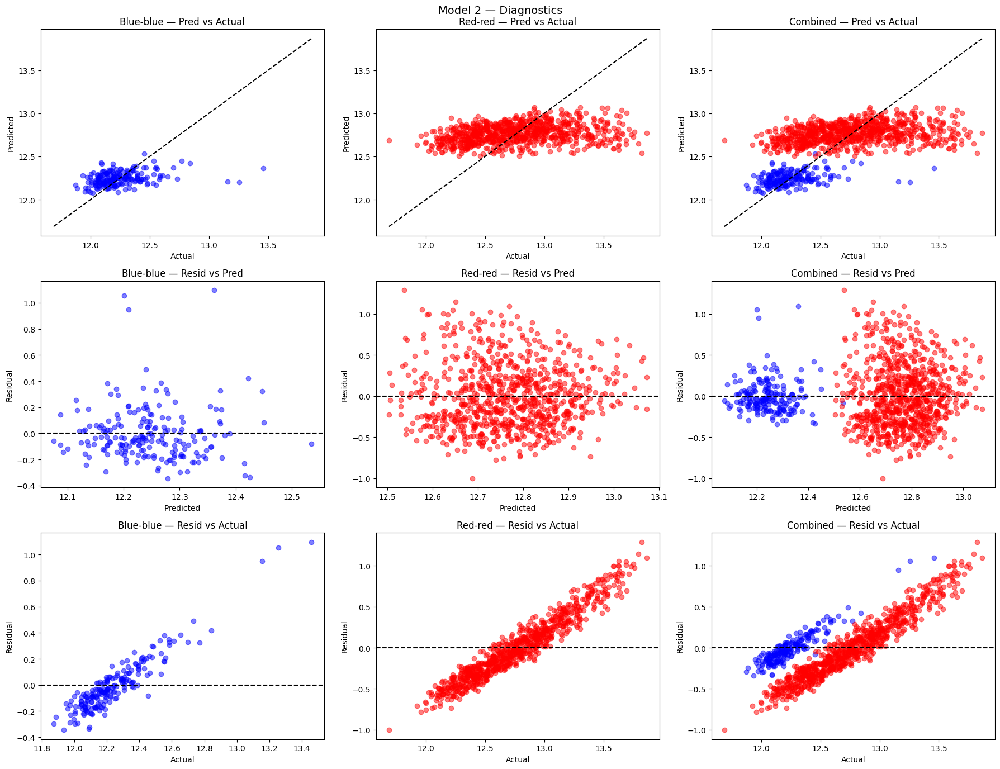

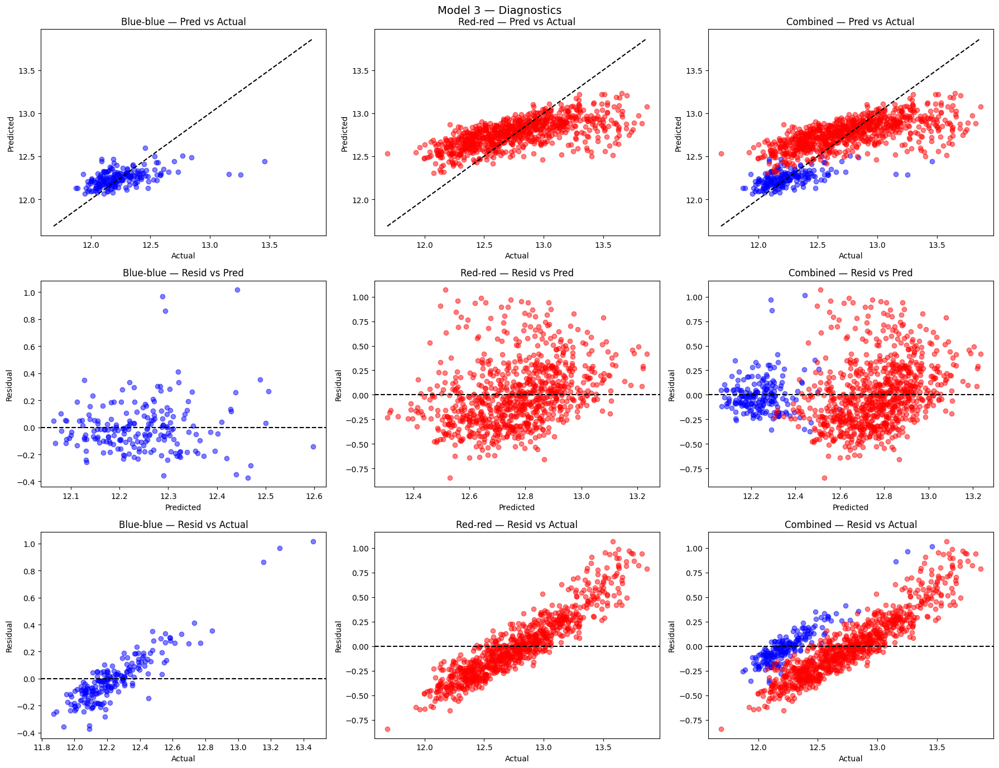

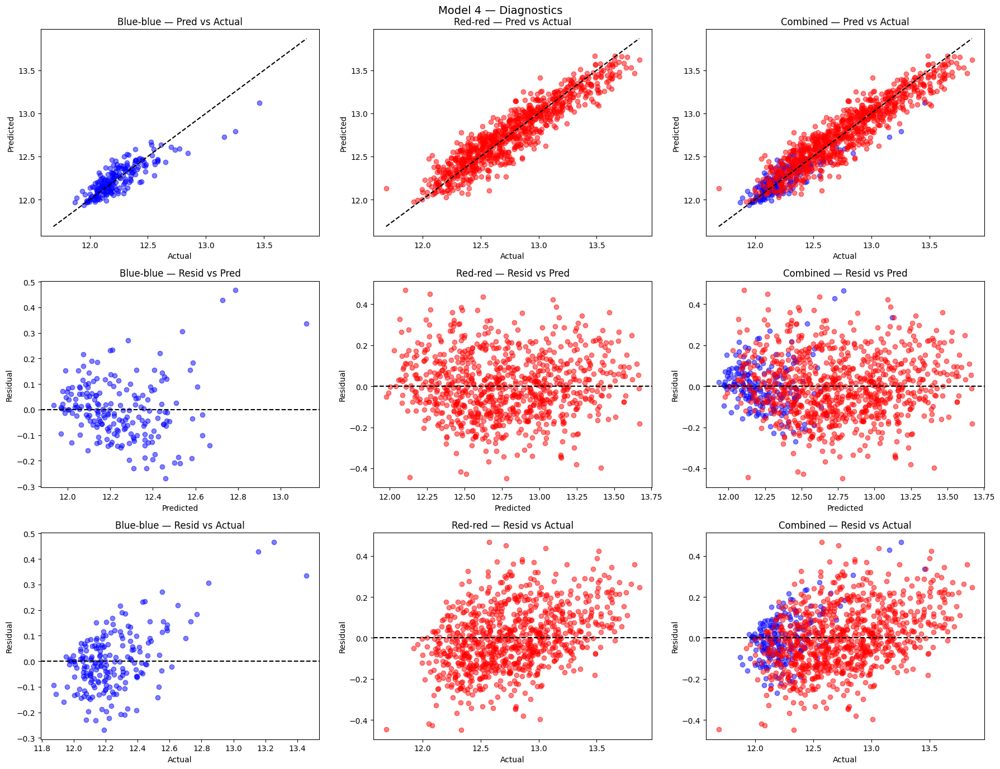

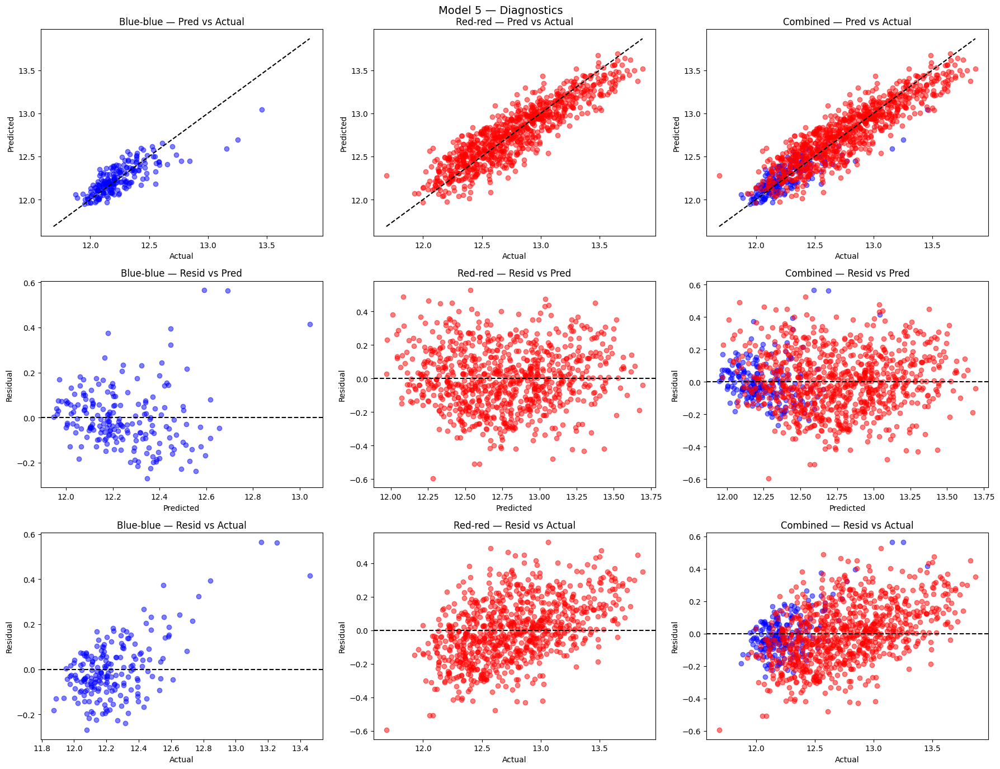

In [26]:
fits = {
    "Model 1": fitr1,
    "Model 2": fitvr1,
    "Model 3": fitvt1,
    "Model 4": fitsm1,
    "Model 5": fitkb1,
}

for name, fit in fits.items():

    y_rep = fit.stan_variable('y_rep')
    y_pred = y_rep.mean(axis=0)
    residuals = log_m200c - y_pred

    fig, axes = plt.subplots(3, 3, figsize=(18, 14))
    fig.suptitle(f'{name} — Diagnostics', fontsize=14)

    masks = {
        "Blue-blue": group == 1,
        "Red-red": group == 2,
        "Combined": np.ones_like(group, dtype=bool)
    }

    colors = {
        "Blue-blue": "blue",
        "Red-red": "red",
        "Combined": None
    }

    for col, (label, mask) in enumerate(masks.items()):

        # Predicted vs Actual 
        ax = axes[0, col]
        if label == "Combined":
            ax.scatter(log_m200c[group==1], y_pred[group==1], color='blue', alpha=0.5)
            ax.scatter(log_m200c[group==2], y_pred[group==2], color='red', alpha=0.5)
        else:
            ax.scatter(log_m200c[mask], y_pred[mask],
                       color=colors[label], alpha=0.5)

        ax.plot([log_m200c.min(), log_m200c.max()],
                [log_m200c.min(), log_m200c.max()],
                'k--')
        ax.set_title(f'{label} — Pred vs Actual')
        ax.set_xlabel('Actual')
        ax.set_ylabel('Predicted')

        # Residuals vs Predicted
        ax = axes[1, col]
        if label == "Combined":
            ax.scatter(y_pred[group==1], residuals[group==1], color='blue', alpha=0.5)
            ax.scatter(y_pred[group==2], residuals[group==2], color='red', alpha=0.5)
        else:
            ax.scatter(y_pred[mask], residuals[mask],
                       color=colors[label], alpha=0.5)

        ax.axhline(0, linestyle='--', color='black')
        ax.set_title(f'{label} — Resid vs Pred')
        ax.set_xlabel('Predicted')
        ax.set_ylabel('Residual')

        # Residuals vs Actual 
        ax = axes[2, col]
        if label == "Combined":
            ax.scatter(log_m200c[group==1], residuals[group==1], color='blue', alpha=0.5)
            ax.scatter(log_m200c[group==2], residuals[group==2], color='red', alpha=0.5)
        else:
            ax.scatter(log_m200c[mask], residuals[mask],
                       color=colors[label], alpha=0.5)

        ax.axhline(0, linestyle='--', color='black')
        ax.set_title(f'{label} — Resid vs Actual')
        ax.set_xlabel('Actual')
        ax.set_ylabel('Residual')

    plt.tight_layout()
    plt.show()

## 9. Posterior Coefficients by Group

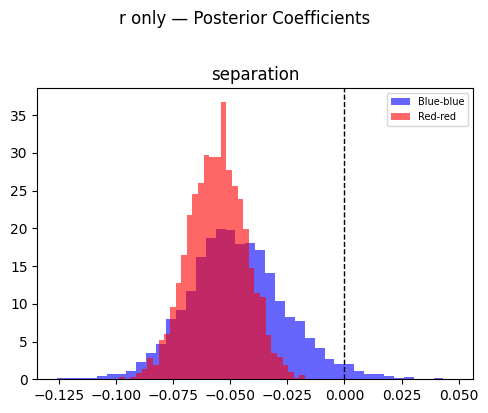

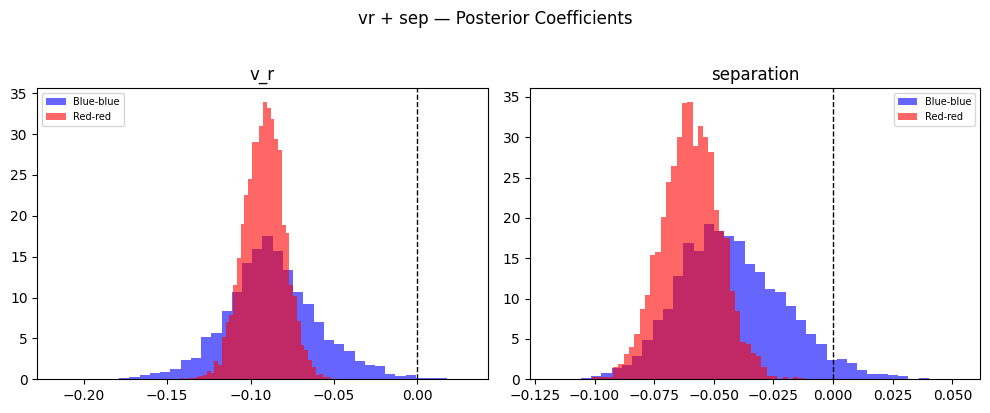

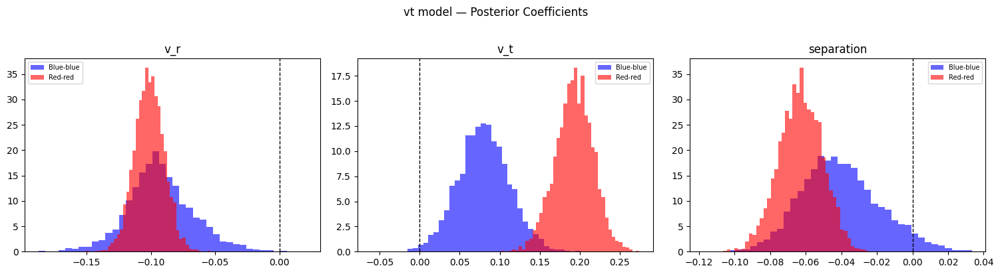

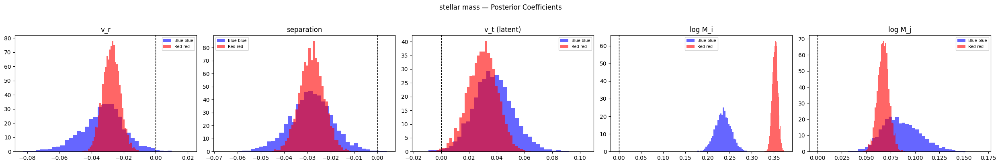

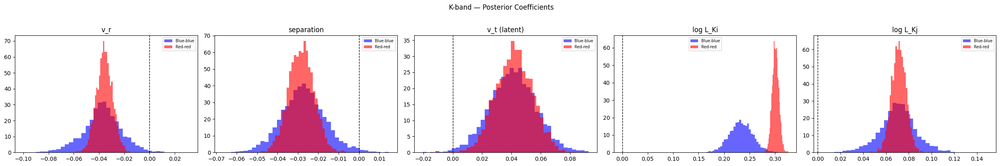

In [27]:
fmodel_data = {
    "r only": {
        "fit": fitr1,
        "features": features_r,
        "names": ['separation']
    },
    "vr + sep": {
        "fit": fitvr1,
        "features": features_vr,
        "names": ['v_r', 'separation']
    },
    "vt model": {
        "fit": fitvt1,
        "features": features_vt,
        "names": ['v_r', 'v_t', 'separation']
    },
    "stellar mass": {
        "fit": fitsm1,
        "features": features_stellar,
        "names": ['v_r', 'separation', 'v_t (latent)', 'log M_i', 'log M_j']
    },
    "K-band": {
        "fit": fitkb1,
        "features": features_Kband,
        "names": ['v_r', 'separation', 'v_t (latent)', 'log L_Ki', 'log L_Kj']
    }
}


for name, obj in fmodel_data.items():

    fit = obj["fit"]
    feature_names = obj["names"]

    beta_samples  = fit.stan_variable('beta')
    alpha_samples = fit.stan_variable('alpha')

    K = len(feature_names)

    fig, axes = plt.subplots(1, K, figsize=(5*K, 4))
    if K == 1:
        axes = [axes]

    for k, (ax, fname) in enumerate(zip(axes, feature_names)):
        ax.hist(beta_samples[:, 0, k], bins=40, alpha=0.6,
                color='blue', label='Blue-blue', density=True)
        ax.hist(beta_samples[:, 1, k], bins=40, alpha=0.6,
                color='red', label='Red-red', density=True)

        ax.axvline(0, color='black', linestyle='--', linewidth=1)
        ax.set_title(fname)
        ax.legend(fontsize=7)

    plt.suptitle(f'{name} — Posterior Coefficients', y=1.02)
    plt.tight_layout()
    plt.show()


## 10. Local Group Halo Mass Posterior

Using the real LG observables (standardized above), we read out `y_lg_bb` and `y_lg_rr`
from the generated quantities block.

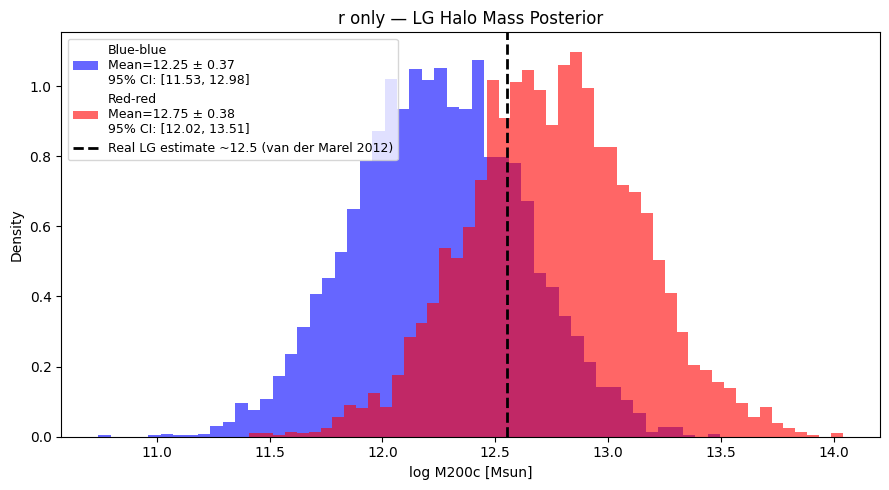


=== r only ===
P(log M200c | blue-blue, LG obs) = 12.247 ± 0.370
95% CI: [11.530, 12.978]

P(log M200c | red-red, LG obs)   = 12.754 ± 0.377
95% CI: [12.016, 13.510]

Difference (rr - bb): 0.507 ± 0.531 dex
P(M200c_rr > M200c_bb | LG obs): 0.832


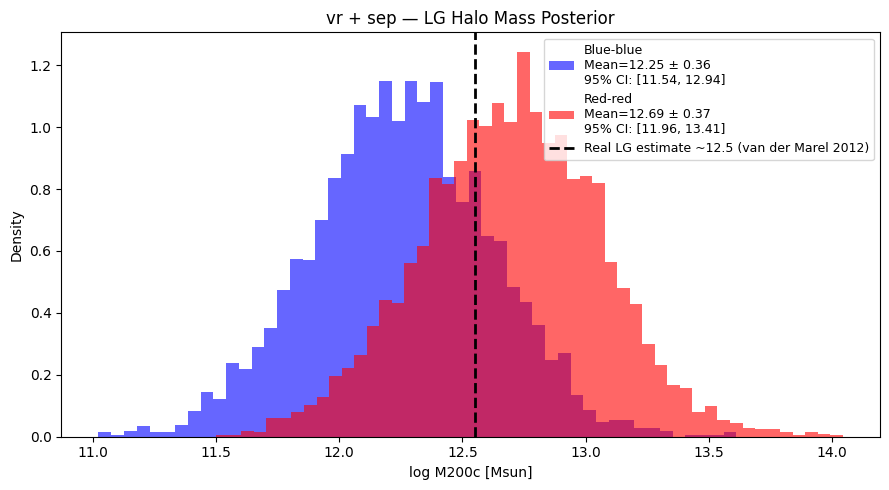


=== vr + sep ===
P(log M200c | blue-blue, LG obs) = 12.252 ± 0.363
95% CI: [11.537, 12.939]

P(log M200c | red-red, LG obs)   = 12.694 ± 0.366
95% CI: [11.964, 13.405]

Difference (rr - bb): 0.442 ± 0.511 dex
P(M200c_rr > M200c_bb | LG obs): 0.810


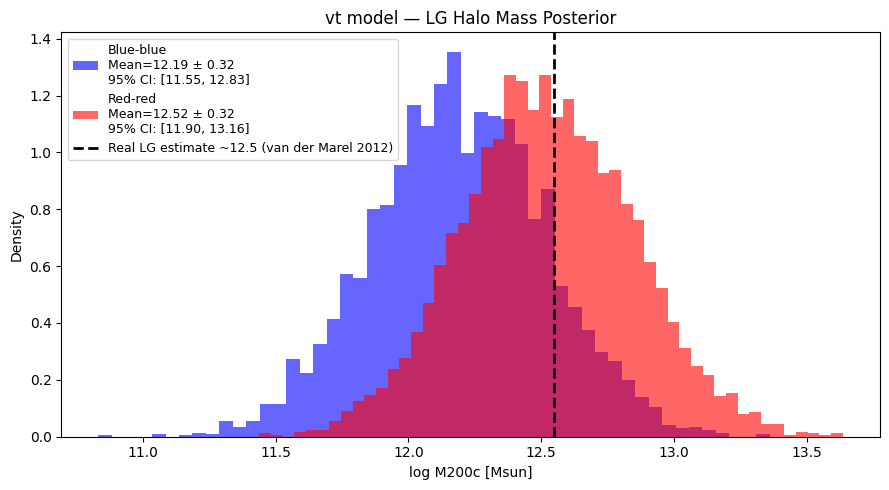


=== vt model ===
P(log M200c | blue-blue, LG obs) = 12.190 ± 0.325
95% CI: [11.553, 12.825]

P(log M200c | red-red, LG obs)   = 12.523 ± 0.321
95% CI: [11.899, 13.164]

Difference (rr - bb): 0.333 ± 0.449 dex
P(M200c_rr > M200c_bb | LG obs): 0.766


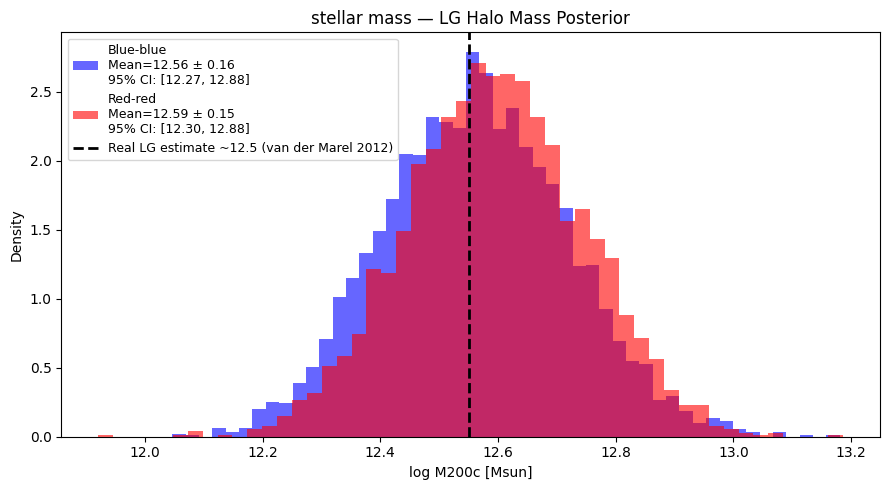


=== stellar mass ===
P(log M200c | blue-blue, LG obs) = 12.562 ± 0.157
95% CI: [12.265, 12.879]

P(log M200c | red-red, LG obs)   = 12.595 ± 0.150
95% CI: [12.303, 12.884]

Difference (rr - bb): 0.033 ± 0.216 dex
P(M200c_rr > M200c_bb | LG obs): 0.564


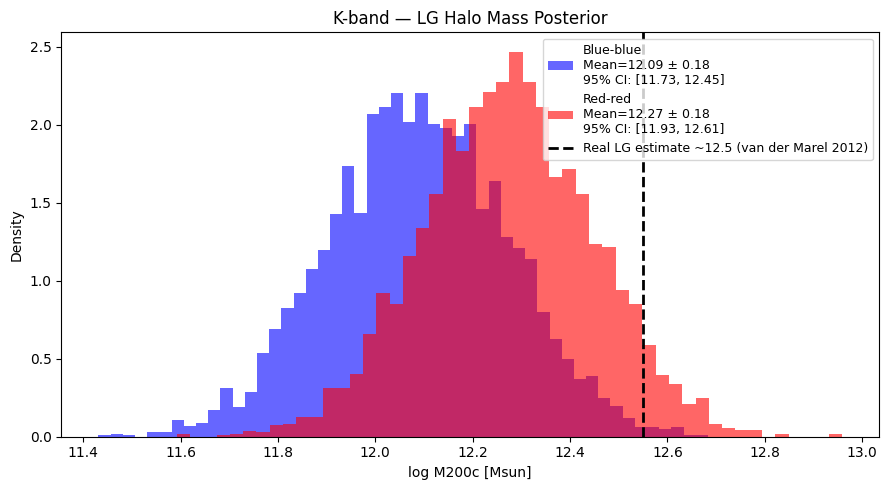


=== K-band ===
P(log M200c | blue-blue, LG obs) = 12.087 ± 0.184
95% CI: [11.727, 12.446]

P(log M200c | red-red, LG obs)   = 12.272 ± 0.175
95% CI: [11.929, 12.614]

Difference (rr - bb): 0.185 ± 0.252 dex
P(M200c_rr > M200c_bb | LG obs): 0.765


In [28]:
for name, obj in fmodel_data.items():

    fit = obj["fit"]

    y_lg_bb = fit.stan_variable("y_lg_bb")
    y_lg_rr = fit.stan_variable("y_lg_rr")

    fig, ax = plt.subplots(figsize=(9, 5))

    ax.hist(y_lg_bb, bins=50, density=True, alpha=0.6, color='blue',
            label=f'Blue-blue\n'
                  f'Mean={y_lg_bb.mean():.2f} ± {y_lg_bb.std():.2f}\n'
                  f'95% CI: [{np.percentile(y_lg_bb,2.5):.2f}, {np.percentile(y_lg_bb,97.5):.2f}]')

    ax.hist(y_lg_rr, bins=50, density=True, alpha=0.6, color='red',
            label=f'Red-red\n'
                  f'Mean={y_lg_rr.mean():.2f} ± {y_lg_rr.std():.2f}\n'
                  f'95% CI: [{np.percentile(y_lg_rr,2.5):.2f}, {np.percentile(y_lg_rr,97.5):.2f}]')

    ax.axvline(12.55, color='black', linestyle='--', linewidth=2,
               label='Real LG estimate ~12.5 (van der Marel 2012)')

    ax.set_xlabel('log M200c [Msun]')
    ax.set_ylabel('Density')
    ax.set_title(f'{name} — LG Halo Mass Posterior')
    ax.legend(fontsize=9)

    plt.tight_layout()
    plt.show()

    # Print summary
    print(f"\n=== {name} ===")
    print(f"P(log M200c | blue-blue, LG obs) = {y_lg_bb.mean():.3f} ± {y_lg_bb.std():.3f}")
    print(f"95% CI: [{np.percentile(y_lg_bb,2.5):.3f}, {np.percentile(y_lg_bb,97.5):.3f}]")

    print(f"\nP(log M200c | red-red, LG obs)   = {y_lg_rr.mean():.3f} ± {y_lg_rr.std():.3f}")
    print(f"95% CI: [{np.percentile(y_lg_rr,2.5):.3f}, {np.percentile(y_lg_rr,97.5):.3f}]")

    diff = y_lg_rr - y_lg_bb
    print(f"\nDifference (rr - bb): {diff.mean():.3f} ± {diff.std():.3f} dex")
    print(f"P(M200c_rr > M200c_bb | LG obs): {(y_lg_rr > y_lg_bb).mean():.3f}")

## 12. Train / Test Validation

In [29]:
"""
5-Fold Cross-Validation for all 5 Stan models.

Fixes applied vs original notebook:
  - Each model uses its own X_scaled, lg_obs_scaled, compiled model, and vt_sigma array
  - vt_sigma is only passed for models that include v_t (vt, stellar, kband)
  - stan_data_split built dynamically per model type
  - Model compilation filenames are consistent (write_if_changed target == CmdStanModel source)
  - mu_beta[5] out-of-bounds in stan_stellarmass2 noted (fix in Stan code: remove that line)
"""

import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import r2_score, mean_squared_error

# ── Model registry ────────────────────────────────────────────────────────────
# Each entry describes everything the CV loop needs for one model.
# 'has_vt': whether the Stan model includes the vt measurement-error block.
# 'vt_col': column index of v_t in X_scaled (None if model has no v_t feature).

MODEL_CONFIGS = {
    "r_only": {
        "label":       "Separation only",
        "model":       modelr2,            # compiled CmdStanModel (type-2 / split)
        "X_scaled":    X_scaled_r,
        "lg_obs":      lg_obs_scaled_r,
        "has_vt":      False,
        "vt_col":      None,
    },
    "vr": {
        "label":       "v_r + separation",
        "model":       modelvr2,
        "X_scaled":    X_scaled_vr,
        "lg_obs":      lg_obs_scaled_vr,
        "has_vt":      False,
        "vt_col":      None,
    },
    "vt": {
        "label":       "v_r + v_t + separation",
        "model":       modelvt2,
        "X_scaled":    X_scaled_vt,
        "lg_obs":      lg_obs_scaled_vt,
        "has_vt":      True,
        "vt_col":      1,               # v_t is column index 1 in X_scaled_vt
    },
    "stellar": {
        "label":       "v_r + v_t + separation + M_*",
        "model":       modelsm2,
        "X_scaled":    X_scaled_stellar,
        "lg_obs":      lg_obs_scaled_stellar,
        "has_vt":      True,
        "vt_col":      2,               # v_t is column index 2 in X_scaled_stellar
    },
    "kband": {
        "label":       "v_r + v_t + separation + L_K",
        "model":       modelkb2,
        "X_scaled":    X_scaled_Kband,
        "lg_obs":      lg_obs_scaled_kband,
        "has_vt":      True,
        "vt_col":      2,               # v_t is column index 2 in X_scaled_Kband
    },
}

# ── CV settings ───────────────────────────────────────────────────────────────
N_FOLDS = 5
skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

SAMPLER_KWARGS = dict(
    chains=4,
    parallel_chains=4,
    iter_sampling=1000,
    iter_warmup=2000,
    adapt_delta=0.999,
    max_treedepth=15,
    show_progress=True,
)

# ── Per-model vt sigma ────────────────────────────────────────────────────────
# Compute a standardised vt_sigma array for each model that uses v_t,
# dividing by that model's own v_t column std (not a shared scaler).
# This avoids the bug of always using feat_std[1] from the last-fitted scaler.

def compute_vt_scaled_sigma(X_raw_vt_col, scaler_scale, vt_sigma_pct=0.614):
    """
    X_raw_vt_col: raw (unscaled) v_t values, shape (N,)
    scaler_scale: the std used by StandardScaler for the v_t column (a scalar float)
    Returns per-pair standardised sigma, clipped to >= 1e-3.
    """
    vt_raw_sigma    = vt_sigma_pct * np.abs(X_raw_vt_col)
    vt_scaled_sigma = vt_raw_sigma / scaler_scale
    return np.clip(vt_scaled_sigma, 1e-3, None)

for cfg in MODEL_CONFIGS.values():
    if cfg["has_vt"]:
        col = cfg["vt_col"]
        if cfg["model"] is modelvt2:
            scale = scaler_vt.scale_[col]
        elif cfg["model"] is modelsm2:
            scale = scaler_stellar.scale_[col]
        elif cfg["model"] is modelkb2:
            scale = scaler_kband.scale_[col]
        cfg["vt_scaled_sigma"] = compute_vt_scaled_sigma(vt_f, scale)
    else:
        cfg["vt_scaled_sigma"] = None


# build stan_data dict for one fold
def build_stan_data(cfg, train_idx, test_idx, X_train, X_test, y_train, g_train, g_test):
    """Returns the stan_data dict appropriate for this model's type."""
    data = {
        "N_train":     int(len(train_idx)),
        "N_test":      int(len(test_idx)),
        "group_train": g_train.tolist(),
        "group_test":  g_test.tolist(),
        "X_train":     X_train.tolist(),
        "X_test":      X_test.tolist(),
        "y_train":     y_train.tolist(),
        "x_lg":        cfg["lg_obs"].tolist(),
    }
    if cfg["has_vt"]:
        col = cfg["vt_col"]
        vt_sig = cfg["vt_scaled_sigma"]
        data["vt_obs_train"]   = X_train[:, col].tolist()
        data["vt_sigma_train"] = vt_sig[train_idx].tolist()
        data["vt_obs_test"]    = X_test[:, col].tolist()
        data["vt_sigma_test"]  = vt_sig[test_idx].tolist()
    return data


# Main CV loop over all models 
all_results = {}   # model_key -> dict with oof predictions + fold_metrics

for model_key, cfg in MODEL_CONFIGS.items():

    print(f"\n{'#'*70}")
    print(f"  MODEL: {cfg['label']}")
    print(f"{'#'*70}")

    X_scaled = cfg["X_scaled"]

    oof_y_pred_test  = np.full(len(log_m200c), np.nan)
    oof_y_pred_train = {}
    fold_metrics     = []

    for fold_idx, (train_idx, test_idx) in enumerate(skf.split(X_scaled, group)):

        print(f"\n{'='*60}")
        print(f"  FOLD {fold_idx + 1} / {N_FOLDS}  —  {cfg['label']}")
        print(f"{'='*60}")

        X_train = X_scaled[train_idx]
        X_test  = X_scaled[test_idx]
        y_train = log_m200c[train_idx]
        y_test  = log_m200c[test_idx]
        g_train = group[train_idx]
        g_test  = group[test_idx]

        print(f"  Train: {len(train_idx)} pairs  "
              f"(bb={(g_train==1).sum()}, rr={(g_train==2).sum()})")
        print(f"  Test:  {len(test_idx)}  pairs  "
              f"(bb={(g_test==1).sum()},  rr={(g_test==2).sum()})")

        stan_data = build_stan_data(
            cfg, train_idx, test_idx,
            X_train, X_test, y_train, g_train, g_test,
        )

        fit_fold = cfg["model"].sample(data=stan_data, **SAMPLER_KWARGS)
        print(fit_fold.diagnose())

        y_pred_tr = fit_fold.stan_variable("y_rep_train").mean(axis=0)
        y_pred_te = fit_fold.stan_variable("y_rep_test").mean(axis=0)

        oof_y_pred_test[test_idx]       = y_pred_te
        oof_y_pred_train[fold_idx]      = (train_idx, y_pred_tr)

        bb_te = g_test == 1
        rr_te = g_test == 2

        r2_tr  = r2_score(y_train, y_pred_tr)
        r2_te  = r2_score(y_test,  y_pred_te)
        r2_bb  = r2_score(y_test[bb_te], y_pred_te[bb_te]) if bb_te.sum() > 1 else float("nan")
        r2_rr  = r2_score(y_test[rr_te], y_pred_te[rr_te]) if rr_te.sum() > 1 else float("nan")
        rmse   = np.sqrt(mean_squared_error(y_test, y_pred_te))

        fold_metrics.append({
            "fold":       fold_idx + 1,
            "r2_train":   r2_tr,
            "r2_test":    r2_te,
            "r2_test_bb": r2_bb,
            "r2_test_rr": r2_rr,
            "rmse_test":  rmse,
        })
        print(f"\n  Fold {fold_idx+1} — Train R²: {r2_tr:.3f}  |  "
              f"Test R²: {r2_te:.3f}  (BB: {r2_bb:.3f}, RR: {r2_rr:.3f})")

    # ── Per-model summary ─────────────────────────────────────────────────────
    print(f"\n{'='*60}")
    print(f"  5-FOLD CV SUMMARY  —  {cfg['label']}")
    print(f"{'='*60}")
    for m in fold_metrics:
        print(f"  Fold {m['fold']}: Train R²={m['r2_train']:.3f}  "
              f"Test R²={m['r2_test']:.3f}  "
              f"BB={m['r2_test_bb']:.3f}  RR={m['r2_test_rr']:.3f}  "
              f"RMSE={m['rmse_test']:.3f}")

    r2_mean = np.nanmean([m["r2_test"]    for m in fold_metrics])
    r2_std  = np.nanstd( [m["r2_test"]    for m in fold_metrics])
    bb_mean = np.nanmean([m["r2_test_bb"] for m in fold_metrics])
    rr_mean = np.nanmean([m["r2_test_rr"] for m in fold_metrics])
    print(f"\n  Mean Test R²:    {r2_mean:.3f} ± {r2_std:.3f}")
    print(f"  Mean BB Test R²: {bb_mean:.3f}")
    print(f"  Mean RR Test R²: {rr_mean:.3f}")

    all_results[model_key] = {
        "oof_y_pred_test":  oof_y_pred_test,
        "oof_y_pred_train": oof_y_pred_train,
        "fold_metrics":     fold_metrics,
        "r2_mean":          r2_mean,
        "r2_std":           r2_std,
        "bb_mean":          bb_mean,
        "rr_mean":          rr_mean,
    }

# ── Cross-model comparison ────────────────────────────────────────────────────
print(f"\n{'#'*70}")
print("  CROSS-MODEL COMPARISON (Mean ± Std Test R²)")
print(f"{'#'*70}")
for key, res in all_results.items():
    label = MODEL_CONFIGS[key]["label"]
    print(f"  {label:<35}  R²={res['r2_mean']:.3f} ± {res['r2_std']:.3f}  "
          f"BB={res['bb_mean']:.3f}  RR={res['rr_mean']:.3f}")

18:15:00 - cmdstanpy - INFO - CmdStan start processing



######################################################################
  MODEL: Separation only
######################################################################

  FOLD 1 / 5  —  Separation only
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:00<00:04, 696.17it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:00<00:10, 279.48it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:00<00:12, 233.35it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:02<01:19, 36.25it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:05<01:10, 39.55it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:07<01:57, 23.83it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:09<01:34, 28.45it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:10<00:04, 696.17it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:10<00:10, 279.48it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:12<01:19, 32.84it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:12<02:04, 21.73it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:14<01:11, 35.12it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:14<01:36, 27.01it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:16<01:03, 37.63it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:17<01:21, 30.83it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:19<00:58, 39.19it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:19<01:09, 34.63it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:20<05:34,  8.38it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:22<00:59, 37.23it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:22<01:07, 34.11it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:23<03:29, 12.86it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:24<00:59, 36.90it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:25<00:58, 36.07it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:25<02:27, 17.60it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:27<00:51, 38.56it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:28<01:02, 33.65it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:29<02:02, 20.37it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:29<00:47, 40.36it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:30<00:54, 36.54it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:31<01:37, 24.63it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:32<00:44, 40.16it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:32<00:47, 40.25it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:33<01:18, 29.46it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:34<00:44, 40.44it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:34<00:43, 38.96it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:35<01:07, 32.61it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:37<00:43, 39.53it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:37<00:43, 37.03it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:39<00:40, 39.74it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:40<00:41, 36.31it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:42<01:24, 24.73it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:42<00:37, 40.24it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:43<00:38, 36.25it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:44<00:35, 39.97it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:45<01:16, 26.11it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:46<00:36, 35.73it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:47<00:33, 39.12it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:48<01:08, 27.68it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:49<00:35, 34.05it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:50<00:31, 37.86it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:51<01:03, 28.47it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [00:52<00:32, 33.95it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [00:52<00:29, 37.61it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:55<01:01, 27.60it/s, (Warmup)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [00:56<00:29, 34.02it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [00:56<00:29, 34.02it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [00:56<00:33, 30.16it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [00:56<00:33, 30.16it/s, (Sampling)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:59<00:57, 27.89it/s, (Warmup)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [00:59<00:26, 33.38it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:00<00:32, 28.04it/s, (Sampling)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:02<00:53, 27.84it/s, (Warmup)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:03<00:25, 31.91it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:05<00:30, 26.66it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:06<00:22, 31.33it/s, (Sampling)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:06<00:50, 27.82it/s, (Warmup)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:09<00:27, 25.84it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:09<00:18, 32.02it/s, (Sampling)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:10<00:48, 26.72it/s, (Warmup)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:12<00:15, 31.70it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:13<00:23, 25.78it/s, (Sampling)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:14<00:45, 26.25it/s, (Warmup)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:15<00:12, 31.93it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:17<00:19, 25.81it/s, (Sampling)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:18<00:42, 25.67it/s, (Warmup)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:19<00:09, 31.54it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:21<00:15, 25.31it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:21<00:36, 27.45it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:21<00:36, 27.45it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:22<00:06, 30.94it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:23<00:28, 31.48it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:25<00:03, 32.06it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:25<00:11, 25.02it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:25<00:22, 35.32it/s, (Sampling)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:27<24:00,  1.94it/s, (Warmup)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:27<00:18, 38.20it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 31.04it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:29<00:08, 24.53it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:29<00:14, 41.79it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:31<00:11, 43.85it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:33<00:04, 24.74it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:33<00:08, 45.71it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:35<00:06, 47.83it/s, (Sampling)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:37<14:31,  3.10it/s, (Warmup)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:37<00:00, 24.97it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:37<00:04, 47.70it/s, (Sampling)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:39<08:54,  4.87it/s, (Warmup)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:39<00:02, 48.58it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:40<00:00, 31.04it/s, (Sampling)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:41<05:47,  7.19it/s, (Warmup)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:41<00:00, 48.85it/s, (Sampling)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:43<03:55, 10.21it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:45<02:46, 13.82it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:47<02:05, 17.59it/s, (Warmup)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:50<00:00, 24.97it/s, (Sampling)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:53<01:59, 17.60it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:55<01:33, 21.45it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:57<01:13, 25.90it/s, (Warmup)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:00<00:00, 48.85it/s, (Sampling)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:01<01:04, 27.70it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:03<00:55, 30.71it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [02:05<00:48, 33.21it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [02:08<00:43, 34.54it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:11<00:40, 34.69it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:14<00:37, 35.08it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:17<00:35, 34.19it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:20<00:32, 34.23it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:24<00:33, 30.27it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:24<00:33, 30.27it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:28<00:30, 29.09it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:32<00:28, 27.97it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:35<00:25, 27.72it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:39<00:21, 27.34it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:43<00:18, 26.91it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:47<00:15, 26.61it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:50<00:11, 26.74it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:54<00:07, 26.87it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:58<00:03, 27.32it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:01<00:00, 26.85it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:01<00:00, 26.85it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:01<00:00, 16.49it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:01<00:00, 48.85it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:01<00:00, 16.49it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:01<00:00, 31.04it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:01<00:00, 16.49it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:01<00:00, 24.97it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:01<00:00, 16.49it/s, (Sampling completed)]


18:18:02 - cmdstanpy - INFO - CmdStan done processing.


18:18:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:18:10 - cmdstanpy - INFO - CmdStan start processing



  Fold 1 — Train R²: 0.242  |  Test R²: 0.268  (BB: 0.058, RR: 0.034)

  FOLD 2 / 5  —  Separation only
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:01<00:54, 53.22it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:02<01:15, 38.49it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:02<01:25, 33.75it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:03<01:45, 27.39it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:07<01:45, 26.61it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:08<02:04, 22.53it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:09<02:24, 19.43it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:11<02:52, 16.20it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:11<01:40, 26.88it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:11<01:48, 24.91it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:13<01:19, 32.55it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:14<01:24, 30.82it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:14<02:12, 20.42it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:16<01:13, 33.99it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:16<01:41, 25.67it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:17<01:25, 29.38it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:17<02:51, 15.75it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:19<01:14, 32.38it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:19<02:07, 20.42it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:20<01:18, 30.50it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:20<01:38, 25.27it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:22<01:11, 32.02it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:22<01:10, 32.80it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:23<01:49, 22.89it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:23<01:25, 27.95it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:25<01:01, 36.00it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:25<01:27, 27.44it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:26<01:11, 30.97it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:26<01:17, 29.74it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:28<01:14, 30.87it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:29<01:10, 29.60it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:30<01:15, 29.04it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:30<01:14, 28.18it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:31<01:09, 31.44it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:32<01:05, 30.42it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:33<01:04, 30.91it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:34<01:19, 26.38it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:35<01:13, 28.61it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:35<00:56, 33.56it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:35<01:00, 31.49it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:37<01:06, 29.94it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:37<01:02, 32.04it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:38<00:52, 34.60it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:38<00:56, 31.83it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:39<00:57, 32.94it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:39<00:55, 34.51it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:41<00:49, 34.65it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:42<00:54, 31.06it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:42<00:54, 33.22it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:42<00:51, 34.77it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:43<00:44, 35.72it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:45<00:48, 35.26it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:45<00:53, 31.98it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:46<00:54, 29.58it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:46<00:41, 35.85it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:48<00:46, 34.39it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:49<00:38, 36.28it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:49<00:51, 30.96it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:49<00:52, 28.62it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:51<00:42, 35.18it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:52<00:36, 35.65it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:52<00:48, 31.06it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:53<00:50, 28.00it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:54<00:40, 34.87it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:55<00:34, 34.51it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:55<00:45, 30.50it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:57<00:46, 27.85it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:57<00:37, 34.24it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [00:58<00:32, 33.95it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:59<00:42, 30.90it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:00<00:36, 33.07it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:00<00:28, 35.38it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:00<00:28, 35.38it/s, (Sampling)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:00<00:43, 27.56it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:02<00:39, 30.58it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:03<00:24, 36.92it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:03<00:33, 32.39it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:04<00:39, 27.95it/s, (Warmup)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:05<00:20, 38.14it/s, (Sampling)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:05<00:36, 30.19it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:07<00:34, 28.94it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:07<00:34, 28.94it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:08<00:17, 38.94it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:08<00:36, 27.16it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:08<00:36, 27.16it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:09<00:27, 33.11it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:10<00:36, 27.38it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:10<00:36, 27.38it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:10<00:15, 39.66it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:11<00:22, 35.85it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:12<00:12, 40.98it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:13<00:34, 25.93it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:13<00:18, 38.41it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:14<00:33, 26.88it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:15<00:09, 40.80it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:16<00:14, 40.39it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:17<00:32, 24.91it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:17<00:07, 41.46it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:17<00:29, 27.26it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:18<00:12, 41.45it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:19<00:04, 41.46it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:20<00:09, 42.35it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:21<00:27, 25.03it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:21<00:26, 26.88it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:22<00:02, 42.14it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:22<00:06, 43.65it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:24<00:00, 42.58it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:24<00:04, 44.50it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:25<00:22, 26.53it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:25<00:24, 24.32it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:27<00:02, 44.98it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:29<00:00, 44.61it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:29<00:19, 25.90it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:30<00:20, 24.08it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:33<00:15, 26.27it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:33<00:16, 24.74it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:37<00:11, 26.09it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:38<00:12, 24.13it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:40<00:00, 42.58it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:40<00:00, 44.61it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:40<00:07, 26.87it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:42<00:08, 24.00it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:43<00:03, 27.50it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:46<00:04, 23.77it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:47<00:00, 27.23it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 23.68it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 44.61it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 27.01it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 27.23it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 27.01it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 23.68it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 27.01it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 42.58it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 27.01it/s, (Sampling completed)]


18:20:01 - cmdstanpy - INFO - CmdStan done processing.


18:20:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:20:09 - cmdstanpy - INFO - CmdStan start processing



  Fold 2 — Train R²: 0.250  |  Test R²: 0.244  (BB: 0.044, RR: 0.032)

  FOLD 3 / 5  —  Separation only
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:00<00:25, 114.16it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:01<00:37, 77.75it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:01<00:42, 68.92it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:02<01:07, 42.66it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:05<01:27, 31.93it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:08<02:05, 22.27it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:08<01:22, 32.83it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:10<01:09, 37.47it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:11<00:25, 114.16it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:12<02:06, 21.39it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:13<03:29, 13.35it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:15<01:24, 29.73it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:15<01:40, 26.00it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:15<04:10, 11.16it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:17<02:45, 16.30it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:18<01:18, 30.59it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:19<01:54, 22.63it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:19<01:37, 25.69it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:21<01:33, 26.68it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:22<01:17, 29.68it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:22<01:22, 29.25it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:24<03:53, 11.56it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:24<01:20, 29.73it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:24<01:11, 32.13it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:25<01:12, 30.31it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:26<01:04, 34.31it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:27<02:44, 15.78it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:27<01:11, 32.09it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:29<01:12, 28.79it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:29<02:06, 19.79it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:30<01:07, 32.69it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:30<01:05, 31.82it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:31<01:04, 30.79it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:32<01:38, 24.25it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:32<00:59, 35.14it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:33<00:58, 34.01it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:34<01:20, 28.73it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:34<00:58, 32.52it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:35<00:55, 35.73it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:35<00:53, 35.31it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:37<01:12, 30.47it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:37<00:53, 33.72it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:37<00:52, 36.36it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:37<00:47, 37.62it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:40<01:09, 30.24it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:40<00:52, 32.17it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:40<00:45, 37.43it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:40<00:50, 35.52it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:42<01:00, 33.06it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:43<00:42, 37.42it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:43<00:48, 35.24it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:43<00:51, 31.28it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:45<00:54, 34.93it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:46<00:45, 35.25it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:46<00:43, 34.24it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:46<00:46, 32.03it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:47<00:49, 36.37it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:49<00:43, 34.63it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:50<00:44, 31.67it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:50<00:43, 32.47it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:50<00:48, 35.12it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:52<00:41, 34.04it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:53<00:41, 31.51it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:53<00:41, 31.45it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:54<00:46, 34.16it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:55<00:37, 34.31it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:56<00:38, 31.00it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:57<00:45, 33.22it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:57<00:39, 30.22it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:58<00:36, 33.15it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:00<00:42, 32.73it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:00<00:37, 29.49it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:00<00:37, 29.57it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:02<00:34, 31.89it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:03<00:40, 32.16it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:04<00:29, 33.99it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:04<00:29, 33.99it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:04<00:36, 27.47it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:04<00:36, 27.47it/s, (Sampling)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:06<00:36, 32.63it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:06<00:24, 36.65it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:07<00:43, 22.85it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:07<00:43, 22.85it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:08<00:32, 27.94it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:08<00:20, 39.02it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:09<00:33, 32.44it/s, (Warmup)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:11<00:17, 40.19it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:11<00:28, 28.37it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:13<00:14, 42.00it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:14<00:23, 29.36it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:15<00:47, 18.76it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:15<00:11, 42.10it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:15<00:39, 25.16it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:15<00:39, 25.16it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:17<00:09, 43.35it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:18<00:20, 29.42it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:19<00:06, 44.50it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:21<00:16, 29.51it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:21<00:40, 21.98it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:22<00:04, 44.03it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:22<00:47, 16.70it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:24<00:02, 45.03it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:24<00:13, 30.38it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:26<00:00, 43.73it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:27<00:09, 31.42it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:27<00:39, 20.11it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:30<00:45, 15.54it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:30<00:06, 31.64it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:33<00:36, 19.02it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:33<00:03, 30.98it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:37<00:00, 30.76it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:37<00:40, 14.87it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:39<00:32, 18.42it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:41<00:00, 43.73it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:44<00:34, 14.66it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:44<00:27, 18.46it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:51<00:22, 17.65it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 30.76it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:51<00:27, 14.46it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:56<00:17, 17.61it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:58<00:20, 14.33it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:02<00:11, 17.34it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:05<00:13, 14.44it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:08<00:05, 17.21it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:12<00:07, 14.18it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:14<00:00, 17.28it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:20<00:00, 14.19it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:20<00:00, 17.28it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:20<00:00, 21.41it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:20<00:00, 30.76it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:20<00:00, 21.41it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:20<00:00, 14.19it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:20<00:00, 21.41it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:20<00:00, 43.73it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:20<00:00, 21.41it/s, (Sampling completed)]


18:22:30 - cmdstanpy - INFO - CmdStan done processing.


18:22:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
Exception: normal_lpdf: Location par

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:22:38 - cmdstanpy - INFO - CmdStan start processing



  Fold 3 — Train R²: 0.255  |  Test R²: 0.214  (BB: -0.009, RR: -0.019)

  FOLD 4 / 5  —  Separation only
  Train: 820 pairs  (bb=159, rr=661)
  Test:  205  pairs  (bb=39,  rr=166)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:01<00:48, 60.38it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:02<01:01, 47.23it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:02<01:16, 37.93it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:02<01:17, 37.47it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:06<01:35, 29.37it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:08<01:19, 33.95it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:09<02:29, 18.70it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:12<01:19, 32.73it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:12<03:16, 14.27it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:12<00:48, 60.38it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:14<02:14, 20.11it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:16<01:40, 25.89it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:17<02:44, 16.40it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:19<01:51, 22.46it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:19<01:59, 21.82it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:21<01:48, 23.00it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:21<01:33, 25.70it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:22<01:34, 26.45it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:23<01:26, 27.90it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:24<01:18, 30.62it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:24<01:19, 29.01it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:26<01:11, 32.14it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:26<01:09, 33.12it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:27<01:10, 31.31it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:28<01:05, 33.47it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:30<01:06, 32.91it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:31<01:03, 32.90it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:32<01:00, 34.77it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:32<01:22, 25.55it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:34<00:57, 34.94it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:34<09:18,  5.01it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:34<00:53, 37.36it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:35<01:12, 27.53it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:36<05:21,  8.40it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:36<00:48, 39.54it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:37<00:53, 35.29it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:38<01:03, 30.01it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:39<03:31, 12.29it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:39<00:46, 38.67it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:40<00:52, 34.32it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:41<00:57, 31.18it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:42<00:47, 36.06it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:43<00:51, 32.98it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:44<00:53, 31.86it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:44<02:56, 14.20it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:45<00:45, 35.31it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:46<02:11, 18.30it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:46<00:50, 31.94it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:47<00:49, 32.00it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:48<01:41, 22.72it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:49<00:44, 33.79it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:50<00:45, 32.62it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:50<00:48, 30.95it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:51<01:22, 26.53it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:52<00:43, 32.05it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:53<00:44, 31.71it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:54<00:47, 29.28it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:55<01:24, 24.99it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:56<00:42, 30.73it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:56<00:40, 31.72it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:57<00:44, 29.12it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:58<01:10, 28.42it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:59<00:39, 30.10it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:59<00:37, 31.86it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:01<01:03, 29.89it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:01<00:41, 28.97it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:02<00:35, 30.84it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:03<00:35, 31.17it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:03<00:55, 32.24it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:04<00:38, 28.44it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:06<00:50, 33.82it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:07<00:36, 27.52it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:07<00:36, 27.52it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:08<00:34, 29.28it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:08<00:34, 29.28it/s, (Sampling)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:08<00:44, 35.68it/s, (Warmup)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:10<00:27, 32.90it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:11<00:33, 26.59it/s, (Sampling)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:11<00:41, 35.87it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:11<00:47, 21.08it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:11<00:47, 21.08it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:12<00:22, 35.86it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:14<00:17, 38.97it/s, (Sampling)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:14<00:39, 35.24it/s, (Warmup)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:15<00:30, 26.45it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:16<00:14, 41.07it/s, (Sampling)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:17<00:38, 34.18it/s, (Warmup)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:18<00:11, 42.86it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:19<00:26, 26.20it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:19<00:50, 17.78it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:20<00:08, 45.38it/s, (Sampling)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:20<00:36, 33.02it/s, (Warmup)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:22<00:06, 45.02it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:23<00:23, 25.42it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:24<00:34, 31.72it/s, (Warmup)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:24<00:04, 46.67it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:26<00:18, 26.50it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:26<00:02, 46.92it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:27<00:51, 15.67it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:28<00:33, 29.52it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:28<00:33, 29.52it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 48.80it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:30<00:15, 25.77it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:31<00:30, 29.28it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:34<00:11, 25.24it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:35<00:27, 29.15it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:35<00:48, 14.48it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:38<00:23, 29.51it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:38<00:07, 25.58it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:41<00:20, 29.39it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:42<00:03, 25.56it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:42<00:00, 48.80it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:43<00:43, 13.74it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:45<00:17, 29.23it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:46<00:00, 25.55it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:48<00:13, 29.64it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:51<00:10, 29.80it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:52<00:38, 12.90it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:55<00:06, 29.45it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:58<00:03, 29.37it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:00<00:30, 12.95it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:02<00:00, 29.70it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:02<00:00, 25.55it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:07<00:23, 13.01it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:12<00:00, 29.70it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:15<00:15, 12.95it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:23<00:07, 12.70it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:31<00:00, 12.96it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:31<00:00, 48.80it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:31<00:00, 19.84it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:31<00:00, 25.55it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:31<00:00, 19.84it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:31<00:00, 29.70it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:31<00:00, 19.84it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:31<00:00, 12.96it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:31<00:00, 19.84it/s, (Sampling completed)]


18:25:09 - cmdstanpy - INFO - CmdStan done processing.


18:25:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location pa

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:25:18 - cmdstanpy - INFO - CmdStan start processing



  Fold 4 — Train R²: 0.257  |  Test R²: 0.220  (BB: -0.049, RR: 0.015)

  FOLD 5 / 5  —  Separation only
  Train: 820 pairs  (bb=159, rr=661)
  Test:  205  pairs  (bb=39,  rr=166)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:02<01:10, 40.99it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:02<01:23, 34.57it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:03<01:43, 27.91it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:06<03:05, 15.60it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:07<01:44, 26.76it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:08<02:01, 22.98it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:10<02:31, 18.44it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:10<01:36, 27.97it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:11<01:42, 26.29it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:11<02:37, 17.77it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:13<01:21, 31.96it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:13<01:25, 30.49it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:15<02:24, 18.67it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:15<02:18, 19.56it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:16<01:14, 33.52it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:16<01:19, 31.50it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:18<01:52, 23.17it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:18<01:42, 25.48it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:18<01:08, 34.98it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:19<01:12, 33.22it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:20<01:25, 29.25it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:21<01:01, 37.40it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:21<01:07, 34.11it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:22<01:50, 22.66it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:23<01:17, 31.02it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:23<00:56, 39.01it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:25<01:05, 33.58it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:25<01:29, 26.81it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:25<01:08, 33.57it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:27<01:16, 30.13it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:28<01:11, 29.24it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:28<01:04, 34.00it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:29<01:06, 33.02it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:30<01:22, 25.59it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:31<01:01, 32.40it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:31<01:00, 34.57it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:33<01:07, 31.12it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:33<00:54, 34.55it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:33<01:11, 27.79it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:33<00:54, 36.47it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:35<00:57, 34.92it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:35<00:49, 36.62it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:36<00:50, 37.66it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:36<01:03, 29.93it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:37<00:51, 37.15it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:38<00:44, 38.07it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:39<00:47, 37.56it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:39<00:56, 31.62it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:40<00:45, 39.13it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:41<00:43, 37.18it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:41<00:45, 37.68it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:42<00:53, 31.80it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:43<00:47, 36.09it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:43<00:40, 36.95it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:44<00:44, 35.92it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:45<00:51, 30.98it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:46<00:45, 35.54it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:47<00:39, 35.44it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:48<00:43, 34.49it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:48<00:46, 32.04it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:49<00:42, 35.50it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:49<00:35, 36.14it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:51<00:42, 33.01it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:51<00:43, 31.84it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:52<00:40, 34.87it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:52<00:33, 35.44it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:55<00:41, 31.09it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:55<00:41, 31.65it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:55<00:38, 33.75it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [00:55<00:32, 33.99it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:58<00:34, 34.60it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:58<00:38, 30.96it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [00:58<00:40, 29.61it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [00:58<00:29, 33.48it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [00:58<00:29, 33.48it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:00<00:31, 34.65it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:01<00:25, 35.04it/s, (Sampling)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:01<00:35, 31.20it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:02<00:38, 28.54it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:03<00:27, 36.79it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:03<00:27, 36.79it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:03<00:21, 36.80it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:04<00:31, 32.18it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:04<00:31, 32.18it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:05<00:22, 40.19it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:05<00:33, 30.15it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:05<00:33, 30.15it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:06<00:18, 37.19it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:06<00:25, 35.46it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:07<00:18, 42.84it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:07<00:27, 33.06it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:09<00:15, 37.80it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:09<00:21, 37.47it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:09<00:15, 44.27it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:09<00:22, 36.33it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:11<00:13, 45.62it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:11<00:17, 38.99it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:11<00:12, 38.85it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:12<00:18, 37.36it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:13<00:10, 46.35it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:13<00:10, 39.31it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:13<00:15, 39.20it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:14<00:15, 38.68it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:15<00:08, 47.49it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:16<00:12, 40.04it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:16<00:07, 39.66it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:17<00:12, 40.19it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:17<00:06, 48.05it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:18<00:04, 40.43it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:18<00:10, 39.90it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:19<00:09, 41.01it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:19<00:04, 49.09it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:21<00:02, 40.82it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:21<00:07, 40.42it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:21<00:02, 49.51it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:21<00:07, 41.51it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:23<00:00, 42.27it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:23<00:00, 49.38it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:23<00:04, 40.42it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:24<00:04, 41.63it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:26<00:02, 40.69it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:26<00:02, 42.30it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 40.86it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 41.73it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 49.38it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 33.77it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 40.86it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 33.77it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 41.73it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 33.77it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 42.27it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:28<00:00, 33.77it/s, (Sampling completed)]


18:26:46 - cmdstanpy - INFO - CmdStan done processing.


18:26:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'r2.stan', line 51, column 8 to line 54, column 10)
	Exception: normal_lpdf: Location parame

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:26:55 - cmdstanpy - INFO - CmdStan start processing



  Fold 5 — Train R²: 0.243  |  Test R²: 0.258  (BB: -0.042, RR: -0.025)

  5-FOLD CV SUMMARY  —  Separation only
  Fold 1: Train R²=0.242  Test R²=0.268  BB=0.058  RR=0.034  RMSE=0.380
  Fold 2: Train R²=0.250  Test R²=0.244  BB=0.044  RR=0.032  RMSE=0.353
  Fold 3: Train R²=0.255  Test R²=0.214  BB=-0.009  RR=-0.019  RMSE=0.381
  Fold 4: Train R²=0.257  Test R²=0.220  BB=-0.049  RR=0.015  RMSE=0.379
  Fold 5: Train R²=0.243  Test R²=0.258  BB=-0.042  RR=-0.025  RMSE=0.364

  Mean Test R²:    0.241 ± 0.021
  Mean BB Test R²: 0.001
  Mean RR Test R²: 0.007

######################################################################
  MODEL: v_r + separation
######################################################################

  FOLD 1 / 5  —  v_r + separation
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:00<00:12, 229.12it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:00<00:22, 129.99it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:04<02:04, 23.30it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:04<02:13, 21.67it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:10<02:44, 16.98it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:10<02:37, 17.80it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:14<03:36, 12.91it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:15<00:12, 229.12it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:15<02:34, 17.45it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:16<02:28, 18.17it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:17<02:34, 17.46it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:18<01:54, 22.66it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:19<02:04, 20.89it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:20<01:54, 22.68it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:21<01:36, 25.97it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:22<01:47, 23.34it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:25<01:29, 26.69it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:25<01:32, 25.98it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:26<02:02, 20.35it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:27<01:17, 29.57it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:28<01:41, 23.67it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:29<01:29, 25.64it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:30<01:11, 30.62it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:31<01:27, 26.38it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:33<01:28, 24.85it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:34<01:18, 28.08it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:37<01:31, 22.93it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:37<01:10, 29.81it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:40<01:02, 32.19it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:40<01:19, 25.19it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:41<01:45, 19.92it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:43<01:08, 27.79it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:43<01:23, 23.83it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:43<01:00, 31.59it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:45<01:09, 27.38it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:46<01:00, 29.99it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:47<00:57, 31.11it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:48<00:59, 30.03it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:49<00:53, 31.53it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:50<00:54, 31.07it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:51<00:53, 31.50it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:52<00:51, 31.04it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:53<00:53, 29.69it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:54<00:49, 32.02it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:56<00:50, 29.77it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:57<00:46, 32.54it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:58<00:55, 27.24it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:59<00:46, 29.84it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:00<00:43, 32.53it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:02<00:52, 26.53it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:02<00:44, 29.54it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:03<00:41, 31.58it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:05<00:47, 27.25it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:06<00:42, 28.10it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:07<00:38, 30.82it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:09<00:44, 27.03it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:10<00:40, 27.44it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:10<00:36, 30.06it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:13<00:41, 26.51it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:15<00:37, 26.37it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:15<00:37, 26.37it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:18<00:49, 20.24it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:18<00:41, 23.86it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:18<00:49, 20.24it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:18<00:41, 23.86it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:20<00:36, 24.82it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:23<00:38, 23.46it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:24<00:33, 24.21it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:26<00:53, 16.91it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:27<00:34, 23.33it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:29<00:29, 23.50it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:32<00:31, 22.52it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:33<00:25, 23.27it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:34<00:52, 15.28it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:36<00:27, 22.13it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:37<00:21, 22.97it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:41<00:22, 22.05it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:42<00:17, 22.80it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:42<00:48, 14.31it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:46<00:18, 21.76it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:47<00:13, 22.41it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:50<00:13, 21.89it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:51<00:44, 13.54it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:51<00:08, 22.35it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:55<00:09, 22.00it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:55<00:04, 22.65it/s, (Sampling)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:59<32:45,  1.42it/s, (Warmup)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:59<00:38, 12.98it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:59<00:04, 22.11it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:00<00:00, 22.86it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:03<00:00, 22.43it/s, (Sampling)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [02:06<18:33,  2.42it/s, (Warmup)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:07<00:31, 12.85it/s, (Sampling)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [02:08<11:16,  3.84it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:11<07:14,  5.75it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:13<04:58,  8.05it/s, (Warmup)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:15<00:23, 12.86it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:15<00:00, 22.43it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:15<00:00, 22.86it/s, (Sampling)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:16<03:30, 10.94it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:18<02:34, 14.22it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:23<02:11, 15.95it/s, (Warmup)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:23<00:15, 12.66it/s, (Sampling)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:25<01:39, 20.14it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:27<01:18, 24.33it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:29<01:04, 27.70it/s, (Warmup)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:31<00:07, 12.80it/s, (Sampling)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:32<00:54, 30.96it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [02:35<00:50, 31.86it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [02:38<00:46, 32.60it/s, (Warmup)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:39<00:00, 12.70it/s, (Sampling)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:40<00:41, 33.96it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:43<00:38, 33.43it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:46<00:35, 33.36it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:49<00:32, 33.77it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:54<00:33, 30.04it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:54<00:33, 30.04it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:55<00:00, 12.70it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:58<00:32, 28.07it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [03:02<00:29, 27.13it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [03:06<00:26, 26.36it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:10<00:23, 25.58it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:14<00:19, 25.42it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:18<00:15, 25.44it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:22<00:11, 25.46it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:26<00:07, 25.06it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:30<00:03, 25.43it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:34<00:00, 25.16it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:34<00:00, 25.16it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:34<00:00, 14.01it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:34<00:00, 22.86it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:34<00:00, 14.01it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:34<00:00, 12.70it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:34<00:00, 14.01it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:34<00:00, 22.43it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:34<00:00, 14.01it/s, (Sampling completed)]


18:30:29 - cmdstanpy - INFO - CmdStan done processing.


18:30:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Locatio

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:30:38 - cmdstanpy - INFO - CmdStan start processing



  Fold 1 — Train R²: 0.300  |  Test R²: 0.253  (BB: 0.136, RR: 0.010)

  FOLD 2 / 5  —  v_r + separation
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:04<02:14, 21.49it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:04<02:18, 20.92it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:05<02:29, 19.41it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:06<03:20, 14.45it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:09<02:05, 22.23it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:10<02:30, 18.64it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:12<01:47, 25.16it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:13<03:11, 14.59it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:14<03:24, 13.70it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:14<01:26, 30.00it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:15<02:12, 20.36it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:18<01:41, 25.58it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:19<02:43, 16.49it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:19<03:05, 14.57it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:19<01:34, 26.35it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:21<01:17, 31.10it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:22<02:06, 20.57it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:22<02:23, 18.09it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:23<01:06, 34.76it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:25<01:45, 23.76it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:27<01:08, 32.29it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:27<02:14, 18.61it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:28<01:31, 26.13it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:29<02:41, 15.45it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:30<01:46, 22.56it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:31<01:20, 28.60it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:32<02:11, 18.22it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:33<01:29, 25.61it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:33<01:12, 30.37it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:34<01:30, 23.30it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:35<01:48, 21.11it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:36<01:22, 26.82it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:36<01:16, 26.25it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:38<01:14, 28.05it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:39<01:04, 29.58it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:39<01:35, 22.94it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:40<01:19, 26.46it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:40<01:06, 29.91it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:41<00:56, 31.69it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:43<01:11, 28.12it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:43<01:01, 30.77it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:44<00:52, 32.12it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:46<01:51, 18.88it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:46<01:05, 28.89it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:47<00:59, 30.16it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:48<00:50, 31.76it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:49<00:59, 30.04it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:50<01:34, 21.21it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:50<00:55, 30.59it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:51<00:48, 31.24it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:53<00:56, 30.25it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:53<01:19, 23.80it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:53<00:52, 30.40it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:54<00:44, 31.31it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:56<00:52, 30.62it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:56<01:10, 25.44it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:57<00:49, 30.27it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:58<00:44, 29.35it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:59<01:03, 26.86it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:00<00:51, 29.22it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:00<00:48, 29.12it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:02<00:43, 27.77it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:02<00:56, 28.51it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:03<00:48, 28.64it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:04<00:44, 29.42it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:06<00:53, 27.81it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:07<00:42, 25.86it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:07<00:46, 27.94it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:08<00:42, 28.49it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:10<00:51, 26.98it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:11<00:43, 27.39it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:11<00:39, 27.81it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:13<00:46, 21.40it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:13<00:46, 21.40it/s, (Sampling)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:14<00:47, 27.26it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:15<00:41, 26.61it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:16<00:40, 24.91it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:16<00:40, 24.91it/s, (Sampling)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:17<00:44, 26.74it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:18<00:43, 20.84it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:20<00:41, 24.27it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:20<00:41, 24.27it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:21<00:36, 24.45it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:22<00:44, 24.94it/s, (Warmup)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:23<00:39, 20.51it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:24<00:38, 23.61it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:25<00:32, 24.49it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:28<00:45, 21.98it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:28<00:45, 21.98it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:28<00:34, 20.28it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:29<00:34, 23.25it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:29<00:28, 24.35it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:33<00:41, 21.50it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:33<00:24, 24.10it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:33<00:30, 22.95it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:34<00:30, 19.96it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:37<00:20, 24.53it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:38<00:37, 21.34it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:38<00:26, 22.89it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:39<00:25, 19.68it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:41<00:16, 24.68it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:42<00:21, 23.09it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:42<00:33, 21.05it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:44<00:20, 19.57it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:45<00:12, 24.56it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:46<00:17, 22.96it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:48<00:29, 20.42it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:49<00:08, 24.71it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:49<00:15, 19.51it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:51<00:13, 22.96it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:53<00:24, 20.49it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:53<00:04, 24.63it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:54<00:10, 19.37it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:55<00:08, 23.00it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:57<00:00, 24.71it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:58<00:19, 20.29it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:00<00:04, 22.78it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:00<00:05, 19.28it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:02<00:14, 20.68it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:04<00:00, 22.92it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 19.44it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:07<00:09, 21.15it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:11<00:04, 21.32it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:13<00:00, 24.71it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:16<00:00, 21.66it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:16<00:00, 22.92it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:16<00:00, 22.01it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:16<00:00, 24.71it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:16<00:00, 22.01it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:16<00:00, 21.66it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:16<00:00, 22.01it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:16<00:00, 19.44it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:16<00:00, 22.01it/s, (Sampling completed)]


18:32:54 - cmdstanpy - INFO - CmdStan done processing.


18:32:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:33:02 - cmdstanpy - INFO - CmdStan start processing



  Fold 2 — Train R²: 0.293  |  Test R²: 0.293  (BB: 0.167, RR: 0.086)

  FOLD 3 / 5  —  v_r + separation
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:03<01:47, 26.96it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:03<01:50, 26.33it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:05<02:33, 18.85it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:05<02:42, 17.86it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:08<02:04, 22.55it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:12<03:11, 14.65it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:13<03:12, 14.58it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:14<02:15, 19.91it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:15<03:54, 11.92it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:17<01:48, 23.95it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:17<02:29, 18.12it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:19<01:53, 22.84it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:20<01:35, 26.20it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:21<03:12, 14.03it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:22<01:34, 26.56it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:23<01:26, 27.77it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:24<02:22, 18.20it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:24<01:18, 30.68it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:26<01:16, 30.07it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:26<04:32,  9.91it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:27<01:52, 22.26it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:27<01:11, 32.17it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:29<01:33, 25.63it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:31<03:23, 12.78it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:31<01:10, 31.10it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:31<01:26, 25.51it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:32<01:19, 29.08it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:35<01:13, 30.02it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:38<01:32, 22.77it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:38<01:43, 20.37it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:38<01:10, 29.86it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:41<01:27, 22.93it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:41<01:24, 23.62it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:42<01:06, 29.95it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:43<03:56, 10.56it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:44<01:14, 25.43it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:44<01:12, 26.03it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:46<01:10, 27.14it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:47<03:01, 13.20it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:47<01:04, 27.89it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:48<01:05, 27.30it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:50<02:18, 16.60it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:50<01:07, 26.67it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:50<00:59, 28.76it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:51<00:59, 28.43it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:53<01:54, 19.26it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:53<00:52, 30.27it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:54<01:05, 26.12it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:55<00:57, 27.60it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:56<00:48, 30.61it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:57<01:39, 21.21it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:58<01:01, 25.99it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:58<00:54, 27.33it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:59<00:44, 31.27it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:59<01:21, 24.47it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:02<01:09, 27.29it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:02<00:59, 25.35it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:02<00:51, 27.02it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:03<00:41, 31.16it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:05<01:02, 28.93it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:06<00:38, 31.21it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:06<00:48, 26.73it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:06<00:56, 24.67it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:09<00:58, 29.10it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:09<00:36, 30.04it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:10<00:45, 26.22it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:11<00:56, 23.15it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:12<00:55, 28.58it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:14<00:42, 26.08it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:15<00:40, 24.94it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:15<00:40, 24.94it/s, (Sampling)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:15<00:51, 29.02it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:16<00:51, 23.10it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:19<00:42, 23.64it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:19<00:42, 23.64it/s, (Sampling)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:19<00:49, 28.16it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:20<00:38, 23.66it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:20<00:48, 22.69it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:23<00:47, 27.57it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:24<00:41, 24.34it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:24<00:41, 24.34it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:24<00:39, 22.85it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:25<00:35, 22.64it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:26<00:32, 27.77it/s, (Sampling)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:26<00:42, 28.11it/s, (Warmup)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:28<00:35, 22.45it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:29<00:26, 30.70it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:29<00:31, 22.23it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:30<00:39, 27.96it/s, (Warmup)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:31<00:20, 33.63it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:33<00:30, 22.64it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:33<00:16, 35.63it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:34<00:35, 28.05it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:34<00:35, 28.05it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:34<00:27, 21.75it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:36<00:13, 36.73it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:37<00:30, 29.17it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:37<00:26, 22.57it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:38<00:10, 38.04it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:39<00:23, 21.59it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:40<00:26, 29.64it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:41<00:07, 38.68it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:42<00:22, 22.67it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:43<00:22, 30.79it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:43<00:05, 39.54it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:44<00:18, 21.52it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:46<00:02, 39.88it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:46<00:19, 30.91it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:46<00:17, 22.30it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:48<00:00, 39.99it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:48<00:13, 21.47it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:49<00:15, 31.64it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:51<00:13, 21.51it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:52<00:12, 31.80it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:53<00:09, 21.37it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:55<00:09, 31.81it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:56<00:09, 21.85it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:58<00:04, 20.98it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:59<00:06, 31.37it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:00<00:04, 21.68it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:02<00:03, 31.83it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:03<00:00, 20.97it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 32.33it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 22.10it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 39.99it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 23.95it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 22.10it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 23.95it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 32.33it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 23.95it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 20.97it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 23.95it/s, (Sampling completed)]


18:35:08 - cmdstanpy - INFO - CmdStan done processing.


18:35:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:35:16 - cmdstanpy - INFO - CmdStan start processing



  Fold 3 — Train R²: 0.291  |  Test R²: 0.281  (BB: -0.050, RR: 0.073)

  FOLD 4 / 5  —  v_r + separation
  Train: 820 pairs  (bb=159, rr=661)
  Test:  205  pairs  (bb=39,  rr=166)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:00<00:03, 748.37it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:00<00:14, 202.96it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:03<01:32, 31.27it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:05<02:45, 17.48it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:08<02:09, 21.59it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:12<01:53, 23.81it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:13<03:20, 13.96it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:14<00:03, 748.37it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:14<00:14, 202.96it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:14<01:30, 28.75it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:16<02:22, 19.01it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:19<01:49, 23.66it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:21<01:52, 22.24it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:23<01:42, 24.33it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:24<01:34, 25.31it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:26<01:32, 26.03it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:26<01:21, 28.23it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:29<07:56,  5.88it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:29<01:22, 28.04it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:29<01:15, 29.24it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:31<04:45,  9.47it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:32<01:15, 29.30it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:34<03:16, 13.26it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:34<01:22, 25.51it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:37<01:18, 26.63it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:37<01:10, 28.37it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:39<02:46, 15.02it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:39<01:08, 29.32it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:40<01:01, 30.99it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:42<02:06, 18.96it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:42<01:00, 31.42it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:43<00:56, 31.68it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:45<00:54, 32.96it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:45<01:44, 22.03it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:46<00:56, 30.20it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:48<01:28, 24.81it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:48<00:52, 32.17it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:50<00:55, 28.78it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:52<00:51, 31.27it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:53<01:27, 23.91it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:54<00:52, 28.84it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:55<01:11, 28.07it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:55<00:48, 30.76it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:57<01:00, 31.44it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:57<00:49, 28.32it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:58<00:45, 30.61it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:00<00:54, 33.25it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:01<00:47, 27.34it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:02<00:43, 29.80it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:02<00:49, 34.15it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:06<00:46, 25.88it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:06<00:42, 28.57it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:06<00:48, 32.97it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:08<18:41,  2.50it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:09<00:38, 28.31it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:09<00:48, 31.24it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:10<00:43, 25.29it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:13<00:45, 30.65it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:13<10:52,  4.14it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:13<00:37, 26.51it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:13<00:37, 26.51it/s, (Sampling)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:15<06:45,  6.42it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:16<00:31, 28.32it/s, (Sampling)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:16<00:43, 29.66it/s, (Warmup)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:17<00:48, 20.73it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:17<00:48, 20.73it/s, (Sampling)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:19<04:39,  8.95it/s, (Warmup)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:19<00:26, 30.47it/s, (Sampling)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:20<00:41, 28.94it/s, (Warmup)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:22<00:22, 31.76it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:23<00:38, 28.73it/s, (Warmup)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:24<00:18, 33.08it/s, (Sampling)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:25<03:48, 10.50it/s, (Warmup)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:26<00:53, 16.69it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:27<00:34, 29.33it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:27<00:34, 29.33it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:27<00:14, 34.36it/s, (Sampling)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:28<02:46, 13.82it/s, (Warmup)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:30<00:29, 31.02it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:30<00:11, 34.96it/s, (Sampling)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:30<02:06, 17.36it/s, (Warmup)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:32<00:24, 32.29it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:33<00:08, 35.33it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:34<00:53, 14.94it/s, (Sampling)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:35<01:53, 18.57it/s, (Warmup)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:35<00:05, 35.95it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:35<00:21, 32.48it/s, (Sampling)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:37<01:29, 22.39it/s, (Warmup)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:38<00:02, 35.97it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:38<00:18, 32.98it/s, (Sampling)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:40<01:13, 25.83it/s, (Warmup)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:41<00:00, 36.19it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:41<00:14, 33.35it/s, (Sampling)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:42<01:01, 29.23it/s, (Warmup)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:43<00:50, 13.76it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:44<00:11, 33.97it/s, (Sampling)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:45<00:54, 31.08it/s, (Warmup)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:47<00:08, 35.37it/s, (Sampling)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:48<00:51, 31.09it/s, (Warmup)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:49<00:05, 35.24it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:51<00:44, 13.35it/s, (Sampling)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:51<00:46, 31.92it/s, (Warmup)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:52<00:02, 35.19it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:54<00:00, 36.19it/s, (Sampling)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:54<00:45, 30.87it/s, (Warmup)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:55<00:00, 35.53it/s, (Sampling)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:58<00:42, 30.87it/s, (Warmup)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:59<00:39, 12.79it/s, (Sampling)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:01<00:38, 31.44it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:04<00:34, 31.80it/s, (Warmup)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:08<00:32, 12.38it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:09<00:37, 26.64it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:09<00:37, 26.64it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:13<00:35, 25.38it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:14<00:00, 35.53it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:17<00:24, 12.12it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:18<00:32, 24.34it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:22<00:30, 23.32it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:25<00:16, 12.07it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:27<00:26, 22.95it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:31<00:21, 22.99it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:33<00:08, 12.09it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:36<00:17, 22.89it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:40<00:13, 22.81it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:42<00:00, 11.98it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:45<00:08, 22.64it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:49<00:04, 23.13it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:53<00:00, 23.26it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:53<00:00, 35.53it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:53<00:00, 17.29it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:53<00:00, 23.26it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:53<00:00, 17.29it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:53<00:00, 11.98it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:53<00:00, 17.29it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:53<00:00, 36.19it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:53<00:00, 17.29it/s, (Sampling completed)]


18:38:10 - cmdstanpy - INFO - CmdStan done processing.


18:38:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:38:18 - cmdstanpy - INFO - CmdStan start processing



  Fold 4 — Train R²: 0.288  |  Test R²: 0.306  (BB: -0.033, RR: 0.130)

  FOLD 5 / 5  —  v_r + separation
  Train: 820 pairs  (bb=159, rr=661)
  Test:  205  pairs  (bb=39,  rr=166)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:00<00:03, 820.86it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:05<02:29, 19.41it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:05<02:29, 19.34it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:05<02:32, 18.96it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:08<01:52, 24.93it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:11<01:38, 27.31it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:12<02:52, 16.21it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                   | 100/3000 [00:12<00:03, 820.86it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:14<01:23, 31.32it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:15<03:55, 11.87it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:17<01:18, 32.00it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:18<02:55, 15.41it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:19<01:07, 35.32it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:21<03:16, 13.74it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:21<02:11, 19.73it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:22<01:05, 35.26it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:24<02:20, 18.51it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:24<00:58, 37.63it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:25<01:55, 21.56it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:28<01:33, 25.75it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:29<01:14, 28.33it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:30<01:20, 28.64it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:30<02:25, 17.24it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:33<01:09, 28.81it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:33<01:13, 29.86it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:33<01:56, 20.59it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:36<01:05, 28.87it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:37<01:41, 22.66it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:38<01:16, 27.40it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:40<01:02, 28.68it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:41<01:13, 27.05it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:42<01:40, 21.85it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:44<01:01, 27.72it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:45<01:08, 27.91it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:47<12:55,  3.61it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [00:47<01:38, 21.22it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:47<00:58, 27.38it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:49<01:06, 27.18it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [00:49<01:19, 25.22it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [00:51<00:55, 27.06it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [00:51<01:05, 28.92it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:53<01:06, 25.55it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [00:54<00:57, 31.15it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [00:55<00:51, 27.28it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [00:57<00:52, 32.54it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:57<08:54,  5.05it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:57<01:03, 25.07it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [00:59<00:48, 27.02it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [00:59<00:46, 34.42it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:59<05:35,  7.76it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:01<01:00, 24.78it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:02<03:47, 11.00it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:03<00:45, 26.53it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:03<00:46, 32.12it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:04<02:42, 14.76it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:06<00:58, 23.97it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:06<00:45, 30.78it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:07<02:06, 18.17it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:07<00:43, 25.35it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:10<01:41, 21.60it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:10<00:44, 29.27it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:11<00:56, 23.17it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:12<00:43, 22.86it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:12<00:43, 22.86it/s, (Sampling)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:14<00:41, 28.79it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:15<00:51, 23.16it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:15<01:44, 20.01it/s, (Warmup)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:17<00:39, 22.88it/s, (Sampling)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:17<00:37, 29.05it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:18<01:27, 22.83it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:19<00:47, 23.08it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:21<01:12, 26.03it/s, (Warmup)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:21<00:35, 22.40it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:22<00:36, 27.07it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:22<00:36, 27.07it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:23<00:41, 24.30it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:23<00:41, 24.30it/s, (Sampling)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:24<01:03, 28.34it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:26<00:33, 27.21it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:26<00:34, 25.82it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:26<00:31, 22.20it/s, (Sampling)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:27<00:57, 29.80it/s, (Warmup)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:28<00:27, 29.12it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [01:30<00:31, 25.57it/s, (Sampling)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:30<00:52, 30.68it/s, (Warmup)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:30<00:27, 22.11it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:31<00:23, 30.39it/s, (Sampling)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:33<00:47, 31.52it/s, (Warmup)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [01:34<00:27, 25.42it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:34<00:18, 32.65it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:35<00:23, 21.62it/s, (Sampling)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:36<00:44, 31.59it/s, (Warmup)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:37<00:14, 33.44it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [01:38<00:23, 25.45it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:40<00:11, 34.00it/s, (Sampling)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:40<00:43, 30.18it/s, (Warmup)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:40<00:18, 21.72it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [01:42<00:19, 25.10it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:42<00:08, 34.43it/s, (Sampling)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:44<00:42, 28.23it/s, (Warmup)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:45<00:13, 21.59it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:45<00:05, 35.29it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [01:46<00:16, 24.95it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [01:48<00:40, 27.49it/s, (Warmup)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:48<00:02, 34.80it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:49<00:09, 21.67it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [01:50<00:12, 24.78it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 34.19it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [01:53<00:41, 24.23it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [01:53<00:41, 24.23it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:54<00:04, 21.67it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [01:54<00:08, 24.51it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [01:58<00:38, 23.18it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:58<00:00, 21.81it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [01:58<00:04, 24.28it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:02<00:00, 34.19it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:02<00:35, 22.39it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:03<00:00, 23.91it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:07<00:31, 22.31it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:11<00:26, 22.48it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:12<00:00, 21.81it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:16<00:22, 22.63it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:20<00:17, 22.39it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:22<00:00, 23.91it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:25<00:13, 22.47it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:29<00:08, 22.85it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:33<00:04, 22.79it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:38<00:00, 22.99it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:38<00:00, 21.81it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:38<00:00, 18.98it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:38<00:00, 23.91it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:38<00:00, 18.98it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:38<00:00, 22.99it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:38<00:00, 18.98it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:38<00:00, 34.19it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:38<00:00, 18.98it/s, (Sampling completed)]


18:40:56 - cmdstanpy - INFO - CmdStan done processing.


18:40:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vr2.stan', line 52, column 8 to line 55, column 10)
	Exception: normal_lpdf: Location 

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:41:04 - cmdstanpy - INFO - CmdStan start processing



  Fold 5 — Train R²: 0.294  |  Test R²: 0.272  (BB: 0.009, RR: -0.007)

  5-FOLD CV SUMMARY  —  v_r + separation
  Fold 1: Train R²=0.300  Test R²=0.253  BB=0.136  RR=0.010  RMSE=0.384
  Fold 2: Train R²=0.293  Test R²=0.293  BB=0.167  RR=0.086  RMSE=0.341
  Fold 3: Train R²=0.291  Test R²=0.281  BB=-0.050  RR=0.073  RMSE=0.364
  Fold 4: Train R²=0.288  Test R²=0.306  BB=-0.033  RR=0.130  RMSE=0.358
  Fold 5: Train R²=0.294  Test R²=0.272  BB=0.009  RR=-0.007  RMSE=0.360

  Mean Test R²:    0.281 ± 0.018
  Mean BB Test R²: 0.046
  Mean RR Test R²: 0.058

######################################################################
  MODEL: v_r + v_t + separation
######################################################################

  FOLD 1 / 5  —  v_r + v_t + separation
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:18<08:54,  5.43it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:18<08:56,  5.40it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:26<13:02,  3.71it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:28<06:24,  7.28it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:30<06:49,  6.84it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:30<14:57,  3.23it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:33<04:17, 10.49it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:36<03:06, 13.93it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:37<08:07,  5.74it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:39<05:24,  8.31it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:42<03:46, 11.48it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:43<05:22,  8.36it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:46<03:17, 12.65it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:46<02:50, 14.64it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:48<04:00, 10.80it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:49<11:06,  4.20it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:51<02:46, 14.40it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:51<02:28, 16.19it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:54<02:14, 17.13it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:55<03:36, 11.57it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:58<02:28, 15.45it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:59<07:47,  5.77it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:59<02:45, 14.46it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:59<02:00, 18.24it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:03<05:17,  8.19it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:05<02:26, 15.02it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:05<02:36, 14.70it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:06<02:04, 16.88it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:10<01:47, 18.59it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:12<02:30, 14.58it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:14<04:51,  8.59it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:14<01:33, 20.34it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:16<02:26, 15.02it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:18<02:58, 11.76it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:18<01:21, 22.09it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:18<02:18, 15.20it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:19<03:43, 10.75it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:22<01:52, 17.74it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:22<02:50, 13.48it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:23<02:31, 13.24it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:23<01:22, 20.66it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:26<02:16, 16.09it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:26<01:39, 19.08it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:27<02:02, 15.46it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:30<01:28, 18.11it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:31<01:33, 19.31it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:33<01:54, 15.74it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:37<01:29, 16.67it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:38<02:50, 12.33it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:38<01:37, 17.48it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:40<01:51, 15.24it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:43<02:24, 13.83it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:44<01:28, 15.81it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:45<01:37, 16.38it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:47<01:47, 14.90it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:48<01:59, 15.90it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:52<01:25, 15.24it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:52<01:35, 15.67it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:53<01:47, 16.74it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:54<01:42, 14.67it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [01:59<01:21, 14.72it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:59<01:43, 16.48it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:59<01:32, 15.20it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:01<01:36, 14.51it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [02:03<01:27, 18.37it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:06<01:15, 14.53it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:06<01:27, 14.91it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [02:08<01:19, 18.95it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:08<01:30, 14.40it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:13<01:21, 14.72it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:15<01:19, 17.51it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:15<01:23, 14.34it/s, (Warmup)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:17<01:20, 12.46it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:17<01:20, 12.46it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [02:17<01:20, 12.44it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:20<01:15, 14.59it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:22<01:19, 16.32it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:23<01:17, 14.27it/s, (Warmup)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:24<01:09, 12.95it/s, (Sampling)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:29<01:16, 15.60it/s, (Warmup)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:31<01:00, 13.26it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:31<01:15, 13.30it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:31<01:15, 13.30it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:36<01:15, 14.59it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:36<01:12, 15.14it/s, (Warmup)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:38<00:52, 13.44it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:38<01:06, 13.49it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:44<01:11, 13.90it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:45<01:11, 13.90it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:46<00:44, 13.57it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:46<00:58, 13.62it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:46<02:04,  8.06it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:46<02:04,  8.06it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [02:46<02:04,  8.05it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:52<01:04, 13.92it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:53<00:51, 13.72it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:53<00:36, 13.65it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:59<00:57, 13.92it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:00<00:43, 13.79it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:00<00:29, 13.58it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [03:06<02:04,  8.05it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [03:06<00:50, 13.92it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:07<00:36, 13.85it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:07<00:21, 13.68it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:13<00:43, 13.93it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [03:14<02:44,  5.47it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:14<00:28, 13.89it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:15<00:14, 13.74it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:20<00:35, 13.92it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:21<00:21, 13.91it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:22<00:07, 13.78it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:28<00:28, 13.93it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:29<00:14, 13.93it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:29<00:00, 13.82it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:35<00:21, 14.02it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:36<00:07, 14.04it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [03:41<02:52,  4.63it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:42<00:14, 14.10it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:42<00:00, 14.13it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:46<00:00, 13.82it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:48<00:07, 14.24it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:55<00:00, 14.36it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:56<00:00, 14.13it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:06<00:00, 14.36it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [04:07<02:41,  4.32it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [04:33<02:23,  4.18it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [04:59<02:02,  4.09it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [05:24<01:39,  4.03it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [05:50<01:15,  3.99it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [06:16<00:50,  3.96it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [06:41<00:25,  3.94it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:07<00:00,  3.92it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:07<00:00, 14.36it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:07<00:00,  7.01it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:07<00:00, 14.13it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:07<00:00,  7.01it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:07<00:00, 13.82it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:07<00:00,  7.01it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:07<00:00,  3.92it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:07<00:00,  7.01it/s, (Sampling completed)]


18:48:12 - cmdstanpy - INFO - CmdStan done processing.


18:48:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:48:25 - cmdstanpy - INFO - CmdStan start processing



  Fold 1 — Train R²: 0.503  |  Test R²: 0.252  (BB: 0.068, RR: 0.011)

  FOLD 2 / 5  —  v_r + v_t + separation
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:13<06:19,  7.64it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:14<06:48,  7.10it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:15<07:39,  6.32it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:21<04:50,  9.65it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:25<05:52,  7.94it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:26<03:35, 12.53it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:29<06:53,  6.78it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:31<02:59, 14.45it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:32<04:23, 10.24it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:37<03:33, 12.20it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:38<02:48, 14.85it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:40<05:49,  7.72it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:41<02:15, 17.67it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:42<02:48, 14.84it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:44<04:07, 10.52it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:46<02:21, 16.94it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:46<22:25,  2.16it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:47<02:07, 18.02it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:50<03:21, 12.38it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:53<02:22, 16.18it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:54<02:11, 16.74it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:54<02:39, 15.07it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:57<02:08, 17.87it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:59<02:20, 15.61it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:01<01:48, 20.33it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:02<02:21, 14.89it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:02<13:27,  3.47it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:04<01:34, 22.11it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:08<01:24, 23.54it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:08<02:10, 15.37it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:10<08:39,  5.20it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:11<02:47, 12.54it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:13<01:53, 16.79it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:13<01:26, 21.89it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:15<05:49,  7.44it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:16<02:19, 14.36it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:18<01:43, 17.36it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:20<01:33, 19.26it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:20<02:00, 15.75it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:21<04:32,  9.19it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:25<03:20, 11.96it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:25<01:42, 16.52it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:27<01:37, 17.46it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:27<01:54, 15.70it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:30<02:51, 13.40it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:32<01:41, 15.84it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:34<01:37, 16.38it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:34<01:52, 15.14it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:37<02:40, 13.72it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:39<01:37, 15.39it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:41<01:35, 15.69it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:41<01:47, 14.92it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:46<02:46, 12.65it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:46<01:36, 14.52it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:49<01:34, 14.77it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:49<01:44, 14.32it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:50<02:10, 15.30it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:53<01:29, 14.51it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:54<01:49, 17.33it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:56<01:28, 14.62it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:56<01:37, 14.36it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:00<01:22, 14.48it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:01<01:49, 16.50it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:02<01:30, 14.38it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:03<01:22, 14.52it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:07<01:16, 14.32it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:08<01:47, 15.81it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:09<01:23, 14.38it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:10<01:16, 14.43it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [02:15<01:44, 15.36it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:15<01:06, 15.13it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:16<01:06, 15.13it/s, (Sampling)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:16<01:16, 14.40it/s, (Warmup)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:18<01:19, 12.59it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:18<01:19, 12.59it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:20<00:54, 16.62it/s, (Sampling)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [02:21<01:39, 15.09it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:22<01:07, 14.92it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:23<01:07, 14.92it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:25<00:44, 17.90it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:25<01:09, 13.03it/s, (Sampling)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:28<01:33, 14.90it/s, (Warmup)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:29<00:36, 19.17it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:29<00:59, 15.00it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:32<00:59, 13.37it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:34<00:30, 19.94it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:35<00:51, 15.41it/s, (Sampling)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:35<01:28, 14.76it/s, (Warmup)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:38<00:24, 20.77it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:39<00:52, 13.46it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:42<00:46, 15.19it/s, (Sampling)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:42<01:21, 14.66it/s, (Warmup)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:42<00:19, 21.04it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:46<00:43, 13.68it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [02:47<00:13, 21.87it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:48<00:38, 15.58it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:49<01:15, 14.60it/s, (Warmup)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [02:51<00:09, 22.02it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:53<00:36, 13.82it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:55<00:32, 15.49it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [02:56<00:04, 22.14it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:56<01:07, 14.80it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:56<01:07, 14.80it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:00<00:00, 22.83it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:00<00:28, 13.93it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:01<00:25, 15.70it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [03:03<01:01, 14.64it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:07<00:21, 14.10it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:07<00:19, 15.64it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [03:10<00:54, 14.61it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:14<00:12, 15.54it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:14<00:14, 14.23it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:16<00:00, 22.83it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [03:16<00:47, 14.59it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:20<00:06, 15.32it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:21<00:06, 14.32it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:23<00:41, 14.58it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:27<00:00, 15.23it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:28<00:00, 14.39it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:30<00:34, 14.66it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:36<00:26, 14.89it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:43<00:19, 15.04it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:46<00:00, 15.23it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:46<00:00, 14.39it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:49<00:13, 15.16it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:56<00:06, 15.25it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:02<00:00, 15.31it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:02<00:00, 15.31it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:02<00:00, 12.35it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:02<00:00, 15.23it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:02<00:00, 12.35it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:02<00:00, 14.39it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:02<00:00, 12.35it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:02<00:00, 22.83it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:02<00:00, 12.35it/s, (Sampling completed)]


18:52:28 - cmdstanpy - INFO - CmdStan done processing.


18:52:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.




  Fold 2 — Train R²: 0.484  |  Test R²: 0.335  (BB: 0.252, RR: 0.133)

  FOLD 3 / 5  —  v_r + v_t + separation
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)


18:52:41 - cmdstanpy - INFO - CmdStan start processing



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                            | 1/3000 [00:00<12:17,  4.06it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                            | 1/3000 [00:00<12:54,  3.87it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:16<07:51,  6.15it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:20<10:05,  4.79it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:26<05:58,  7.80it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:29<14:15,  3.39it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:29<06:22,  7.32it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:33<04:34,  9.84it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:37<18:22,  2.63it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:38<03:29, 12.44it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:39<06:22,  7.32it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:40<05:40,  7.93it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:46<03:21, 12.42it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:46<04:19, 10.01it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:49<11:14,  4.15it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:50<02:43, 14.67it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:51<11:05,  4.20it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:56<04:02, 10.32it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:56<02:30, 15.29it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:00<03:07, 12.81it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:02<08:26,  5.33it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:02<08:02,  5.60it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:04<02:28, 14.85it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:06<02:51, 13.42it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:07<05:34,  7.77it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:09<06:09,  7.05it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:13<02:41, 13.63it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:14<02:44, 12.73it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:17<04:49,  8.63it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:19<02:19, 14.35it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:20<02:29, 14.09it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:21<03:41, 10.85it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:22<01:52, 16.84it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:23<05:58,  6.98it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:24<02:01, 16.45it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:26<02:59, 12.80it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:28<01:44, 18.22it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:29<01:51, 16.08it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:30<02:21, 15.51it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:32<04:56,  8.09it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:34<01:39, 18.06it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:34<02:01, 17.32it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:36<01:50, 15.39it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:40<01:57, 16.95it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:41<01:41, 16.67it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:43<04:30,  8.51it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:44<01:47, 14.94it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:46<01:48, 17.51it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:48<01:41, 15.81it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:50<03:46,  9.71it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:51<01:42, 14.63it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:53<01:50, 16.35it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:55<01:38, 15.25it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:57<03:17, 10.65it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:58<01:36, 14.43it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:00<01:48, 15.65it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:01<02:32, 13.15it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:02<01:33, 14.92it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:04<02:01, 15.67it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:05<01:30, 14.30it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [02:07<01:45, 15.19it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:08<01:41, 17.71it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:09<01:28, 14.68it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:12<01:24, 14.20it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [02:14<01:40, 14.87it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:15<01:41, 16.79it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:16<01:22, 14.50it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:19<01:17, 14.13it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:21<01:35, 14.66it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [02:22<01:39, 16.14it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:23<01:16, 14.40it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:28<01:29, 14.53it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [02:29<01:37, 15.41it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:29<01:17, 14.13it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:32<01:13, 13.54it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:32<01:13, 13.54it/s, (Sampling)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:35<01:23, 14.43it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:36<01:39, 10.09it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:36<01:39, 10.09it/s, (Sampling)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:36<01:33, 14.94it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:39<01:06, 13.54it/s, (Sampling)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:42<01:16, 14.38it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:43<01:28, 14.63it/s, (Warmup)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:46<00:58, 13.67it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:48<01:08, 14.57it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:49<01:08, 14.57it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:50<01:40,  8.92it/s, (Sampling)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:50<01:23, 14.41it/s, (Warmup)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:53<00:50, 13.75it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:56<01:02, 14.37it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:58<01:17, 14.25it/s, (Warmup)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:00<00:43, 13.79it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [03:03<00:56, 14.25it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [03:05<01:37,  8.22it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [03:07<01:16, 13.07it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [03:07<01:16, 13.07it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:08<00:36, 13.83it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [03:10<00:49, 14.02it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [03:14<01:07, 13.26it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:15<00:28, 13.85it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:17<00:42, 14.02it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [03:19<01:29,  7.79it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [03:21<00:59, 13.38it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:22<00:21, 13.86it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:24<00:35, 14.00it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [03:29<00:51, 13.48it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:29<00:14, 13.87it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:32<00:28, 14.00it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:33<01:19,  7.52it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:36<00:44, 13.55it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:36<00:07, 13.88it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:39<00:21, 13.99it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:43<00:36, 13.59it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:44<00:00, 13.76it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:46<00:14, 14.02it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:48<01:07,  7.36it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:50<00:29, 13.71it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:53<00:07, 14.12it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:57<00:21, 13.82it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:59<00:00, 13.76it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:00<00:00, 14.19it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [04:02<00:54,  7.30it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [04:04<00:14, 13.96it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [04:11<00:07, 14.09it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [04:15<00:41,  7.30it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:18<00:00, 14.17it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:19<00:00, 14.19it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [04:29<00:27,  7.35it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:29<00:00, 14.17it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [04:42<00:13,  7.41it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:55<00:00,  7.45it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:55<00:00,  7.45it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:55<00:00, 10.14it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:55<00:00, 14.19it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:55<00:00, 10.14it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:55<00:00, 14.17it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:55<00:00, 10.14it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:55<00:00, 13.76it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:55<00:00, 10.14it/s, (Sampling completed)]


18:57:37 - cmdstanpy - INFO - CmdStan done processing.


18:57:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Locat

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



18:57:49 - cmdstanpy - INFO - CmdStan start processing



  Fold 3 — Train R²: 0.515  |  Test R²: 0.182  (BB: 0.080, RR: -0.065)

  FOLD 4 / 5  —  v_r + v_t + separation
  Train: 820 pairs  (bb=159, rr=661)
  Test:  205  pairs  (bb=39,  rr=166)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:13<06:42,  7.21it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:18<09:03,  5.34it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:19<09:39,  5.01it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:22<05:03,  9.22it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:27<06:04,  7.68it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:28<06:03,  7.70it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:29<03:58, 11.31it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:30<14:37,  3.30it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:32<04:06, 10.97it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:33<03:01, 14.29it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:34<04:30,  9.97it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:37<03:18, 13.12it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:39<03:28, 12.45it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:40<08:41,  5.36it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:41<03:07, 13.30it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:45<02:31, 15.82it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:46<03:07, 13.35it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:49<02:04, 18.51it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:49<06:20,  7.10it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:49<03:53, 10.72it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:51<02:44, 14.63it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:52<04:17, 10.09it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:55<03:12, 12.49it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [00:55<02:06, 17.40it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:58<02:37, 14.62it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:00<02:40, 14.32it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:04<02:17, 15.26it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:04<02:16, 16.17it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:04<02:27, 14.93it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:09<02:02, 17.07it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:09<05:11,  8.02it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:10<02:10, 16.09it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:12<02:25, 13.79it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:16<02:03, 16.25it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:16<02:01, 16.48it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:16<04:13,  9.45it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:19<02:16, 13.96it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:20<01:41, 18.72it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:22<01:55, 16.42it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:23<03:30, 10.94it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:24<01:29, 20.06it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:26<01:39, 18.07it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:26<02:07, 14.07it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:29<03:05, 11.85it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:30<01:29, 18.95it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:31<01:34, 17.90it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:33<01:59, 14.17it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:37<01:32, 17.30it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:37<01:34, 16.86it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:39<03:06, 11.28it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:40<01:52, 14.23it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:43<02:28, 13.49it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:44<01:31, 16.32it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:44<01:33, 16.00it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:47<01:45, 14.25it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:49<02:12, 14.35it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:51<01:29, 15.68it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:51<01:30, 15.46it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:54<01:37, 14.29it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:55<01:58, 15.13it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:58<01:25, 15.27it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:58<01:26, 15.10it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:01<01:30, 14.31it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:02<01:54, 14.90it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:05<01:20, 14.99it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:05<01:20, 14.86it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:08<01:24, 14.24it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [02:09<01:48, 14.75it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:12<01:14, 14.81it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:12<01:14, 14.69it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:15<01:17, 14.27it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [02:16<01:42, 14.65it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:23<01:36, 14.58it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:24<01:21, 12.22it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:24<01:21, 12.22it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:26<01:20, 12.35it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:26<01:20, 12.35it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [02:26<01:21, 12.33it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:28<01:34, 10.62it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:28<01:34, 10.62it/s, (Sampling)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:30<01:29, 14.52it/s, (Warmup)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:33<01:09, 12.97it/s, (Sampling)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:37<01:22, 14.50it/s, (Warmup)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:37<01:28, 10.14it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:40<00:59, 13.36it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:42<01:37,  9.27it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:44<01:15, 14.48it/s, (Warmup)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:47<00:51, 13.61it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:52<01:29,  8.98it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:53<01:15, 13.17it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:53<01:15, 13.17it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:54<00:43, 13.78it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:56<01:34,  8.51it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [03:00<01:06, 13.48it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:01<00:36, 13.72it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [03:05<01:23,  8.39it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [03:07<00:58, 13.68it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:09<00:28, 13.84it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [03:10<01:27,  8.04it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [03:14<00:50, 13.83it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:16<00:21, 13.93it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:19<01:15,  7.99it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:21<00:43, 13.93it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:23<00:14, 13.98it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:24<01:17,  7.74it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:28<00:35, 13.99it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:30<00:07, 13.86it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:33<01:04,  7.74it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:35<00:28, 14.05it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:37<00:00, 13.95it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:38<01:06,  7.55it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:42<00:21, 14.16it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:47<00:52,  7.61it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:49<00:14, 14.28it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:51<00:00, 13.95it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:52<00:53,  7.47it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:56<00:06, 14.34it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [04:00<00:39,  7.51it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:03<00:00, 14.39it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [04:05<00:40,  7.43it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [04:14<00:26,  7.48it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [04:19<00:26,  7.45it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:21<00:00, 14.39it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [04:27<00:13,  7.48it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [04:32<00:13,  7.46it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:41<00:00,  7.48it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:45<00:00,  7.50it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:45<00:00,  7.48it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:45<00:00, 10.50it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:45<00:00,  7.50it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:45<00:00, 10.50it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:45<00:00, 13.95it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:45<00:00, 10.50it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:45<00:00, 14.39it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [04:45<00:00, 10.50it/s, (Sampling completed)]


19:02:35 - cmdstanpy - INFO - CmdStan done processing.


19:02:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
	Exception: normal_lpdf: Lo

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



19:02:47 - cmdstanpy - INFO - CmdStan start processing



  Fold 4 — Train R²: 0.467  |  Test R²: 0.350  (BB: 0.133, RR: 0.179)

  FOLD 5 / 5  —  v_r + v_t + separation
  Train: 820 pairs  (bb=159, rr=661)
  Test:  205  pairs  (bb=39,  rr=166)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:15<07:38,  6.33it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:15<07:40,  6.29it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:16<07:52,  6.14it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:16<07:57,  6.07it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:25<05:35,  8.36it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:28<06:28,  7.20it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:28<06:29,  7.18it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:30<06:58,  6.69it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:32<04:15, 10.56it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:33<04:24, 10.20it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:36<04:52,  9.24it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:36<03:08, 13.78it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:36<05:14,  8.58it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:37<03:14, 13.35it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:40<03:39, 11.85it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [00:41<03:55, 11.03it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:43<02:58, 13.97it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:46<03:09, 13.17it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:47<03:30, 11.90it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:49<02:40, 14.93it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [00:51<03:55, 10.61it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:52<02:52, 13.93it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:52<02:47, 14.32it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:55<02:30, 15.32it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [00:55<03:01, 13.21it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:57<02:30, 15.32it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:58<02:31, 15.21it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [00:59<02:23, 16.00it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:01<02:22, 15.44it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:04<02:09, 17.00it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:04<02:26, 15.01it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:05<02:27, 14.90it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:09<02:27, 14.28it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:13<01:58, 16.92it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:16<02:54, 12.05it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:17<02:53, 12.14it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:18<01:46, 17.77it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [01:21<03:18, 10.58it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:23<02:40, 12.43it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:24<02:42, 12.32it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:25<01:47, 16.70it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [01:28<02:53, 11.56it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:29<02:12, 14.34it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:30<02:26, 12.98it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:32<01:46, 16.00it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [01:35<02:33, 12.37it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:36<02:05, 14.33it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:37<02:14, 13.40it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:38<01:43, 15.51it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [01:42<02:18, 13.03it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:43<01:58, 14.33it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:44<02:04, 13.70it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:45<01:38, 15.18it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [01:49<02:07, 13.36it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:50<01:51, 14.31it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:51<01:54, 13.91it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [01:52<01:33, 14.94it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [01:56<01:58, 13.47it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:57<01:44, 14.31it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [01:58<01:46, 14.08it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [01:59<01:27, 14.79it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [02:03<01:49, 13.69it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:04<01:37, 14.31it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:05<01:38, 14.19it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:06<01:21, 14.68it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [02:10<01:41, 13.85it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:11<01:30, 14.31it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:12<01:31, 14.27it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:13<01:15, 14.61it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [02:17<01:33, 13.97it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:18<01:23, 14.32it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:19<01:23, 14.33it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:20<01:07, 14.77it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:20<01:07, 14.77it/s, (Sampling)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [02:24<01:26, 13.90it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:25<01:16, 14.31it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:26<01:16, 14.37it/s, (Warmup)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:27<01:01, 14.60it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:31<01:07, 14.84it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:31<01:07, 14.84it/s, (Sampling)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [02:31<01:18, 14.00it/s, (Warmup)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:33<01:11, 14.01it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:33<01:11, 14.01it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:34<00:55, 14.48it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [02:37<01:08, 14.67it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [02:37<01:08, 14.67it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:37<01:00, 14.98it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:40<01:03, 14.09it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:41<00:48, 14.39it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [02:41<00:52, 17.05it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:44<00:54, 14.78it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:45<00:41, 19.23it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [02:47<00:56, 14.11it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:48<00:41, 14.33it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:48<00:33, 21.12it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:51<00:47, 14.67it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:52<00:26, 22.67it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [02:54<00:50, 13.96it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:55<00:35, 14.28it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [02:56<00:20, 23.90it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [02:58<00:41, 14.63it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [02:59<00:16, 24.84it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [03:02<00:42, 14.03it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:02<00:28, 14.26it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:03<00:11, 25.55it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:05<00:34, 14.60it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:06<00:07, 26.08it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [03:09<00:35, 14.07it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:09<00:21, 14.24it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:10<00:03, 26.46it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:12<00:27, 14.51it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:14<00:00, 26.72it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [03:16<00:28, 14.14it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:16<00:14, 14.26it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:19<00:20, 14.57it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [03:22<00:21, 14.29it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:23<00:06, 14.37it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:26<00:13, 14.72it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [03:29<00:13, 14.39it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:30<00:00, 14.43it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:32<00:06, 14.76it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:33<00:00, 26.72it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [03:36<00:06, 14.55it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:39<00:00, 14.87it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:42<00:00, 14.75it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:43<00:00, 14.43it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:43<00:00, 13.45it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:43<00:00, 26.72it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:43<00:00, 13.45it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:43<00:00, 14.75it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:43<00:00, 13.45it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:43<00:00, 14.87it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:43<00:00, 13.45it/s, (Sampling completed)]


19:06:30 - cmdstanpy - INFO - CmdStan done processing.


19:06:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'vt2.stan', line 61, column 8 to line 67, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



19:06:42 - cmdstanpy - INFO - CmdStan start processing



  Fold 5 — Train R²: 0.539  |  Test R²: 0.204  (BB: 0.043, RR: -0.109)

  5-FOLD CV SUMMARY  —  v_r + v_t + separation
  Fold 1: Train R²=0.503  Test R²=0.252  BB=0.068  RR=0.011  RMSE=0.385
  Fold 2: Train R²=0.484  Test R²=0.335  BB=0.252  RR=0.133  RMSE=0.331
  Fold 3: Train R²=0.515  Test R²=0.182  BB=0.080  RR=-0.065  RMSE=0.388
  Fold 4: Train R²=0.467  Test R²=0.350  BB=0.133  RR=0.179  RMSE=0.346
  Fold 5: Train R²=0.539  Test R²=0.204  BB=0.043  RR=-0.109  RMSE=0.376

  Mean Test R²:    0.265 ± 0.067
  Mean BB Test R²: 0.115
  Mean RR Test R²: 0.030

######################################################################
  MODEL: v_r + v_t + separation + M_*
######################################################################

  FOLD 1 / 5  —  v_r + v_t + separation + M_*
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:34<16:47,  2.88it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:37<18:06,  2.67it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:42<20:24,  2.37it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:47<23:04,  2.10it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:55<12:28,  3.74it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:00<13:14,  3.53it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:10<16:18,  2.86it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:12<09:24,  4.78it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:17<11:04,  4.07it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:20<18:13,  2.56it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:23<11:13,  4.01it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:25<07:36,  5.70it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:29<08:25,  5.15it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:33<08:11,  5.29it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:39<06:44,  6.18it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:45<06:49,  6.10it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:45<07:44,  5.38it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:46<14:52,  3.03it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:48<05:29,  7.29it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:54<05:36,  7.14it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:54<06:06,  6.54it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:56<10:18,  4.20it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:57<04:39,  8.22it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:03<04:43,  8.11it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:05<05:17,  7.25it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:06<04:05,  8.96it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [02:08<10:18,  4.20it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:12<04:07,  8.90it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:16<03:43,  9.40it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:17<09:28,  4.40it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:19<05:09,  7.12it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:25<03:21,  9.90it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:26<07:13,  5.54it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:28<04:07,  8.90it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:33<05:01,  6.96it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:35<05:50,  6.55it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:36<05:09,  6.80it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:38<03:21,  9.90it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:39<03:34,  8.88it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:44<04:18,  7.75it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:45<05:00,  7.33it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:46<04:39,  7.15it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:53<03:38,  8.25it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:54<03:48,  8.33it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:56<03:58,  7.96it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:02<03:12,  8.85it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [03:02<05:07,  6.82it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:03<03:18,  9.05it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:07<03:41,  8.13it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:12<02:56,  9.63it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:14<04:33,  7.32it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:14<03:04,  8.69it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:21<02:38, 10.10it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:25<03:57,  7.17it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:26<04:11,  7.57it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:31<03:18,  7.55it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:32<02:32,  9.83it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:39<03:59,  7.51it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:43<04:01,  6.63it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:48<02:46,  8.43it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:49<03:24,  6.85it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:54<03:50,  7.36it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:01<03:58,  6.30it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [04:03<03:16,  8.16it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:04<02:50,  7.62it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:07<03:22,  6.43it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:12<02:48,  8.89it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:17<02:37,  7.63it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:18<03:49,  6.09it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:21<02:27,  9.48it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:25<03:14,  6.17it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:26<02:10,  8.46it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:30<02:12,  9.82it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:32<03:22,  6.41it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:38<02:10,  8.46it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:40<02:00,  9.96it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:42<02:11,  7.60it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:42<02:11,  7.60it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:42<02:11,  7.59it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:42<03:03,  5.99it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:50<03:15,  6.13it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:55<02:09,  8.49it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:00<02:14,  6.69it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:02<02:56,  5.65it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:03<02:56,  5.65it/s, (Sampling)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:08<03:05,  5.94it/s, (Warmup)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:16<02:25,  6.89it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:16<02:25,  6.89it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:16<02:24,  6.89it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:17<02:07,  6.27it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:20<02:39,  5.63it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:34<02:21,  6.34it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:36<01:56,  6.00it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:36<03:22,  4.94it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:36<03:22,  4.94it/s, (Sampling)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:36<03:22,  4.94it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:38<02:22,  5.62it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:52<02:12,  6.05it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:53<01:42,  5.87it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:54<02:53,  5.18it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:56<02:04,  5.60it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:10<01:58,  5.89it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:11<01:26,  5.79it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:12<02:30,  5.32it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:14<01:47,  5.60it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:28<01:44,  5.75it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:29<01:09,  5.73it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:30<02:09,  5.42it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:32<01:29,  5.59it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:46<01:27,  5.68it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [06:47<00:52,  5.68it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:48<01:49,  5.46it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:50<01:11,  5.58it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:04<01:11,  5.62it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:05<00:35,  5.66it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [07:05<01:30,  5.50it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:08<00:53,  5.58it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:22<00:53,  5.61it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:23<00:17,  5.65it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:23<01:12,  5.53it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:26<00:35,  5.58it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:40<00:00,  5.64it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:40<00:35,  5.58it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:41<00:53,  5.56it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:44<00:17,  5.59it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:58<00:17,  5.63it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:58<00:35,  5.62it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:01<00:00,  5.63it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:15<00:00,  5.68it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:16<00:17,  5.68it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:32<00:00,  5.81it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:32<00:00,  5.63it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:32<00:00,  5.85it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:32<00:00,  5.81it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:32<00:00,  5.85it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:32<00:00,  5.68it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:32<00:00,  5.85it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:32<00:00,  5.64it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:32<00:00,  5.85it/s, (Sampling completed)]


19:15:15 - cmdstanpy - INFO - CmdStan done processing.


19:15:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



19:15:30 - cmdstanpy - INFO - CmdStan start processing



  Fold 1 — Train R²: 0.879  |  Test R²: 0.892  (BB: 0.624, RR: 0.868)

  FOLD 2 / 5  —  v_r + v_t + separation + M_*
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:34<16:38,  2.90it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:34<16:46,  2.88it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:42<20:40,  2.34it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:54<12:00,  3.89it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:58<13:17,  3.51it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:03<08:11,  5.49it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [01:05<31:31,  1.53it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:09<09:13,  4.88it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:12<06:23,  6.79it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:16<15:31,  3.01it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:16<17:34,  2.66it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:19<06:59,  6.19it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:31<06:59,  6.19it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:31<06:23,  6.79it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:35<12:10,  3.69it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:36<13:17,  3.38it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:40<07:25,  5.61it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:44<08:37,  5.02it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:45<09:17,  4.66it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:53<06:39,  6.26it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:54<10:10,  4.09it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:00<07:28,  5.36it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [02:01<09:17,  4.66it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:03<05:34,  7.17it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:10<08:34,  4.67it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:12<09:46,  4.26it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:14<04:55,  7.77it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:15<06:41,  5.72it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:23<07:39,  5.22it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:23<07:15,  5.28it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:24<05:25,  6.76it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:24<04:26,  8.26it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:33<03:52,  9.04it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:33<06:13,  6.15it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:38<06:24,  5.73it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:41<05:25,  6.76it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:42<03:28,  9.61it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:43<05:39,  6.18it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:44<05:17,  6.92it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:51<03:09, 10.02it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:56<05:04,  6.57it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:01<02:58, 10.08it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:06<04:20,  7.30it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:11<02:58, 10.08it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [03:16<08:26,  4.14it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [03:17<07:03,  4.96it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:17<03:21,  8.44it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:17<03:51,  7.77it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:27<05:45,  5.80it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:31<03:43,  7.60it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:31<07:06,  4.69it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:35<03:38,  7.31it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:36<04:39,  6.81it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:40<03:10,  8.41it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:41<05:35,  5.66it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:45<03:52,  7.74it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:49<02:45,  9.08it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:51<05:35,  5.66it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:53<03:43,  6.72it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:54<03:18,  8.55it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:55<04:58,  6.03it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:01<02:45,  9.08it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:07<03:02,  7.69it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [04:08<03:17,  8.09it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:11<03:41,  6.33it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [04:11<04:39,  6.08it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:25<03:08,  6.89it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:26<03:28,  7.18it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:29<03:33,  6.09it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [04:29<04:31,  5.89it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:42<03:26,  6.79it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:43<03:06,  6.42it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:47<03:23,  5.90it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:48<04:20,  5.76it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:59<03:18,  6.56it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:01<02:59,  6.14it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:05<03:09,  5.81it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [05:06<04:06,  5.67it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [05:16<03:11,  6.25it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [05:24<03:51,  5.61it/s, (Warmup)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:25<03:03,  5.46it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:26<03:03,  5.46it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:27<03:10,  5.24it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:27<03:10,  5.24it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:27<03:10,  5.24it/s, (Sampling)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:34<03:02,  6.02it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [05:42<03:35,  5.57it/s, (Warmup)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:43<02:43,  5.49it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:45<02:48,  5.34it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:56<03:01,  5.52it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:56<03:01,  5.52it/s, (Sampling)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:56<03:00,  5.53it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [06:01<03:18,  5.53it/s, (Warmup)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:01<02:25,  5.51it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:03<02:29,  5.36it/s, (Sampling)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [06:11<03:00,  5.53it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [06:14<02:41,  5.56it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [06:17<02:56,  5.66it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [06:18<02:56,  5.66it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [06:18<02:56,  5.67it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:19<02:06,  5.52it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:21<02:09,  5.41it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [06:31<02:56,  5.67it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:32<02:23,  5.57it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [06:35<02:40,  5.61it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:38<01:49,  5.50it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:40<01:50,  5.44it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:49<02:05,  5.58it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:54<02:23,  5.58it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:56<01:30,  5.52it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:58<01:31,  5.46it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [07:07<01:47,  5.58it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [07:12<02:05,  5.57it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:14<01:12,  5.53it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:16<01:13,  5.47it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [07:26<01:29,  5.56it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [07:30<01:48,  5.55it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:32<00:54,  5.53it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:34<00:54,  5.48it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:43<01:11,  5.57it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [07:48<01:30,  5.53it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:50<00:36,  5.54it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:52<00:36,  5.49it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [08:02<00:54,  5.55it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [08:06<01:12,  5.54it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:08<00:18,  5.55it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:10<00:18,  5.50it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [08:19<00:35,  5.57it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [08:24<00:54,  5.51it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:26<00:00,  5.55it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:28<00:00,  5.51it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:37<00:17,  5.59it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [08:42<00:35,  5.57it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:54<00:00,  5.67it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:59<00:17,  5.65it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:16<00:00,  5.76it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:16<00:00,  5.76it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:16<00:00,  5.39it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:16<00:00,  5.67it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:16<00:00,  5.39it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:16<00:00,  5.55it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:16<00:00,  5.39it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:16<00:00,  5.51it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:16<00:00,  5.39it/s, (Sampling completed)]


19:24:46 - cmdstanpy - INFO - CmdStan done processing.


19:24:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



19:24:58 - cmdstanpy - INFO - CmdStan start processing



  Fold 2 — Train R²: 0.886  |  Test R²: 0.855  (BB: 0.778, RR: 0.821)

  FOLD 3 / 5  —  v_r + v_t + separation + M_*
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:29<14:23,  3.36it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:31<15:11,  3.18it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:34<16:51,  2.87it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:35<17:07,  2.82it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:59<13:25,  3.48it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:00<13:54,  3.35it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:10<09:31,  4.73it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:13<09:58,  4.51it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:19<07:04,  6.12it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:26<07:55,  5.46it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:33<07:04,  6.12it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:35<06:38,  6.27it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:44<05:25,  7.37it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:49<27:29,  1.70it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:52<27:54,  1.67it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:53<04:37,  8.29it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:01<10:13,  4.08it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:02<04:03,  9.03it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [02:06<18:00,  2.50it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [02:08<18:02,  2.49it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:13<04:03,  9.03it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:13<08:06,  4.93it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:14<04:00,  8.73it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [02:15<12:00,  3.61it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [02:17<12:01,  3.60it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:22<06:23,  6.00it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:23<03:33,  9.36it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:29<09:28,  4.40it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:31<05:11,  7.05it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:33<03:18,  9.59it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [02:33<12:01,  3.60it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:38<07:12,  5.55it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:43<03:05,  9.71it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:43<05:11,  7.05it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:44<11:21,  3.67it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:47<05:45,  6.66it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:55<03:05,  9.18it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:56<08:51,  4.52it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:57<06:16,  5.58it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:59<05:09,  7.11it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [03:05<06:49,  5.62it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:13<05:41,  5.86it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:13<03:27,  7.70it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [03:15<05:08,  6.80it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [03:18<06:00,  6.10it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:22<04:37,  6.84it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:24<04:17,  7.75it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:31<03:37,  6.89it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:32<03:41,  8.58it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:33<04:37,  6.84it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [03:34<05:38,  6.20it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:34<04:13,  7.10it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:43<04:37,  7.21it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:43<03:41,  8.58it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:44<03:30,  8.55it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:46<03:46,  7.49it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:49<03:37,  6.44it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:51<03:54,  8.10it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:55<03:11,  8.34it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [04:00<03:23,  8.87it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [04:01<03:45,  7.55it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:04<02:46,  9.01it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:07<03:32,  6.13it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [04:13<03:23,  8.87it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [04:14<03:24,  8.33it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [04:16<03:38,  7.33it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:21<02:59,  7.81it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:25<03:21,  5.96it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [04:32<03:39,  7.29it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:33<03:40,  6.81it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:38<03:05,  7.01it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:43<03:09,  5.82it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:46<03:28,  7.20it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:50<03:37,  6.43it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:55<02:55,  7.96it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:56<03:03,  6.54it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:58<02:44,  6.07it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:58<02:44,  6.07it/s, (Sampling)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:58<02:44,  6.06it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:07<02:03,  7.31it/s, (Sampling)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [05:08<03:30,  6.18it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [05:10<02:50,  7.62it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:14<02:56,  6.24it/s, (Warmup)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:16<01:36,  8.29it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:25<01:17,  9.05it/s, (Sampling)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [05:26<03:19,  6.01it/s, (Warmup)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:27<02:31,  6.60it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:27<02:31,  6.60it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:27<02:31,  6.59it/s, (Sampling)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [05:27<02:53,  6.90it/s, (Warmup)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:34<01:02,  9.61it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:36<01:56,  7.74it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [05:43<00:49, 10.02it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:43<03:06,  5.90it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:45<02:49,  6.47it/s, (Warmup)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:45<01:32,  8.67it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [05:52<00:38, 10.31it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:54<01:14,  9.36it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:59<02:30,  6.66it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:59<02:30,  6.66it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:59<02:30,  6.62it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [06:01<00:28, 10.51it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [06:03<02:57,  5.64it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [06:03<02:57,  5.64it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:03<01:00,  9.89it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [06:08<01:55,  7.79it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [06:10<00:18, 10.66it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:12<00:48, 10.26it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:17<01:31,  8.71it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [06:19<00:09, 10.77it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [06:20<02:39,  5.64it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:21<00:38, 10.51it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:26<01:14,  9.38it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:28<00:00, 10.84it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [06:30<00:28, 10.71it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:35<01:00,  9.94it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:38<02:21,  5.66it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [06:39<00:18, 10.93it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:43<00:00, 10.84it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:44<00:48, 10.38it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [06:47<00:09, 11.09it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:53<00:37, 10.69it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:55<02:02,  5.70it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:56<00:00, 11.20it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:01<00:27, 10.96it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:10<00:17, 11.17it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [07:12<01:44,  5.76it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:13<00:00, 11.20it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:18<00:08, 11.34it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:27<00:00, 11.46it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [07:29<01:26,  5.81it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:43<00:00, 11.46it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:45<01:07,  5.90it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [08:02<00:50,  5.96it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [08:18<00:33,  6.01it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:34<00:16,  6.04it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:51<00:00,  6.05it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:51<00:00,  6.05it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:51<00:00,  5.64it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:51<00:00, 10.84it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:51<00:00,  5.64it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:51<00:00, 11.20it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:51<00:00,  5.64it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:51<00:00, 11.46it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:51<00:00,  5.64it/s, (Sampling completed)]


19:33:50 - cmdstanpy - INFO - CmdStan done processing.


19:33:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, co

19:33:50 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 3 divergent transitions (0.3%)
	Chain 3 had 2 divergent transitions (0.2%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
5 of 4000 (0.12%) transitions ended with a divergence.
These divergent transitions indicate that HMC is not fully able to explore the posterior distribution.
Try increasing adapt delta closer to 1.
If this doesn't remove all divergences, try to reparameterize the model.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete.



19:34:02 - cmdstanpy - INFO - CmdStan start processing



  Fold 3 — Train R²: 0.886  |  Test R²: 0.869  (BB: 0.500, RR: 0.845)

  FOLD 4 / 5  —  v_r + v_t + separation + M_*
  Train: 820 pairs  (bb=159, rr=661)
  Test:  205  pairs  (bb=39,  rr=166)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:36<17:30,  2.76it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:36<17:44,  2.72it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:36<17:51,  2.71it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:39<19:02,  2.54it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:49<10:21,  4.50it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:58<13:10,  3.54it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:00<13:38,  3.42it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:05<08:45,  5.14it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:10<09:14,  4.87it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:13<09:43,  4.63it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:18<07:12,  6.02it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:19<18:54,  2.47it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:20<07:07,  6.08it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:25<07:47,  5.56it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:32<06:40,  6.24it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:39<06:56,  6.01it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:41<05:25,  7.37it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:41<07:35,  5.48it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:46<15:16,  2.95it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:48<05:36,  7.14it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:54<06:28,  6.18it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:54<05:07,  7.48it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:57<04:43,  8.10it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:02<05:17,  7.24it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [02:03<11:57,  3.62it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:06<04:08,  8.85it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:08<04:58,  7.37it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:11<04:29,  8.15it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:20<04:08,  8.85it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:21<04:37,  7.58it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:21<04:20,  8.06it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:23<04:15,  8.22it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:30<03:57,  8.42it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:30<03:46,  8.84it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:34<11:52,  3.51it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:36<04:06,  8.12it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:38<03:27,  9.15it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:39<03:20,  9.47it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:44<08:55,  4.48it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:45<03:34,  8.88it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:47<03:06,  9.65it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:49<03:07,  9.61it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:53<06:52,  5.58it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:54<03:09,  9.48it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:57<02:50, 10.00it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:58<02:49, 10.05it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [03:02<05:31,  6.64it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:03<02:51,  9.94it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:07<02:34, 10.38it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:10<02:50, 10.00it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:12<03:08,  8.48it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:13<02:41,  9.94it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:16<02:21, 10.63it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [03:20<05:31,  6.64it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:24<02:35,  9.63it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:24<02:09, 10.81it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:30<03:20,  7.48it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:34<02:00, 10.75it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [03:39<07:39,  4.57it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:42<02:56,  7.92it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:42<03:04,  7.59it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [03:47<02:06,  9.49it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:51<06:17,  5.29it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:54<02:45,  7.87it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:00<03:04,  7.05it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [04:04<05:23,  5.87it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:05<02:19,  7.87it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:05<02:28,  8.09it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [04:17<04:45,  6.30it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:18<03:04,  6.51it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:23<02:33,  7.17it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [04:30<04:18,  6.57it/s, (Warmup)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:33<02:52,  5.80it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:33<02:52,  5.80it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:33<02:52,  5.80it/s, (Sampling)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:35<02:55,  6.28it/s, (Warmup)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:44<02:40,  6.23it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:44<02:40,  6.23it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:44<02:40,  6.22it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:48<02:30,  6.64it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:48<02:30,  6.64it/s, (Sampling)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:48<02:30,  6.65it/s, (Sampling)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [04:48<04:15,  6.26it/s, (Warmup)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [04:51<02:37,  5.72it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [04:57<01:54,  7.83it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:02<02:30,  5.98it/s, (Sampling)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [05:06<04:06,  6.08it/s, (Warmup)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:06<01:31,  8.72it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:09<02:22,  5.63it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:15<01:14,  9.39it/s, (Sampling)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [05:19<03:35,  6.49it/s, (Warmup)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:20<02:16,  5.85it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:24<01:00,  9.88it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:27<02:04,  5.62it/s, (Sampling)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [05:28<02:55,  7.40it/s, (Warmup)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [05:33<00:48, 10.23it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:38<02:02,  5.74it/s, (Sampling)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [05:40<02:55,  7.40it/s, (Warmup)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [05:42<00:38, 10.47it/s, (Sampling)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [05:44<02:52,  6.95it/s, (Warmup)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:45<01:46,  5.62it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [05:51<00:28, 10.64it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:56<01:45,  5.70it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [06:00<00:18, 10.76it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [06:02<02:49,  6.50it/s, (Warmup)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:03<01:29,  5.61it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [06:09<00:09, 10.84it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:13<01:28,  5.67it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:18<00:00, 10.91it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:21<01:11,  5.58it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [06:21<02:46,  6.02it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [06:22<02:46,  6.02it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:30<00:00, 10.91it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:31<01:10,  5.69it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [06:38<00:53,  5.63it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [06:39<02:31,  5.95it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [06:48<00:52,  5.72it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [06:56<00:35,  5.67it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:56<02:15,  5.90it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:05<00:34,  5.73it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:13<00:17,  5.69it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [07:13<01:59,  5.86it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:23<00:17,  5.74it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:30<00:00,  5.70it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [07:31<01:42,  5.83it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:40<00:00,  5.77it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [07:47<01:25,  5.87it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [08:04<01:07,  5.95it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [08:20<00:50,  6.00it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [08:36<00:33,  6.03it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:53<00:16,  6.05it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:09<00:00,  6.06it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:09<00:00,  6.06it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:09<00:00,  5.45it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:09<00:00, 10.91it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:09<00:00,  5.45it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:09<00:00,  5.77it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:09<00:00,  5.45it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:09<00:00,  5.70it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [09:09<00:00,  5.45it/s, (Sampling completed)]


19:43:12 - cmdstanpy - INFO - CmdStan done processing.


19:43:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, co

19:43:13 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
1 of 4000 (0.03%) transitions ended with a divergence.
These divergent transitions indicate that HMC is not fully able to explore the posterior distribution.
Try increasing adapt delta closer to 1.
If this doesn't remove all divergences, try to reparameterize the model.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete.



19:43:24 - cmdstanpy - INFO - CmdStan start processing



  Fold 4 — Train R²: 0.883  |  Test R²: 0.874  (BB: 0.662, RR: 0.851)

  FOLD 5 / 5  —  v_r + v_t + separation + M_*
  Train: 820 pairs  (bb=159, rr=661)
  Test:  205  pairs  (bb=39,  rr=166)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:36<17:37,  2.74it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:38<18:24,  2.63it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:43<20:59,  2.30it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:46<22:18,  2.17it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:57<12:35,  3.71it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:02<13:25,  3.48it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:04<14:40,  3.18it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:12<09:45,  4.61it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:17<10:07,  4.45it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:18<17:59,  2.59it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:21<07:12,  6.02it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:27<07:29,  5.79it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:27<12:26,  3.62it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:35<13:00,  3.46it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:37<07:12,  6.02it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:37<07:29,  5.79it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:37<09:01,  4.80it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:44<09:05,  4.76it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:47<07:36,  5.48it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:47<08:22,  4.97it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:54<08:01,  5.19it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:55<06:01,  6.63it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:57<09:05,  4.76it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:04<08:30,  4.89it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:04<05:00,  7.65it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:04<07:38,  5.24it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:09<07:09,  5.59it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:13<06:36,  6.06it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:15<04:29,  8.16it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:17<06:26,  5.95it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:20<05:57,  6.44it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:22<05:22,  7.14it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:27<05:24,  6.79it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:30<04:35,  7.63it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:30<04:32,  8.08it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:36<04:29,  7.78it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:37<05:55,  6.19it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:39<03:56,  8.46it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:44<03:52,  8.61it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:47<04:32,  8.08it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:48<03:27,  9.14it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:54<05:31,  6.34it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:55<03:36,  8.77it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:56<05:56,  5.89it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:58<03:11,  9.41it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:04<04:41,  7.11it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:05<04:49,  6.92it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:09<03:38,  8.23it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:12<03:21,  8.46it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:14<04:01,  7.86it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:15<04:11,  7.56it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:21<03:25,  8.27it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:23<03:27,  8.66it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:23<03:03,  8.70it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:31<03:03,  8.73it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:31<03:02,  9.33it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:32<02:40,  9.33it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:33<04:22,  6.85it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:40<02:42,  9.83it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:41<02:22,  9.82it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:42<02:47,  8.94it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:49<02:26, 10.23it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:49<04:17,  6.60it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:51<02:26,  9.54it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:51<02:11,  9.87it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:03<02:33,  9.13it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [04:04<03:57,  6.73it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:05<02:33,  8.48it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:09<02:29,  8.04it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:13<03:16,  7.65it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:16<02:29,  8.68it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:21<02:45,  8.47it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:23<02:42,  7.37it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:24<02:08,  9.33it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:26<02:34,  7.12it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:34<02:34,  8.40it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:36<02:00,  9.12it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:41<02:44,  6.70it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:48<02:42,  6.17it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:48<02:42,  6.17it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:48<02:42,  6.16it/s, (Sampling)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:50<02:40,  7.48it/s, (Warmup)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:55<02:14,  7.44it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:55<02:14,  7.44it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:06<02:31,  5.93it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:08<03:04,  5.43it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:08<03:04,  5.43it/s, (Sampling)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:08<03:03,  5.43it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:08<02:42,  6.77it/s, (Warmup)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:13<02:12,  6.80it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:24<02:17,  5.80it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:26<02:43,  5.50it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:31<02:04,  6.40it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:33<02:57,  5.65it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:33<02:57,  5.65it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:33<02:57,  5.64it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:42<02:02,  5.72it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:44<02:25,  5.50it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:48<01:53,  6.15it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:51<02:39,  5.63it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:59<01:45,  5.67it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:01<02:06,  5.54it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:06<01:40,  5.98it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:09<02:22,  5.62it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:17<01:28,  5.64it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:20<01:48,  5.52it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:24<01:25,  5.87it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:26<02:04,  5.61it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:35<01:11,  5.62it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:38<01:30,  5.55it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:42<01:09,  5.80it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:44<01:46,  5.61it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [06:53<00:53,  5.61it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:56<01:12,  5.54it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:00<00:52,  5.74it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [07:02<01:29,  5.61it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:11<00:35,  5.60it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:13<00:53,  5.56it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:17<00:35,  5.71it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:20<01:11,  5.61it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:29<00:17,  5.59it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:31<00:35,  5.58it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:35<00:17,  5.69it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:38<00:53,  5.57it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:47<00:00,  5.59it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:49<00:17,  5.59it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:53<00:00,  5.68it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:56<00:35,  5.61it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:06<00:00,  5.67it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:12<00:17,  5.72it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:29<00:00,  5.83it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:29<00:00,  5.59it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:29<00:00,  5.89it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:29<00:00,  5.67it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:29<00:00,  5.89it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:29<00:00,  5.68it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:29<00:00,  5.89it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:29<00:00,  5.83it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:29<00:00,  5.89it/s, (Sampling completed)]


19:51:54 - cmdstanpy - INFO - CmdStan done processing.


19:51:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'stellarmass2.stan', line 63, c

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.




  Fold 5 — Train R²: 0.888  |  Test R²: 0.861  (BB: 0.625, RR: 0.819)

  5-FOLD CV SUMMARY  —  v_r + v_t + separation + M_*
  Fold 1: Train R²=0.879  Test R²=0.892  BB=0.624  RR=0.868  RMSE=0.146
  Fold 2: Train R²=0.886  Test R²=0.855  BB=0.778  RR=0.821  RMSE=0.155
  Fold 3: Train R²=0.886  Test R²=0.869  BB=0.500  RR=0.845  RMSE=0.155
  Fold 4: Train R²=0.883  Test R²=0.874  BB=0.662  RR=0.851  RMSE=0.153
  Fold 5: Train R²=0.888  Test R²=0.861  BB=0.625  RR=0.819  RMSE=0.157

  Mean Test R²:    0.870 ± 0.013
  Mean BB Test R²: 0.638
  Mean RR Test R²: 0.841

######################################################################
  MODEL: v_r + v_t + separation + L_K
######################################################################



  FOLD 1 / 5  —  v_r + v_t + separation + L_K
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)


19:52:07 - cmdstanpy - INFO - CmdStan start processing



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:28<13:35,  3.55it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:30<14:58,  3.23it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:37<18:05,  2.67it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:43<21:12,  2.28it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:51<11:08,  4.19it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:55<12:46,  3.65it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:57<13:24,  3.48it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:03<13:57,  3.34it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:07<08:59,  5.01it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:09<09:26,  4.76it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:10<09:38,  4.67it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:12<09:06,  4.94it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:16<06:47,  6.39it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:18<07:02,  6.16it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:19<07:08,  6.06it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:25<09:06,  4.94it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:27<07:50,  5.52it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:31<06:28,  6.43it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:35<07:02,  6.16it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:35<07:08,  6.06it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:35<06:59,  5.96it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:44<08:11,  5.08it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:45<05:43,  6.98it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:45<06:00,  6.65it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:51<08:26,  4.93it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:54<04:48,  7.96it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:56<06:48,  5.87it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:02<06:46,  5.91it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:02<06:00,  6.38it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:03<04:11,  8.76it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:06<05:38,  6.79it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:13<05:12,  7.05it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:14<05:57,  6.44it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:15<04:43,  7.77it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:15<04:11,  8.76it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:24<05:07,  6.83it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:25<04:43,  7.77it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:27<04:54,  7.13it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:32<05:58,  6.13it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:34<04:20,  7.68it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:37<05:28,  6.39it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:42<04:48,  6.93it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:43<03:43,  8.49it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:47<04:41,  7.11it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:51<04:02,  7.84it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:52<03:16,  9.16it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:55<06:26,  5.43it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:56<03:57,  8.01it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:01<02:55,  9.70it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:01<03:36,  8.30it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:05<05:11,  6.41it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:05<03:25,  8.78it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:10<02:39, 10.05it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:10<03:08,  9.01it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:14<04:17,  7.38it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:14<03:00,  9.40it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:22<02:40,  9.34it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:23<03:40,  8.15it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:25<03:08,  9.01it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:25<03:00,  9.40it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:26<02:57,  9.01it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:28<03:28,  7.67it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:32<03:11,  8.88it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:40<02:59,  7.80it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:43<03:25,  7.31it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:44<03:16,  7.63it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:45<03:11,  8.88it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:46<03:14,  8.24it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:57<02:55,  8.56it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:58<03:06,  6.97it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:01<03:28,  6.71it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:01<03:22,  6.90it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:08<02:42,  8.60it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:16<03:04,  6.50it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:17<03:19,  6.51it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:20<03:22,  6.41it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:23<02:44,  7.88it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:32<03:03,  6.55it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:34<02:57,  6.20it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:37<03:15,  6.15it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:41<02:50,  7.03it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:48<02:48,  6.55it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:50<02:41,  6.20it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:50<02:41,  6.20it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:55<03:05,  5.94it/s, (Warmup)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:58<02:44,  6.69it/s, (Warmup)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [04:59<02:06,  7.14it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:59<02:21,  7.05it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:59<02:21,  7.05it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:08<01:40,  7.99it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:08<01:53,  7.91it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:14<02:54,  5.74it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:14<02:54,  5.74it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:14<02:53,  5.74it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:17<01:20,  8.72it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:17<01:32,  8.65it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:18<02:46,  6.00it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:19<02:46,  6.00it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:19<02:46,  5.99it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:25<02:53,  5.74it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:26<01:04,  9.30it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:26<01:15,  9.25it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:32<02:39,  5.64it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [05:35<00:51,  9.76it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:35<01:01,  9.72it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:36<02:34,  5.83it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [05:44<00:39, 10.10it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [05:44<00:49, 10.08it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:50<02:22,  5.62it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [05:53<00:28, 10.36it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [05:54<00:38, 10.34it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:54<02:19,  5.73it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [06:02<00:18, 10.55it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [06:03<00:28, 10.42it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:08<02:04,  5.61it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [06:11<00:09, 10.69it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [06:12<00:18, 10.60it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:12<02:03,  5.68it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:20<00:00, 10.80it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [06:21<00:09, 10.73it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:26<01:46,  5.62it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:30<01:45,  5.67it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:30<00:00, 10.91it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:35<00:00, 10.80it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:43<01:27,  5.68it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:45<00:00, 10.91it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:47<01:27,  5.73it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:00<01:09,  5.74it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:04<01:09,  5.78it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:17<00:51,  5.79it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:21<00:51,  5.80it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:34<00:34,  5.82it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:38<00:34,  5.83it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:51<00:17,  5.84it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:55<00:17,  5.84it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:08<00:00,  5.84it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:12<00:00,  5.86it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:12<00:00, 10.80it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:12<00:00,  6.09it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:12<00:00, 10.91it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:12<00:00,  6.09it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:12<00:00,  5.84it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:12<00:00,  6.09it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:12<00:00,  5.86it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:12<00:00,  6.09it/s, (Sampling completed)]


20:00:19 - cmdstanpy - INFO - CmdStan done processing.


20:00:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



20:00:32 - cmdstanpy - INFO - CmdStan start processing



  Fold 1 — Train R²: 0.829  |  Test R²: 0.833  (BB: 0.467, RR: 0.793)

  FOLD 2 / 5  —  v_r + v_t + separation + L_K
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:30<14:47,  3.27it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:31<15:11,  3.18it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:31<15:18,  3.16it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:33<16:00,  3.02it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:43<09:23,  4.96it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:45<09:46,  4.78it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:46<10:08,  4.60it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:46<10:00,  4.67it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:54<07:06,  6.33it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:55<07:09,  6.28it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:59<08:05,  5.56it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:01<08:25,  5.34it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:06<05:57,  7.27it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:08<06:15,  6.93it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:09<06:35,  6.57it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:10<06:35,  6.57it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:19<05:21,  7.77it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:20<06:15,  6.93it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:23<06:12,  6.71it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:28<04:36,  8.68it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:30<07:19,  5.69it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:32<05:08,  7.77it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:33<07:43,  5.39it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:40<04:25,  8.67it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:42<04:29,  8.54it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:44<06:29,  6.16it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:45<06:32,  6.12it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:56<04:32,  8.06it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:56<05:46,  6.64it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:56<04:50,  7.57it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:57<05:44,  6.67it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:06<04:47,  7.64it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:10<05:19,  6.90it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:12<04:51,  7.22it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:17<05:21,  6.54it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:20<04:36,  7.58it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:21<04:11,  7.94it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:25<05:08,  6.80it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:27<04:30,  7.40it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:29<03:57,  8.41it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:30<03:37,  8.72it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:35<04:28,  7.46it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:36<03:50,  8.25it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:38<03:29,  9.06it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:42<03:27,  8.66it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:44<03:48,  8.32it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:45<03:20,  8.97it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:47<03:09,  9.50it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:54<02:58,  9.55it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:54<03:16,  8.63it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:55<03:29,  8.58it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:56<02:51,  9.94it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:02<02:40, 10.00it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:06<02:38, 10.12it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:10<03:27,  7.70it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:10<03:36,  7.85it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:11<02:25, 10.33it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:17<02:36,  9.60it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:19<03:06,  8.56it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:24<02:29,  9.36it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:27<03:32,  7.05it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:28<02:42,  9.23it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:30<02:36,  8.97it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:37<02:23,  9.77it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:38<03:04,  7.58it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:42<02:46,  7.80it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:46<02:07, 10.18it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:48<02:49,  7.66it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:55<03:06,  6.98it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [03:55<01:54, 10.48it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:00<02:52,  6.97it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:05<01:47, 10.21it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:06<02:54,  6.88it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:12<03:00,  6.65it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:18<02:49,  6.50it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:19<01:50,  9.02it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:19<01:50,  9.02it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:24<02:51,  6.43it/s, (Warmup)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [04:28<01:34,  9.56it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:29<02:54,  6.32it/s, (Warmup)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [04:37<01:20,  9.98it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:38<02:49,  5.89it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:39<02:49,  5.89it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:39<02:49,  5.90it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:45<02:37,  6.34it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:45<02:37,  6.34it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:45<02:37,  6.35it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:45<02:53,  5.77it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:45<02:53,  5.77it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:45<02:53,  5.77it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [04:46<01:08, 10.29it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:50<02:49,  5.90it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [04:54<01:58,  7.57it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [04:55<00:57, 10.52it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [04:56<02:35,  5.78it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:03<01:33,  8.51it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:03<02:38,  5.68it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [05:05<00:47, 10.58it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:12<01:15,  9.22it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [05:14<00:37, 10.73it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:14<02:20,  5.71it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:21<01:01,  9.74it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:21<02:22,  5.63it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [05:23<00:27, 10.83it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [05:30<00:49, 10.11it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [05:32<00:18, 10.91it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:32<02:03,  5.66it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [05:39<00:38, 10.38it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:39<02:05,  5.59it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [05:41<00:09, 10.83it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [05:48<00:28, 10.57it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [05:50<00:00, 10.91it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:50<01:46,  5.63it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [05:57<00:18, 10.79it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:57<01:47,  5.60it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:00<00:00, 10.91it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [06:06<00:09, 10.96it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:08<01:28,  5.67it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:15<00:00, 11.09it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:15<01:28,  5.63it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:25<01:10,  5.71it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:30<00:00, 11.09it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:32<01:10,  5.69it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [06:42<00:52,  5.76it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [06:49<00:52,  5.74it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [06:59<00:34,  5.80it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:06<00:34,  5.77it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:16<00:17,  5.83it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:23<00:17,  5.79it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:33<00:00,  5.84it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:40<00:00,  5.83it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:40<00:00, 11.09it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:40<00:00,  6.51it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:40<00:00, 10.91it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:40<00:00,  6.51it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:40<00:00,  5.84it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:40<00:00,  6.51it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:40<00:00,  5.83it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [07:40<00:00,  6.51it/s, (Sampling completed)]


20:08:13 - cmdstanpy - INFO - CmdStan done processing.


20:08:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: 

20:08:13 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
1 of 4000 (0.03%) transitions ended with a divergence.
These divergent transitions indicate that HMC is not fully able to explore the posterior distribution.
Try increasing adapt delta closer to 1.
If this doesn't remove all divergences, try to reparameterize the model.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete.



20:08:25 - cmdstanpy - INFO - CmdStan start processing



  Fold 2 — Train R²: 0.835  |  Test R²: 0.798  (BB: 0.724, RR: 0.745)

  FOLD 3 / 5  —  v_r + v_t + separation + L_K
  Train: 820 pairs  (bb=158, rr=662)
  Test:  205  pairs  (bb=40,  rr=165)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:30<14:31,  3.33it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:34<16:50,  2.87it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:35<17:17,  2.80it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:42<20:32,  2.35it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:55<12:17,  3.80it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:55<12:15,  3.81it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:01<14:27,  3.23it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:04<08:24,  5.35it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:07<08:56,  5.03it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:13<06:25,  6.75it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:16<06:44,  6.43it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:19<11:09,  4.03it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:21<18:45,  2.49it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:25<05:26,  7.66it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:27<06:25,  6.75it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:28<08:02,  5.39it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:33<12:19,  3.65it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:34<04:39,  8.57it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:34<07:03,  5.90it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:42<08:44,  4.96it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:43<04:11,  9.15it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:43<05:45,  6.94it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:47<08:02,  5.39it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:51<08:25,  4.95it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:53<04:55,  7.79it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:53<03:56,  9.31it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:57<07:41,  5.42it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:01<06:47,  5.89it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:02<04:14,  8.63it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:07<06:10,  6.47it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:11<05:33,  6.91it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:12<03:52,  9.04it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:16<05:01,  6.96it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:16<05:07,  7.48it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:21<03:27,  9.62it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:22<04:52,  7.51it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:25<04:24,  8.32it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:25<04:18,  7.74it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:30<03:08, 10.06it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:34<03:42,  8.55it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:37<04:24,  8.32it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:39<02:53, 10.39it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:43<03:15,  9.21it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:46<05:08,  6.80it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:47<06:00,  5.82it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:48<02:40, 10.60it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:52<02:54,  9.73it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:57<04:57,  6.72it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:58<04:37,  7.20it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:02<02:43,  9.78it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:04<03:04,  8.70it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:06<04:08,  7.65it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:08<04:00,  7.90it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:16<02:48,  8.88it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:17<03:41,  8.11it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:20<03:47,  7.92it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:22<03:20,  7.47it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:29<03:28,  8.15it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:33<03:01,  7.69it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:38<04:01,  7.04it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:39<03:25,  6.80it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:47<03:43,  7.15it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:51<03:07,  6.94it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:53<03:50,  6.93it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:57<03:24,  6.36it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:05<03:47,  6.60it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:05<03:23,  7.36it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:08<03:04,  6.50it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:14<02:52,  8.13it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:15<03:16,  6.12it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:22<03:43,  6.26it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:24<02:30,  8.64it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:26<02:57,  6.18it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:34<03:07,  5.86it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:37<02:30,  8.64it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:39<02:31,  7.90it/s, (Warmup)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:41<02:38,  6.31it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:42<02:38,  6.31it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:42<02:38,  6.32it/s, (Sampling)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:42<03:40,  5.90it/s, (Warmup)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [04:51<02:01,  7.41it/s, (Sampling)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:52<02:53,  5.77it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:52<02:53,  5.77it/s, (Sampling)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:52<02:52,  5.78it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:57<02:36,  7.04it/s, (Warmup)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:01<01:37,  8.24it/s, (Sampling)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [05:01<03:32,  5.65it/s, (Warmup)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:01<02:09,  6.95it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:10<01:19,  8.84it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:11<01:41,  7.87it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:20<01:04,  9.29it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:20<03:19,  5.52it/s, (Warmup)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:21<01:21,  8.58it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:26<03:07,  5.33it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:26<03:07,  5.33it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:26<03:07,  5.33it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [05:30<00:51,  9.62it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:30<01:05,  9.11it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [05:39<00:40,  9.86it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [05:40<00:52,  9.51it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:46<02:51,  5.25it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [05:49<00:29, 10.02it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [05:49<00:40,  9.79it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:51<03:39,  4.56it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:51<03:39,  4.56it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:51<03:39,  4.56it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [05:58<00:19, 10.15it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [05:59<00:30,  9.99it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:05<02:32,  5.24it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [06:08<00:09, 10.21it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [06:08<00:19, 10.11it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:18<00:00, 10.27it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [06:18<00:09, 10.21it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [06:23<03:53,  3.85it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:24<02:14,  5.20it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:27<00:00, 10.33it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:37<00:00, 10.27it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:43<01:53,  5.27it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:47<00:00, 10.33it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:56<03:45,  3.55it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [07:01<01:33,  5.33it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:19<01:14,  5.37it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [07:26<03:23,  3.44it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:38<00:55,  5.39it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:56<00:36,  5.45it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [07:59<03:00,  3.32it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:14<00:18,  5.49it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [08:31<02:33,  3.25it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:32<00:00,  5.50it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [09:00<02:01,  3.30it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [09:31<01:31,  3.29it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [10:00<01:00,  3.33it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [10:32<00:30,  3.27it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [11:02<00:00,  3.29it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [11:03<00:00, 10.27it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [11:03<00:00,  4.52it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [11:03<00:00, 10.33it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [11:03<00:00,  4.52it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [11:03<00:00,  5.50it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [11:03<00:00,  4.52it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [11:03<00:00,  3.29it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [11:03<00:00,  4.52it/s, (Sampling completed)]


20:19:28 - cmdstanpy - INFO - CmdStan done processing.


20:19:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
Exception: n

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



20:19:41 - cmdstanpy - INFO - CmdStan start processing



  Fold 3 — Train R²: 0.838  |  Test R²: 0.815  (BB: 0.451, RR: 0.773)

  FOLD 4 / 5  —  v_r + v_t + separation + L_K
  Train: 820 pairs  (bb=159, rr=661)
  Test:  205  pairs  (bb=39,  rr=166)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:31<15:24,  3.14it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:36<17:27,  2.77it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:36<17:43,  2.73it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:49<23:45,  2.03it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:52<11:49,  3.95it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:56<12:36,  3.70it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:01<08:02,  5.60it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:06<08:36,  5.23it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:08<14:39,  3.18it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:10<06:15,  6.93it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:16<06:41,  6.48it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:19<10:06,  4.45it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:20<19:11,  2.43it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:22<06:15,  6.93it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:28<05:54,  7.06it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:29<07:30,  5.77it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:31<12:13,  3.68it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:32<07:08,  5.84it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:37<05:00,  7.99it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:40<08:45,  4.95it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:41<05:45,  6.94it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:42<07:30,  5.77it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:45<07:02,  5.91it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:46<04:22,  8.75it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:51<04:53,  7.84it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:52<08:45,  4.95it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:54<05:44,  6.97it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:56<03:57,  9.25it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:00<04:17,  8.54it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:05<05:02,  7.60it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [02:10<09:48,  4.25it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:12<03:57,  9.25it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:12<04:17,  8.54it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:12<04:07,  8.48it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:16<04:31,  8.09it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [02:21<07:47,  5.14it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:22<05:24,  6.46it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:22<03:44,  8.93it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:28<04:18,  8.12it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:30<06:10,  6.21it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:31<03:21,  9.45it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:32<04:35,  7.26it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:37<03:45,  8.85it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:40<05:05,  7.21it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:40<03:02,  9.87it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:41<03:56,  8.04it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:46<03:23,  9.35it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:50<03:26,  8.70it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:52<05:05,  7.21it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:52<03:02,  9.87it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:56<05:08,  6.81it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:57<03:24,  8.31it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:01<03:32,  8.47it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:02<03:26,  8.70it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:02<03:15,  8.68it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [03:05<04:20,  7.68it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:11<02:54,  9.19it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:15<03:47,  8.34it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:15<03:45,  7.11it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:18<03:47,  7.46it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:22<02:54,  9.19it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:26<03:29,  8.58it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:28<03:10,  7.86it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:32<03:39,  7.30it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:34<03:53,  6.43it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:44<03:52,  7.30it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:47<03:24,  6.86it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:48<03:34,  6.99it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:53<03:50,  6.07it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:54<03:19,  8.01it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:04<02:54,  8.61it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:07<03:28,  6.24it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:07<03:38,  6.40it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:12<03:44,  5.79it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:13<02:33,  9.12it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:22<02:16,  9.55it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:26<03:22,  5.92it/s, (Warmup)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:26<03:37,  5.98it/s, (Warmup)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:31<03:33,  5.62it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:32<02:02,  9.79it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:42<01:50,  9.93it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:45<03:14,  5.67it/s, (Warmup)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:45<03:30,  5.71it/s, (Warmup)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:51<03:21,  5.47it/s, (Warmup)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:52<01:50,  9.93it/s, (Warmup)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:58<01:58,  8.42it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:58<01:58,  8.42it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:58<01:59,  8.38it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:05<03:18,  5.53it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:06<03:08,  5.32it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:06<03:08,  5.32it/s, (Sampling)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:07<03:07,  5.33it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:18<03:29,  4.77it/s, (Warmup)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:18<02:14,  6.68it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:18<03:29,  4.77it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:18<03:29,  4.77it/s, (Sampling)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:26<02:50,  5.27it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:29<03:18,  5.04it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:29<03:18,  5.04it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:29<03:17,  5.05it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:37<03:03,  4.90it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:38<02:13,  5.99it/s, (Sampling)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:42<03:17,  5.05it/s, (Sampling)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:45<02:34,  5.19it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:48<02:57,  5.07it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [05:57<02:40,  4.97it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:57<02:03,  5.66it/s, (Sampling)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:04<02:14,  5.22it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:07<02:36,  5.11it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:16<02:17,  5.10it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:16<01:47,  5.57it/s, (Sampling)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:23<01:53,  5.26it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:26<02:14,  5.21it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:34<01:55,  5.18it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:35<01:30,  5.50it/s, (Sampling)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:42<01:34,  5.30it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:44<01:54,  5.26it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:53<01:35,  5.23it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [06:53<01:13,  5.45it/s, (Sampling)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:01<01:15,  5.26it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [07:03<01:34,  5.29it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:12<01:16,  5.26it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:12<00:55,  5.41it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:20<00:56,  5.29it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:22<01:15,  5.31it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:30<00:56,  5.28it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:31<00:37,  5.39it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:39<00:37,  5.26it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:40<00:56,  5.32it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:49<00:37,  5.30it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:49<00:18,  5.38it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [07:57<00:18,  5.30it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:59<00:37,  5.35it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:08<00:18,  5.33it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:08<00:00,  5.39it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:16<00:00,  5.32it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:17<00:18,  5.40it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:25<00:00,  5.41it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:34<00:00,  5.52it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:34<00:00,  5.41it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:34<00:00,  5.83it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:34<00:00,  5.32it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:34<00:00,  5.83it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:34<00:00,  5.39it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:34<00:00,  5.83it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:34<00:00,  5.52it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:34<00:00,  5.83it/s, (Sampling completed)]


20:28:16 - cmdstanpy - INFO - CmdStan done processing.


20:28:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



20:28:28 - cmdstanpy - INFO - CmdStan start processing



  Fold 4 — Train R²: 0.830  |  Test R²: 0.827  (BB: 0.476, RR: 0.799)

  FOLD 5 / 5  —  v_r + v_t + separation + L_K
  Train: 820 pairs  (bb=159, rr=661)
  Test:  205  pairs  (bb=39,  rr=166)



chain 1:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 2:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 3:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   0%|                                                                                                                                                                                    | 0/3000 [00:00<?, ?it/s, (Warmup)]


chain 4:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:27<13:20,  3.62it/s, (Warmup)]


chain 2:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:29<14:21,  3.37it/s, (Warmup)]


chain 1:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:32<15:36,  3.10it/s, (Warmup)]


chain 3:   3%|█████▋                                                                                                                                                                    | 100/3000 [00:34<16:26,  2.94it/s, (Warmup)]


chain 1:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:43<09:24,  4.96it/s, (Warmup)]


chain 4:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:45<10:13,  4.56it/s, (Warmup)]


chain 2:   7%|███████████▎                                                                                                                                                              | 200/3000 [00:46<10:21,  4.50it/s, (Warmup)]


chain 1:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:54<07:09,  6.29it/s, (Warmup)]


chain 2:  10%|█████████████████                                                                                                                                                         | 300/3000 [00:59<08:08,  5.53it/s, (Warmup)]


chain 3:   7%|███████████▎                                                                                                                                                              | 200/3000 [01:01<14:01,  3.33it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:03<05:44,  7.56it/s, (Warmup)]


chain 4:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:07<09:47,  4.59it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:09<06:23,  6.77it/s, (Warmup)]


chain 1:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:15<05:44,  7.56it/s, (Warmup)]


chain 3:  10%|█████████████████                                                                                                                                                         | 300/3000 [01:15<10:15,  4.39it/s, (Warmup)]


chain 4:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:17<07:30,  5.78it/s, (Warmup)]


chain 1:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:19<05:52,  7.09it/s, (Warmup)]


chain 2:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:25<06:23,  6.77it/s, (Warmup)]


chain 3:  13%|██████████████████████▋                                                                                                                                                   | 400/3000 [01:26<07:47,  5.56it/s, (Warmup)]


chain 2:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:28<06:47,  6.13it/s, (Warmup)]


chain 1:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:28<04:57,  8.05it/s, (Warmup)]


chain 1:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:37<04:21,  8.80it/s, (Warmup)]


chain 2:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:37<05:35,  7.16it/s, (Warmup)]


chain 4:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:43<08:27,  4.93it/s, (Warmup)]


chain 3:  17%|████████████████████████████▎                                                                                                                                             | 500/3000 [01:43<07:26,  5.59it/s, (Warmup)]


chain 1:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:47<03:57,  9.27it/s, (Warmup)]


chain 2:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [01:48<04:54,  7.80it/s, (Warmup)]


chain 3:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:53<06:06,  6.54it/s, (Warmup)]


chain 4:  20%|██████████████████████████████████                                                                                                                                        | 600/3000 [01:55<07:03,  5.66it/s, (Warmup)]


chain 2:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [01:58<04:20,  8.44it/s, (Warmup)]


chain 1:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:02<04:12,  8.32it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:03<05:09,  7.43it/s, (Warmup)]


chain 4:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:08<06:12,  6.17it/s, (Warmup)]


chain 2:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:12<04:25,  7.92it/s, (Warmup)]


chain 3:  23%|███████████████████████████████████████▋                                                                                                                                  | 700/3000 [02:15<05:09,  7.43it/s, (Warmup)]


chain 3:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:18<05:04,  7.21it/s, (Warmup)]


chain 1:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:18<04:28,  7.45it/s, (Warmup)]


chain 4:  27%|█████████████████████████████████████████████▎                                                                                                                            | 800/3000 [02:21<05:30,  6.66it/s, (Warmup)]


chain 2:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:22<03:54,  8.53it/s, (Warmup)]


chain 2:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:32<03:31,  8.97it/s, (Warmup)]


chain 1:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [02:35<04:31,  7.00it/s, (Warmup)]


chain 2:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:41<03:13,  9.31it/s, (Warmup)]


chain 4:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:42<05:56,  5.89it/s, (Warmup)]


chain 3:  30%|███████████████████████████████████████████████████                                                                                                                       | 900/3000 [02:47<06:32,  5.34it/s, (Warmup)]


chain 2:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [02:51<02:54,  9.72it/s, (Warmup)]


chain 1:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [02:53<04:38,  6.46it/s, (Warmup)]


chain 4:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:54<05:07,  6.50it/s, (Warmup)]


chain 3:  33%|████████████████████████████████████████████████████████▎                                                                                                                | 1000/3000 [02:59<05:32,  6.02it/s, (Warmup)]


chain 2:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:00<02:39, 10.01it/s, (Warmup)]


chain 4:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:03<04:16,  7.40it/s, (Warmup)]


chain 2:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:09<02:27, 10.19it/s, (Warmup)]


chain 1:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:10<04:32,  6.24it/s, (Warmup)]


chain 3:  37%|█████████████████████████████████████████████████████████████▉                                                                                                           | 1100/3000 [03:12<04:52,  6.50it/s, (Warmup)]


chain 4:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:13<03:42,  8.08it/s, (Warmup)]


chain 2:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [03:20<02:21,  9.92it/s, (Warmup)]


chain 4:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:23<03:19,  8.53it/s, (Warmup)]


chain 1:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:28<04:27,  5.99it/s, (Warmup)]


chain 3:  40%|███████████████████████████████████████████████████████████████████▌                                                                                                     | 1200/3000 [03:30<04:53,  6.12it/s, (Warmup)]


chain 2:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [03:39<02:44,  7.90it/s, (Warmup)]


chain 4:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:40<03:34,  7.48it/s, (Warmup)]


chain 3:  43%|█████████████████████████████████████████████████████████████████████████▏                                                                                               | 1300/3000 [03:44<04:23,  6.46it/s, (Warmup)]


chain 1:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [03:47<04:18,  5.80it/s, (Warmup)]


chain 3:  47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1400/3000 [03:56<03:49,  6.97it/s, (Warmup)]


chain 2:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [03:57<02:53,  6.93it/s, (Warmup)]


chain 4:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:00<03:47,  6.59it/s, (Warmup)]


chain 1:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:05<04:05,  5.69it/s, (Warmup)]


chain 3:  50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1500/3000 [04:10<03:34,  6.99it/s, (Warmup)]


chain 2:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [04:16<02:52,  6.39it/s, (Warmup)]


chain 4:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:19<03:47,  6.16it/s, (Warmup)]


chain 1:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:23<03:51,  5.63it/s, (Warmup)]


chain 3:  53%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1600/3000 [04:28<03:37,  6.44it/s, (Warmup)]


chain 2:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [04:31<02:36,  6.39it/s, (Warmup)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [04:31<02:36,  6.39it/s, (Sampling)]


chain 2:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [04:32<02:36,  6.40it/s, (Sampling)]


chain 4:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:37<03:41,  5.87it/s, (Warmup)]


chain 2:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [04:41<02:00,  7.50it/s, (Sampling)]


chain 1:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:42<03:36,  5.55it/s, (Warmup)]


chain 3:  57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1700/3000 [04:47<03:35,  6.03it/s, (Warmup)]


chain 2:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [04:51<01:37,  8.23it/s, (Sampling)]


chain 4:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [04:57<03:34,  5.60it/s, (Warmup)]


chain 2:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [05:01<01:19,  8.82it/s, (Sampling)]


chain 1:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:01<03:21,  5.45it/s, (Warmup)]


chain 3:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1800/3000 [05:07<03:29,  5.72it/s, (Warmup)]


chain 2:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [05:10<01:05,  9.21it/s, (Sampling)]


chain 4:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:17<03:21,  5.46it/s, (Warmup)]


chain 2:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [05:20<00:52,  9.59it/s, (Sampling)]


chain 1:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:25<03:18,  5.03it/s, (Warmup)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:25<03:18,  5.03it/s, (Sampling)]


chain 1:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:25<03:18,  5.04it/s, (Sampling)]


chain 3:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1900/3000 [05:26<03:17,  5.56it/s, (Warmup)]


chain 2:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [05:29<00:40,  9.90it/s, (Sampling)]


chain 4:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:35<03:03,  5.46it/s, (Warmup)]


chain 4:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:35<03:03,  5.46it/s, (Sampling)]


chain 2:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [05:39<00:29, 10.13it/s, (Sampling)]


chain 1:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:43<02:53,  5.18it/s, (Sampling)]


chain 2:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [05:48<00:19, 10.23it/s, (Sampling)]


chain 4:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [05:54<02:46,  5.39it/s, (Sampling)]


chain 3:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2000/3000 [05:54<03:30,  4.75it/s, (Warmup)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2000/3000 [05:54<03:30,  4.75it/s, (Sampling)]


chain 3:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2001/3000 [05:54<03:30,  4.75it/s, (Sampling)]


chain 2:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [05:58<00:09, 10.34it/s, (Sampling)]


chain 1:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:01<02:32,  5.25it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:07<00:00, 10.42it/s, (Sampling)]


chain 4:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:13<02:28,  5.39it/s, (Sampling)]


chain 3:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2100/3000 [06:13<03:01,  4.96it/s, (Sampling)]


chain 1:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:19<02:10,  5.35it/s, (Sampling)]


chain 2: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [06:25<00:00, 10.42it/s, (Sampling)]


chain 4:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:31<02:09,  5.41it/s, (Sampling)]


chain 3:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2200/3000 [06:31<02:35,  5.14it/s, (Sampling)]


chain 1:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:38<01:50,  5.41it/s, (Sampling)]


chain 4:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [06:49<01:50,  5.45it/s, (Sampling)]


chain 3:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2300/3000 [06:49<02:13,  5.24it/s, (Sampling)]


chain 1:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [06:56<01:32,  5.42it/s, (Sampling)]


chain 4:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [07:08<01:32,  5.43it/s, (Sampling)]


chain 3:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2400/3000 [07:08<01:53,  5.30it/s, (Sampling)]


chain 1:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:14<01:13,  5.44it/s, (Sampling)]


chain 3:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2500/3000 [07:26<01:33,  5.35it/s, (Sampling)]


chain 4:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:26<01:13,  5.41it/s, (Sampling)]


chain 1:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:32<00:54,  5.46it/s, (Sampling)]


chain 3:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2600/3000 [07:44<01:14,  5.39it/s, (Sampling)]


chain 4:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [07:45<00:55,  5.40it/s, (Sampling)]


chain 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [07:50<00:36,  5.47it/s, (Sampling)]


chain 3:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2700/3000 [08:03<00:55,  5.39it/s, (Sampling)]


chain 4:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [08:04<00:37,  5.38it/s, (Sampling)]


chain 1:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:09<00:18,  5.46it/s, (Sampling)]


chain 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2800/3000 [08:22<00:37,  5.38it/s, (Sampling)]


chain 4:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:22<00:18,  5.37it/s, (Sampling)]


chain 1: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:27<00:00,  5.43it/s, (Sampling)]


chain 3:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2900/3000 [08:40<00:18,  5.40it/s, (Sampling)]


chain 4: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:41<00:00,  5.38it/s, (Sampling)]


chain 3: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:58<00:00,  5.47it/s, (Sampling)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:58<00:00,  5.43it/s, (Sampling completed)]


chain 1: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:58<00:00,  5.57it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:58<00:00, 10.42it/s, (Sampling completed)]


chain 2: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:58<00:00,  5.57it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:58<00:00,  5.47it/s, (Sampling completed)]


chain 3: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:58<00:00,  5.57it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:58<00:00,  5.38it/s, (Sampling completed)]


chain 4: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [08:58<00:00,  5.57it/s, (Sampling completed)]


20:37:26 - cmdstanpy - INFO - CmdStan done processing.


20:37:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
	Exception: normal_lpdf: Location parameter is -inf, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
Exception: normal_lpdf: Location parameter is -nan, but must be finite! (in 'kband2.stan', line 63, column 8 to line 71, column 10)
Consider re-running with show_console=True if the above output is unclear!


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.




  Fold 5 — Train R²: 0.842  |  Test R²: 0.798  (BB: 0.556, RR: 0.731)

  5-FOLD CV SUMMARY  —  v_r + v_t + separation + L_K
  Fold 1: Train R²=0.829  Test R²=0.833  BB=0.467  RR=0.793  RMSE=0.182
  Fold 2: Train R²=0.835  Test R²=0.798  BB=0.724  RR=0.745  RMSE=0.182
  Fold 3: Train R²=0.838  Test R²=0.815  BB=0.451  RR=0.773  RMSE=0.185
  Fold 4: Train R²=0.830  Test R²=0.827  BB=0.476  RR=0.799  RMSE=0.179
  Fold 5: Train R²=0.842  Test R²=0.798  BB=0.556  RR=0.731  RMSE=0.190

  Mean Test R²:    0.814 ± 0.014
  Mean BB Test R²: 0.535
  Mean RR Test R²: 0.768

######################################################################
  CROSS-MODEL COMPARISON (Mean ± Std Test R²)
######################################################################
  Separation only                      R²=0.241 ± 0.021  BB=0.001  RR=0.007
  v_r + separation                     R²=0.281 ± 0.018  BB=0.046  RR=0.058
  v_r + v_t + separation               R²=0.265 ± 0.067  BB=0.115  RR=0.030
  v_r + v_t + 

In [30]:
# Diagnostics for the last CV fold (fit_fold from the loop above)
print("=== Last Fold Model Diagnostics ===")
print(fit_fold.diagnose())

summary_last = fit_fold.summary()
print(summary_last.sort_values('R_hat', ascending=False).head(10)[['R_hat', 'ESS_bulk']])


=== Last Fold Model Diagnostics ===


Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Rank-normalized split effective sample size satisfactory for all parameters.

Rank-normalized split R-hat values satisfactory for all parameters.

Processing complete, no problems detected.



                      R_hat  ESS_bulk
vt_true_train[324]  1.00819   6457.51
vt_true_train[122]  1.00755   5853.00
sigma_beta[5]       1.00599   1076.09
vt_true_train[189]  1.00588   6565.89
vt_true_train[534]  1.00582   7148.10
vt_true_train[666]  1.00576   6938.44
vt_true_train[734]  1.00539   7001.87
vt_true_train[269]  1.00532   7112.49
log_lik[270]        1.00530   6474.87
log_lik[396]        1.00525   4749.27


## 13. Held-Out Test Set Evaluation

Model: Separation only


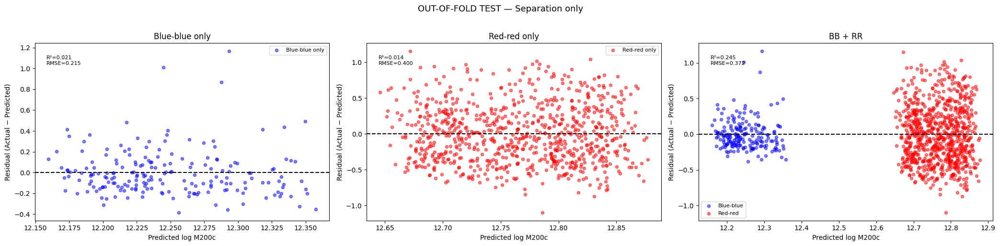

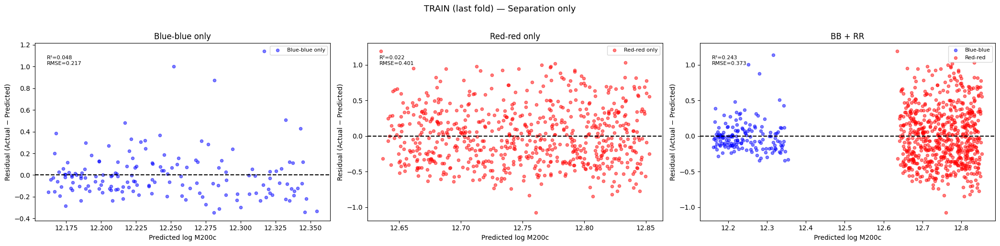

Model: v_r + separation


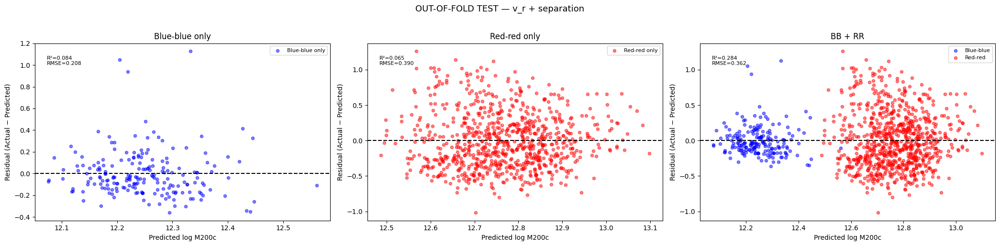

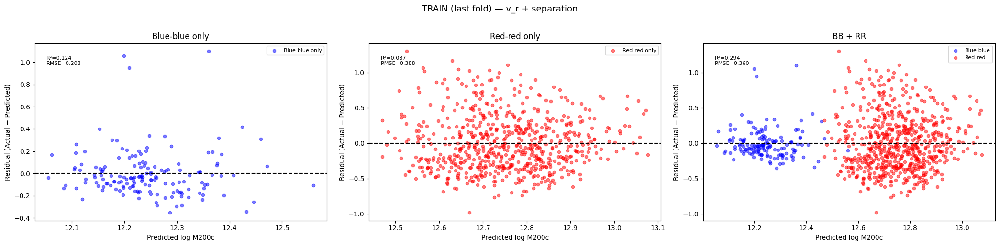

Model: v_r + v_t + separation


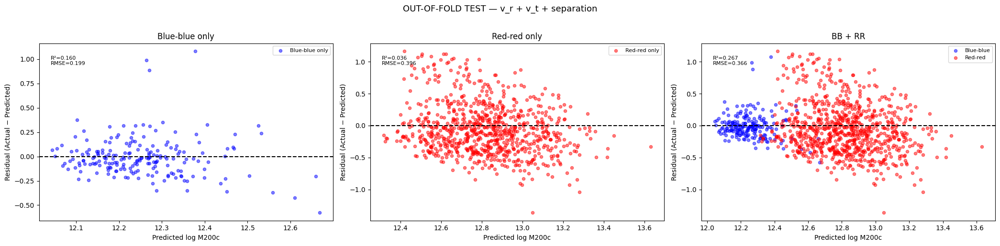

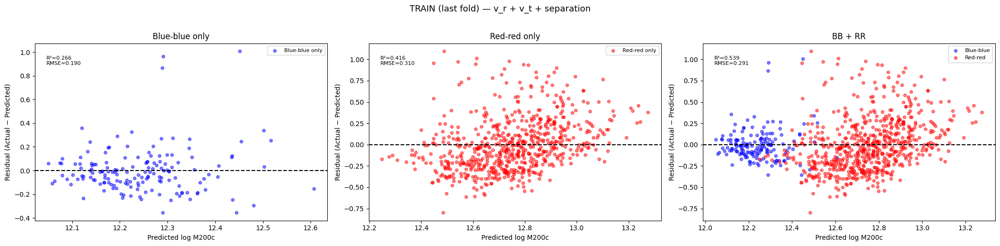

Model: v_r + v_t + separation + M_*


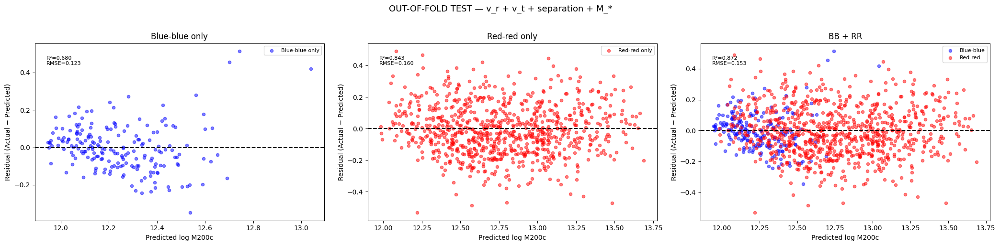

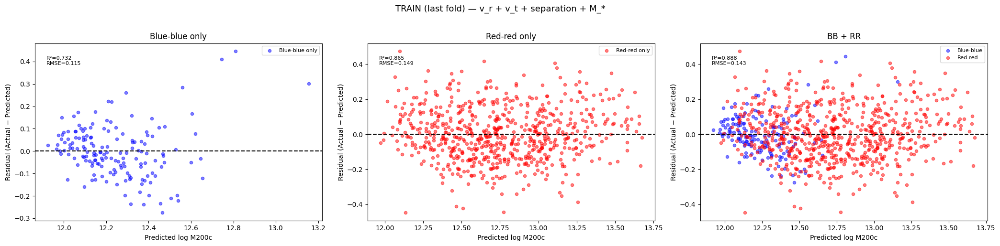

Model: v_r + v_t + separation + L_K


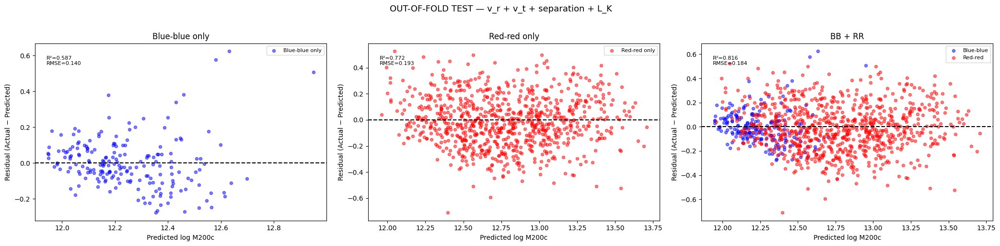

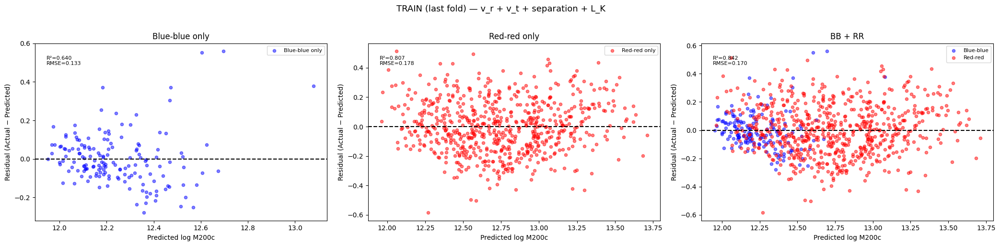

Model comparison summary
Separation only
  R²   : 0.245
  RMSE : 0.372 dex

v_r + separation
  R²   : 0.284
  RMSE : 0.362 dex

v_r + v_t + separation
  R²   : 0.267
  RMSE : 0.366 dex

v_r + v_t + separation + M_*
  R²   : 0.872
  RMSE : 0.153 dex

v_r + v_t + separation + L_K
  R²   : 0.816
  RMSE : 0.184 dex



In [31]:
# Residual plots for all models

def make_residual_row(y_true, y_pred, bb, rr, suptitle, lims=None):
    fig, axes = plt.subplots(1, 3, figsize=(21, 5))
    fig.suptitle(suptitle, fontsize=13, y=1.02)

    resid = y_true - y_pred
    if lims is None:
        lims = [y_true.min() - 0.1, y_true.max() + 0.1]

    panel_configs = [
        ('Blue-blue only', bb,        'blue'),
        ('Red-red only',   rr,        'red'),
        ('BB + RR',        bb | rr,   None),
    ]

    for ax, (label, mask, color) in zip(axes, panel_configs):

        if color is None:
            ax.scatter(y_pred[bb & mask], resid[bb & mask],
                       alpha=0.5, color='blue', s=20, label='Blue-blue')
            ax.scatter(y_pred[rr & mask], resid[rr & mask],
                       alpha=0.5, color='red', s=20, label='Red-red')
            ax.legend(fontsize=8)
        else:
            ax.scatter(y_pred[mask], resid[mask],
                       alpha=0.5, color=color, s=20, label=label)
            ax.legend(fontsize=8)

        ax.axhline(0, color='black', linestyle='--', linewidth=1.5)
        ax.set_xlabel('Predicted log M200c')
        ax.set_ylabel('Residual (Actual − Predicted)')
        ax.set_title(label)

        if mask.sum() > 1:
            r2 = r2_score(y_true[mask], y_pred[mask])
            rmse = np.sqrt(mean_squared_error(y_true[mask], y_pred[mask]))
            ax.annotate(f'R²={r2:.3f}\nRMSE={rmse:.3f}',
                        xy=(0.04, 0.93),
                        xycoords='axes fraction',
                        fontsize=8,
                        va='top')

    plt.tight_layout()
    plt.show()

bb_mask = group == 1   
rr_mask = group == 2   
results_summary = {}

for MODEL_TO_PLOT, cfg in MODEL_CONFIGS.items():

    print(f"Model: {cfg['label']}")

    # TEST (OOF)
    oof_pred = all_results[MODEL_TO_PLOT]["oof_y_pred_test"]

    make_residual_row(
        log_m200c,
        oof_pred,
        bb_mask,
        rr_mask,
        suptitle=f'OUT-OF-FOLD TEST — {cfg["label"]}'
    )

    # store metrics
    results_summary[MODEL_TO_PLOT] = {
        "r2": r2_score(log_m200c, oof_pred),
        "rmse": np.sqrt(mean_squared_error(log_m200c, oof_pred))
    }

    # TRAIN (last fold)
    last_train_idx, last_y_pred_train = all_results[MODEL_TO_PLOT]["oof_y_pred_train"][N_FOLDS - 1]

    y_train_last  = log_m200c[last_train_idx]
    g_train_last  = group[last_train_idx]
    bb_train_last = g_train_last == 1
    rr_train_last = g_train_last == 2

    make_residual_row(
        y_train_last,
        last_y_pred_train,
        bb_train_last,
        rr_train_last,
        suptitle=f'TRAIN (last fold) — {cfg["label"]}'
    )

print("Model comparison summary")

for model, res in results_summary.items():
    print(f"{MODEL_CONFIGS[model]['label']}")
    print(f"  R²   : {res['r2']:.3f}")
    print(f"  RMSE : {res['rmse']:.3f} dex\n")


## 14. Comparison of all the BB posteriors

<>:27: SyntaxWarning: invalid escape sequence '\o'
<>:44: SyntaxWarning: invalid escape sequence '\o'
<>:27: SyntaxWarning: invalid escape sequence '\o'
<>:44: SyntaxWarning: invalid escape sequence '\o'
/run/nvme/job_34084211/tmp/ipykernel_1380377/4280385932.py:27: SyntaxWarning: invalid escape sequence '\o'
  ax_bb.set_xlabel("log M200c [M$_{\odot}$]", fontsize=12)
/run/nvme/job_34084211/tmp/ipykernel_1380377/4280385932.py:44: SyntaxWarning: invalid escape sequence '\o'
  ax_rr.set_xlabel("log M200c [M$_{\odot}$]", fontsize=12)


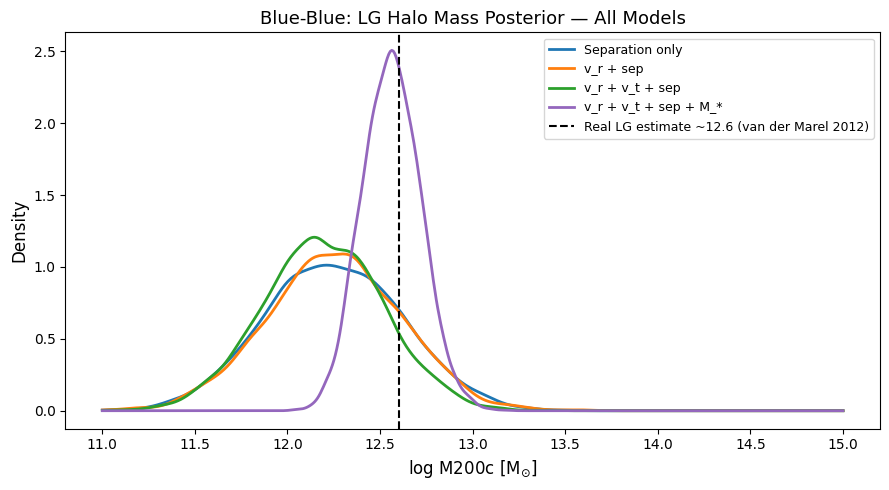

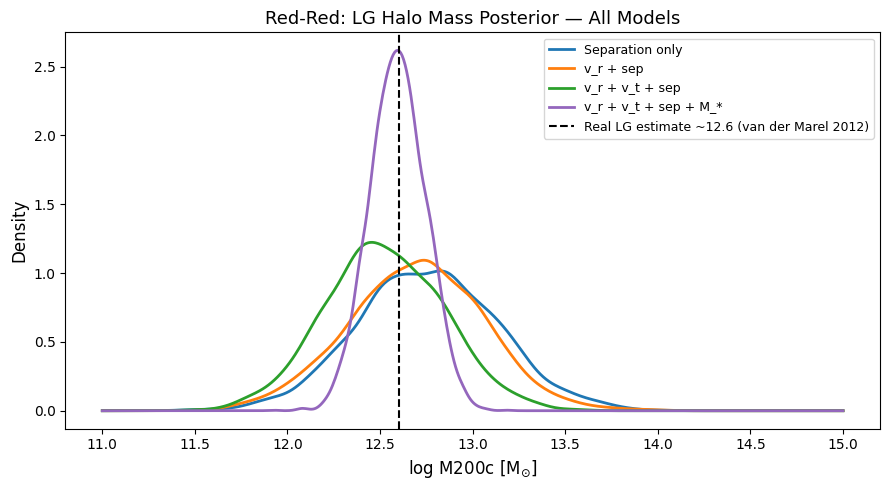

In [32]:
from scipy.stats import gaussian_kde
import numpy as np
import matplotlib.pyplot as plt

# Collect y_lg_bb and y_lg_rr from all models
model_fits = {
    "Separation only":        fitr1,
    "v_r + sep":              fitvr1,
    "v_r + v_t + sep":        fitvt1,
    "v_r + v_t + sep + M_*":  fitsm1,
}

colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#9467bd"]

x_grid = np.linspace(11.0, 15.0, 500)

# Blue-blue plot
fig_bb, ax_bb = plt.subplots(figsize=(9, 5))

for (name, fit), color in zip(model_fits.items(), colors):
    samples = fit.stan_variable("y_lg_bb")
    kde = gaussian_kde(samples, bw_method="scott")
    ax_bb.plot(x_grid, kde(x_grid), color=color, linewidth=2, label=name)

ax_bb.axvline(12.6, color="black", linestyle="--", linewidth=1.5,
              label="Real LG estimate ~12.6 (van der Marel 2012)")
ax_bb.set_xlabel("log M200c [M$_{\odot}$]", fontsize=12)
ax_bb.set_ylabel("Density", fontsize=12)
ax_bb.set_title("Blue-Blue: LG Halo Mass Posterior — All Models", fontsize=13)
ax_bb.legend(fontsize=9)
plt.tight_layout()
plt.show()

# Red-red plot
fig_rr, ax_rr = plt.subplots(figsize=(9, 5))

for (name, fit), color in zip(model_fits.items(), colors):
    samples = fit.stan_variable("y_lg_rr")
    kde = gaussian_kde(samples, bw_method="scott")
    ax_rr.plot(x_grid, kde(x_grid), color=color, linewidth=2, label=name)

ax_rr.axvline(12.6, color="black", linestyle="--", linewidth=1.5,
              label="Real LG estimate ~12.6 (van der Marel 2012)")
ax_rr.set_xlabel("log M200c [M$_{\odot}$]", fontsize=12)
ax_rr.set_ylabel("Density", fontsize=12)
ax_rr.set_title("Red-Red: LG Halo Mass Posterior — All Models", fontsize=13)
ax_rr.legend(fontsize=9)
plt.tight_layout()
plt.show()

<>:28: SyntaxWarning: invalid escape sequence '\o'
<>:45: SyntaxWarning: invalid escape sequence '\o'
<>:28: SyntaxWarning: invalid escape sequence '\o'
<>:45: SyntaxWarning: invalid escape sequence '\o'
/run/nvme/job_34084211/tmp/ipykernel_1380377/4286050739.py:28: SyntaxWarning: invalid escape sequence '\o'
  ax_bb.set_xlabel("log total virial mass [M$_{\odot}$]", fontsize=12)
/run/nvme/job_34084211/tmp/ipykernel_1380377/4286050739.py:45: SyntaxWarning: invalid escape sequence '\o'
  ax_rr.set_xlabel("log total virial mass [M$_{\odot}$]", fontsize=12)


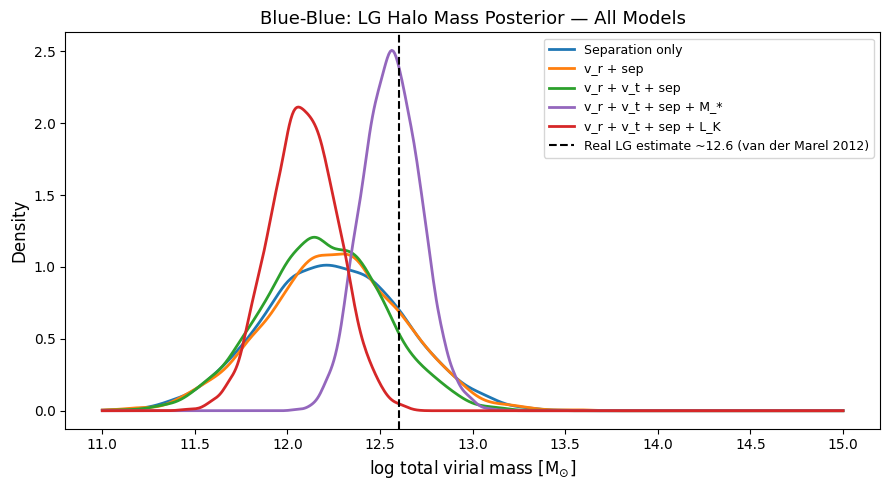

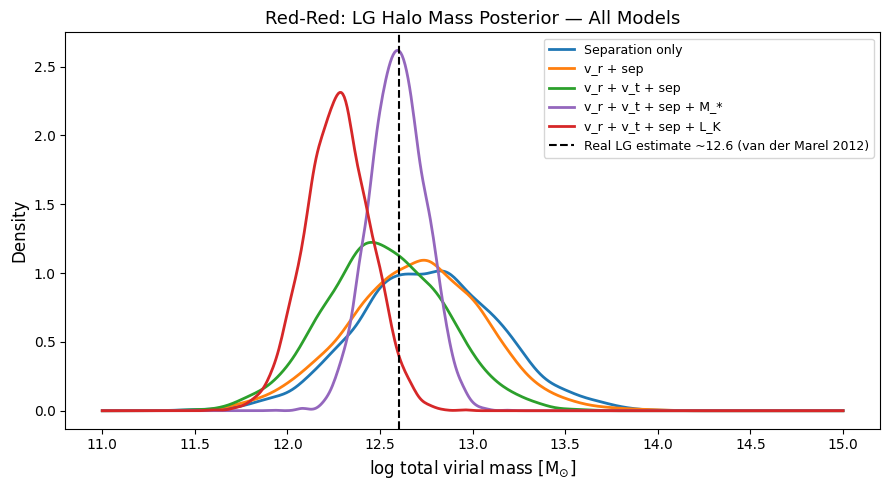

In [33]:
from scipy.stats import gaussian_kde
import numpy as np
import matplotlib.pyplot as plt

# Collect y_lg_bb and y_lg_rr from all models
model_fits = {
    "Separation only":        fitr1,
    "v_r + sep":              fitvr1,
    "v_r + v_t + sep":        fitvt1,
    "v_r + v_t + sep + M_*":  fitsm1,
    "v_r + v_t + sep + L_K":  fitkb1,
}

colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#9467bd", "#d62728"]

x_grid = np.linspace(11.0, 15.0, 500)

# Blue-blue plot
fig_bb, ax_bb = plt.subplots(figsize=(9, 5))

for (name, fit), color in zip(model_fits.items(), colors):
    samples = fit.stan_variable("y_lg_bb")
    kde = gaussian_kde(samples, bw_method="scott")
    ax_bb.plot(x_grid, kde(x_grid), color=color, linewidth=2, label=name)

ax_bb.axvline(12.6, color="black", linestyle="--", linewidth=1.5,
              label="Real LG estimate ~12.6 (van der Marel 2012)")
ax_bb.set_xlabel("log total virial mass [M$_{\odot}$]", fontsize=12)
ax_bb.set_ylabel("Density", fontsize=12)
ax_bb.set_title("Blue-Blue: LG Halo Mass Posterior — All Models", fontsize=13)
ax_bb.legend(fontsize=9)
plt.tight_layout()
plt.show()

# Red-red plot
fig_rr, ax_rr = plt.subplots(figsize=(9, 5))

for (name, fit), color in zip(model_fits.items(), colors):
    samples = fit.stan_variable("y_lg_rr")
    kde = gaussian_kde(samples, bw_method="scott")
    ax_rr.plot(x_grid, kde(x_grid), color=color, linewidth=2, label=name)

ax_rr.axvline(12.6, color="black", linestyle="--", linewidth=1.5,
              label="Real LG estimate ~12.6 (van der Marel 2012)")
ax_rr.set_xlabel("log total virial mass [M$_{\odot}$]", fontsize=12)
ax_rr.set_ylabel("Density", fontsize=12)
ax_rr.set_title("Red-Red: LG Halo Mass Posterior — All Models", fontsize=13)
ax_rr.legend(fontsize=9)
plt.tight_layout()
plt.show()

## 15. R^2 and RMSE values for each of the models for the training and test data

In [34]:
import pandas as pd
# Per-model, per-fold table
print("=" * 75)
print("  5-FOLD CV — R² and RMSE SUMMARY (Train & Test) — ALL MODELS")
print("=" * 75)

summary_rows = []

for model_key, res in all_results.items():
    label = MODEL_CONFIGS[model_key]["label"]
    fm    = res["fold_metrics"]

    for m in fm:
        summary_rows.append({
            "Model":        label,
            "Fold":         m["fold"],
            "Train R²":     round(m["r2_train"],   3),
            "Test R²":      round(m["r2_test"],    3),
            "Test R² (BB)": round(m["r2_test_bb"], 3),
            "Test R² (RR)": round(m["r2_test_rr"], 3),
            "Test RMSE":    round(m["rmse_test"],  3),
        })

df = pd.DataFrame(summary_rows)
print(df.to_string(index=False))

# Mean ± std across folds, per model
print("\n" + "=" * 75)
print("  MEAN ± STD ACROSS FOLDS")
print("=" * 75)

agg = (
    df.groupby("Model")
    .agg(
        Train_R2_mean  = ("Train R²",     "mean"),
        Train_R2_std   = ("Train R²",     "std"),
        Test_R2_mean   = ("Test R²",      "mean"),
        Test_R2_std    = ("Test R²",      "std"),
        Test_BB_mean   = ("Test R² (BB)", "mean"),
        Test_RR_mean   = ("Test R² (RR)", "mean"),
        Test_RMSE_mean = ("Test RMSE",    "mean"),
        Test_RMSE_std  = ("Test RMSE",    "std"),
    )
    .round(3)
)

for model_key in MODEL_CONFIGS:
    label = MODEL_CONFIGS[model_key]["label"]
    if label not in agg.index:
        continue
    r = agg.loc[label]
    print(f"\n  {label}")
    print(f"    Train R²:    {r.Train_R2_mean:.3f} ± {r.Train_R2_std:.3f}")
    print(f"    Test  R²:    {r.Test_R2_mean:.3f} ± {r.Test_R2_std:.3f}")
    print(f"    Test  R² BB: {r.Test_BB_mean:.3f}")
    print(f"    Test  R² RR: {r.Test_RR_mean:.3f}")
    print(f"    Test  RMSE:  {r.Test_RMSE_mean:.3f} ± {r.Test_RMSE_std:.3f} dex")

  5-FOLD CV — R² and RMSE SUMMARY (Train & Test) — ALL MODELS
                       Model  Fold  Train R²  Test R²  Test R² (BB)  Test R² (RR)  Test RMSE
             Separation only     1     0.242    0.268         0.058         0.034      0.380
             Separation only     2     0.250    0.244         0.044         0.032      0.353
             Separation only     3     0.255    0.214        -0.009        -0.019      0.381
             Separation only     4     0.257    0.220        -0.049         0.015      0.379
             Separation only     5     0.243    0.258        -0.042        -0.025      0.364
            v_r + separation     1     0.300    0.253         0.136         0.010      0.384
            v_r + separation     2     0.293    0.293         0.167         0.086      0.341
            v_r + separation     3     0.291    0.281        -0.050         0.073      0.364
            v_r + separation     4     0.288    0.306        -0.033         0.130      0.358
        


  Separation only
    Train R²:    0.249 ± 0.007
    Test  R²:    0.241 ± 0.023
    Test  R² BB: 0.000
    Test  R² RR: 0.007
    Test  RMSE:  0.371 ± 0.012 dex

  v_r + separation
    Train R²:    0.293 ± 0.004
    Test  R²:    0.281 ± 0.020
    Test  R² BB: 0.046
    Test  R² RR: 0.058
    Test  RMSE:  0.361 ± 0.015 dex

  v_r + v_t + separation
    Train R²:    0.502 ± 0.028
    Test  R²:    0.265 ± 0.076
    Test  R² BB: 0.115
    Test  R² RR: 0.030
    Test  RMSE:  0.365 ± 0.025 dex

  v_r + v_t + separation + M_*
    Train R²:    0.884 ± 0.004
    Test  R²:    0.870 ± 0.014
    Test  R² BB: 0.638
    Test  R² RR: 0.841
    Test  RMSE:  0.153 ± 0.004 dex

  v_r + v_t + separation + L_K
    Train R²:    0.835 ± 0.005
    Test  R²:    0.814 ± 0.016
    Test  R² BB: 0.535
    Test  R² RR: 0.768
    Test  RMSE:  0.184 ± 0.004 dex


In [35]:
for name, obj in fmodel_data.items():
    fit = obj["fit"]
    alpha = fit.stan_variable('alpha')          # shape (draws, 2)
    sigma_alpha = fit.stan_variable('sigma_alpha')  # shape (draws,)
    
    print(f"\n=== {name} ===")
    print(f"  alpha[1] (BB): {alpha[:, 0].mean():.3f} ± {alpha[:, 0].std():.3f}")
    print(f"  alpha[2] (RR): {alpha[:, 1].mean():.3f} ± {alpha[:, 1].std():.3f}")
    print(f"  difference:    {(alpha[:,1] - alpha[:,0]).mean():.3f} ± {(alpha[:,1] - alpha[:,0]).std():.3f}")
    print(f"  sigma_alpha:   {sigma_alpha.mean():.3f} ± {sigma_alpha.std():.3f}")


=== r only ===
  alpha[1] (BB): 12.256 ± 0.027
  alpha[2] (RR): 12.764 ± 0.013
  difference:    0.508 ± 0.030
  sigma_alpha:   0.447 ± 0.273

=== vr + sep ===
  alpha[1] (BB): 12.296 ± 0.029
  alpha[2] (RR): 12.753 ± 0.012
  difference:    0.457 ± 0.032
  sigma_alpha:   0.410 ± 0.266

=== vt model ===
  alpha[1] (BB): 12.331 ± 0.029
  alpha[2] (RR): 12.792 ± 0.013
  difference:    0.462 ± 0.032
  sigma_alpha:   0.412 ± 0.264

=== stellar mass ===
  alpha[1] (BB): 12.580 ± 0.023
  alpha[2] (RR): 12.673 ± 0.006
  difference:    0.093 ± 0.024
  sigma_alpha:   0.186 ± 0.178

=== K-band ===
  alpha[1] (BB): 12.448 ± 0.020
  alpha[2] (RR): 12.721 ± 0.007
  difference:    0.273 ± 0.021
  sigma_alpha:   0.315 ± 0.231


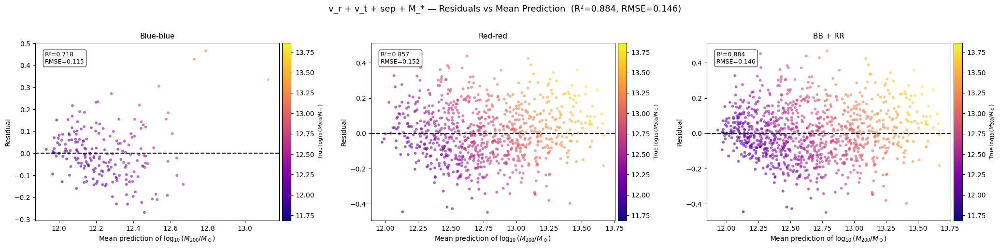

In [36]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error

cmap = plt.cm.plasma

model_plot_data = {
    "v_r + v_t + sep + M_*":  fitsm1,
}

for model_name, fit in model_plot_data.items():

    y_pred = fit.stan_variable("y_rep").mean(axis=0)
    resid  = log_m200c - y_pred

    panel_configs = [
        ("Blue-blue", group == 1),
        ("Red-red",   group == 2),
        ("BB + RR",   np.ones(len(group), dtype=bool)),
    ]

    vmin, vmax = log_m200c.min(), log_m200c.max()
    norm = Normalize(vmin=vmin, vmax=vmax)

    fig, axes = plt.subplots(1, 3, figsize=(21, 5))
    r2_all   = r2_score(log_m200c, y_pred)
    rmse_all = np.sqrt(mean_squared_error(log_m200c, y_pred))
    fig.suptitle(
        f"{model_name} — Residuals vs Mean Prediction  "
        f"(R²={r2_all:.3f}, RMSE={rmse_all:.3f})",
        fontsize=13, y=1.02
    )

    for ax, (label, mask) in zip(axes, panel_configs):

        sc = ax.scatter(
            y_pred[mask], resid[mask],
            c=log_m200c[mask],
            cmap=cmap, norm=norm,
            alpha=0.6, s=18, linewidths=0,
        )

        ax.axhline(0, color="black", linestyle="--", linewidth=1.5)
        ax.set_xlabel("Mean prediction of $\\log_{10}(M_{200}/M_\\odot)$", fontsize=10)
        ax.set_ylabel("Residual", fontsize=10)
        ax.set_title(label, fontsize=11)

        if mask.sum() > 1:
            r2   = r2_score(log_m200c[mask], y_pred[mask])
            rmse = np.sqrt(mean_squared_error(log_m200c[mask], y_pred[mask]))
            ax.annotate(
                f"R²={r2:.3f}\nRMSE={rmse:.3f}",
                xy=(0.04, 0.95), xycoords="axes fraction",
                fontsize=9, va="top",
                bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.7),
            )

        cb = fig.colorbar(ScalarMappable(norm=norm, cmap=cmap), ax=ax, pad=0.01)
        cb.set_label("True $\\log_{10}(M_{200}/M_\\odot)$", fontsize=8)

    plt.tight_layout()
    plt.show()

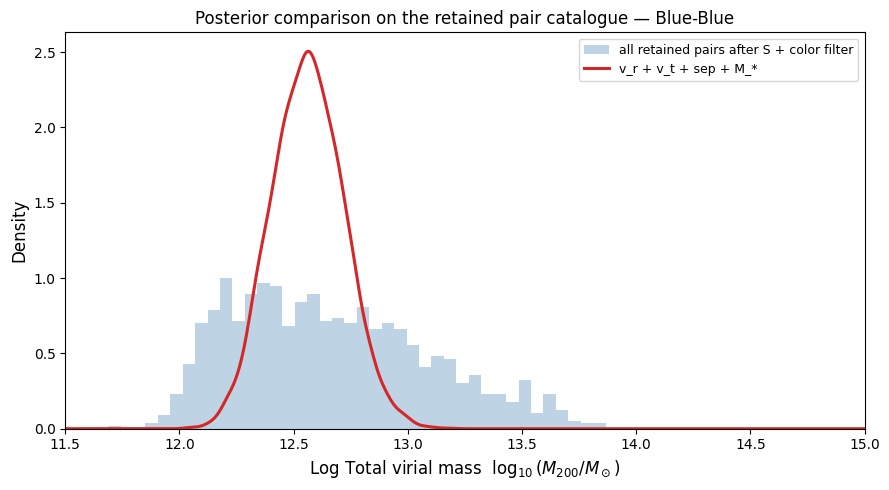

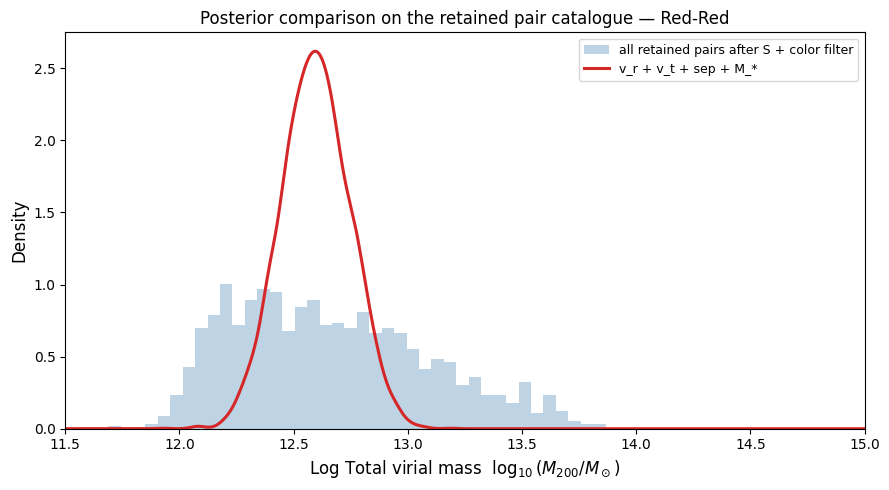

In [37]:
from scipy.stats import gaussian_kde
import numpy as np
import matplotlib.pyplot as plt

model_fits_all = {
    "v_r + v_t + sep + M_*":  (fitsm1, "#d62728"),
}

x_grid = np.linspace(11.0, 15.5, 600)

for lg_var, title_suffix in [("y_lg_bb", "Blue-Blue"), ("y_lg_rr", "Red-Red")]:

    fig, ax = plt.subplots(figsize=(9, 5))

    ax.hist(
        log_m200c,
        bins=40,
        density=True,
        color="steelblue",
        alpha=0.35,
        label="all retained pairs after S + color filter",
        zorder=1,
    )

    for model_name, (fit, color) in model_fits_all.items():
        samples = fit.stan_variable(lg_var)
        kde     = gaussian_kde(samples, bw_method="scott")
        ax.plot(
            x_grid, kde(x_grid),
            color=color,
            linewidth=2.2,
            label=model_name,
            zorder=2,
        )

    ax.set_xlabel("Log Total virial mass  $\\log_{10}(M_{200}/M_\\odot)$", fontsize=12)
    ax.set_ylabel("Density", fontsize=12)
    ax.set_title(
        f"Posterior comparison on the retained pair catalogue — {title_suffix}",
        fontsize=12,
    )
    ax.legend(fontsize=9, loc="upper right")
    ax.set_xlim(11.5, 15.0)
    plt.tight_layout()
    plt.show()

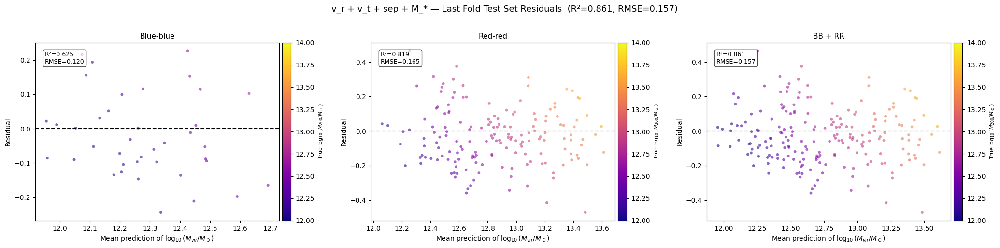

In [38]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error

cmap = plt.cm.plasma

last_train_idx, last_y_pred_train = all_results["stellar"]["oof_y_pred_train"][N_FOLDS - 1]
all_idx        = np.arange(len(log_m200c))
last_test_idx  = np.setdiff1d(all_idx, last_train_idx)

y_true_test = log_m200c[last_test_idx]
y_pred_test = all_results["stellar"]["oof_y_pred_test"][last_test_idx]
group_test  = group[last_test_idx]
resid       = y_true_test - y_pred_test

panel_configs = [
    ("Blue-blue", group_test == 1),
    ("Red-red",   group_test == 2),
    ("BB + RR",   np.ones(len(group_test), dtype=bool)),
]

norm = Normalize(vmin=12.0, vmax=14.0)

r2_all   = r2_score(y_true_test, y_pred_test)
rmse_all = np.sqrt(mean_squared_error(y_true_test, y_pred_test))

fig, axes = plt.subplots(1, 3, figsize=(21, 5))
fig.suptitle(
    f"v_r + v_t + sep + M_* — Last Fold Test Set Residuals  "
    f"(R²={r2_all:.3f}, RMSE={rmse_all:.3f})",
    fontsize=13, y=1.02
)

for ax, (label, mask) in zip(axes, panel_configs):

    ax.scatter(
        y_pred_test[mask], resid[mask],
        c=y_true_test[mask],
        cmap=cmap, norm=norm,
        alpha=0.6, s=18, linewidths=0,
    )

    ax.axhline(0, color="black", linestyle="--", linewidth=1.5)
    ax.set_xlabel("Mean prediction of $\\log_{10}(M_{vir}/M_\\odot)$", fontsize=10)
    ax.set_ylabel("Residual", fontsize=10)
    ax.set_title(label, fontsize=11)

    if mask.sum() > 1:
        r2   = r2_score(y_true_test[mask], y_pred_test[mask])
        rmse = np.sqrt(mean_squared_error(y_true_test[mask], y_pred_test[mask]))
        ax.annotate(
            f"R²={r2:.3f}\nRMSE={rmse:.3f}",
            xy=(0.04, 0.95), xycoords="axes fraction",
            fontsize=9, va="top",
            bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.7),
        )

    cb = fig.colorbar(ScalarMappable(norm=norm, cmap=cmap), ax=ax, pad=0.01)
    cb.set_label("True $\\log_{10}(M_{200}/M_\\odot)$", fontsize=8)

plt.tight_layout()
plt.show()